<a href="https://colab.research.google.com/github/MerArch/Forecast_timeseries/blob/main/TIMESERIESHYBRIDMODELS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# TIME SERIES MODELS

* ARIMA
* GARCH

# HYBRID MODELS

* ARIMA+CATBOOST(AVG)
* ARIMA+CATBOOST(WEIGHT)
* LSTM + ARIMA (AVG)
* LSTM + CATBOOST (AVG)
* LSTM + CATBOOST (WEIGHT)



The below codes is training the data using time series models like ARIMA and GARCH. Since the training scores were relatively better than other models. And Hybrid model is build to further reduced the MAE and RMSE value.

Install the necessary packages .
* ta
* arch
* optuna
* numpy version

In [ ]:
!pip install ta

In [ ]:
pip install optuna

Note: you may need to restart the kernel to use updated packages.


In [ ]:
!pip install arch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.4/983.4 kB 18.1 MB/s eta 0:00:00a 0:00:01


In [ ]:
!pip install numpy>=1.16.5

Importing all the libraries and packages needed to run ARIMA and GARCH models

In [ ]:
import os
import glob
from joblib import Parallel, delayed
import pandas as pd
import numpy as np
import scipy as sc
from sklearn.model_selection import KFold
import warnings

import os
import glob
from joblib import Parallel, delayed
import pandas as pd
import numpy as np
import scipy as sc
from sklearn.model_selection import KFold
import warnings
warnings.filterwarnings('ignore')
from tqdm import tqdm
import joblib
from statsmodels.tsa.arima.model import ARIMA as ARIMA
from arch import arch_model
pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 200)
pd.options.mode.chained_assignment = None
import warnings
warnings.filterwarnings('ignore')

from tqdm import tqdm
import joblib
from statsmodels.tsa.arima.model import ARIMA as ARIMA
from arch import arch_model
pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 200)
pd.options.mode.chained_assignment = None
warnings.filterwarnings('ignore')

In [ ]:
from sklearn import set_config
from sklearn.base import clone
from sklearn.preprocessing import FunctionTransformer
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import TimeSeriesSplit
# the below is the measures on which the model will be evaluated and compared
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from math import sqrt
import pickle

# the below are the gradient boost models that will be trained using the given data
# import xgboost as xgb
# import lightgbm as lgb
# from catboost import CatBoostRegressor
# import catboost as cbt
import joblib
#
from sklearn.model_selection import KFold
import optuna
import ta
#
import warnings
warnings.filterwarnings('ignore')
from tqdm import tqdm
import joblib
# the below are for visualisations to support analytics
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style = 'white', palette = 'viridis')
# pal
pal_col = sns.color_palette('viridis')
from statsmodels.tsa.arima.model import ARIMA as ARIMA
from arch import arch_model
pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 200)
pd.options.mode.chained_assignment = None
set_config(transform_output = 'pandas')


### Loading Tarining data and changing to relevant datatypes

Change data types to :
* Reduce the memory footprint
* May run faster due to reduced memory usage and optimized computation.
* Some libraries or functions may expect specific data types for compatibility

In [ ]:
train_dtypes = {
    'stock_id' : np.uint8,
    'date_id' : np.uint16,
    'seconds_in_bucket' : np.uint16,
    'imbalance_buy_sell_flag' : np.int8,
    'time_id' : np.uint16
    }

train_data = pd.read_csv('/kaggle/input/datareqdstkpred/optiver-trading-at-the-close/train.csv', dtype = train_dtypes)

#### Loading Test data and changing to relevant datatypes

In [ ]:
test_dtypes = {
    'stock_id' : np.uint8,
    'date_id' : np.uint16,
    'seconds_in_bucket' : np.uint16,
    'imbalance_buy_sell_flag' : np.int8,
    'time_id' : np.uint16
    }

test_data = pd.read_csv('/kaggle/input/datareqdstkpred/optiver-trading-at-the-close/example_test_files/test.csv', dtype = test_dtypes)

#### The actual target values column is present in the below dataset. So loading the same

In [ ]:
print(test_data)

       stock_id  date_id  seconds_in_bucket  imbalance_size  \
0             0      478                  0      3753451.43   
1             1      478                  0       985977.11   
2             2      478                  0       599128.74   
3             3      478                  0      2872317.54   
4             4      478                  0       740059.14   
...         ...      ...                ...             ...   
32995       195      480                540      2440722.89   
32996       196      480                540       349510.47   
32997       197      480                540            0.00   
32998       198      480                540      1000898.84   
32999       199      480                540      1884285.71   

       imbalance_buy_sell_flag  reference_price  matched_size  far_price  \
0                           -1         0.999875   11548975.43        NaN   
1                           -1         1.000245    3850033.97        NaN   
2              

In [ ]:
test_data.columns

Index(['stock_id', 'date_id', 'seconds_in_bucket', 'imbalance_size',
       'imbalance_buy_sell_flag', 'reference_price', 'matched_size',
       'far_price', 'near_price', 'bid_price', 'bid_size', 'ask_price',
       'ask_size', 'wap', 'time_id', 'row_id', 'currently_scored'],
      dtype='object')

In [ ]:
# Remove NaN values from specific columns to better the training
columns_clean = ['stock_id', 'date_id', 'seconds_in_bucket', 'imbalance_size',
       'imbalance_buy_sell_flag', 'reference_price', 'matched_size',
       'far_price', 'near_price', 'bid_price', 'bid_size', 'ask_price',
       'ask_size', 'wap', 'time_id', 'row_id', 'currently_scored']
test_data.dropna(subset=columns_clean, inplace=True)


In [ ]:
test_data.dropna(subset=columns_clean, inplace=True)

* **TimeSeriesCV**: This function implements a time-series cross-validation strategy. Given a DataFrame of date IDs (date_ids) and the size of the holdout set (holdout_size), it splits the data into train and validation sets based on date IDs.

* **L1Loss:** This function calculates the mean absolute error (MAE) between the true values (y_true) and the predicted values (y_pred).

* **L2Loss:** Similar to L1Loss,but ensures that both y_true and y_pred are converted to arrays and reshaped if needed before calculating the mean absolute error.


In [ ]:
# data_dir = 'kaggle competitions download -c optiver-trading-at-the-close'

# def TimeSeriesCV(date_ids, holdout_size):

#     X = date_ids[['date_id']]
#     groups = X['date_id'].values
#     unique_date_ids = np.unique(groups)
#     array_split_date_ids = np.array_split(unique_date_ids, len(unique_date_ids) // holdout_size)[::-1]
#     array_split_date_ids = np.flip(array_split_date_ids)

#     for date_ids in array_split_date_ids:


#         test_condition = X['date_id'].isin(np.array([date_ids[-1]]))
#         val_index = X.loc[test_condition].index
#         train_condition = X['date_id'].isin(date_ids)
#         train_index = X.loc[train_condition].index
#         train_index = pd.Index(set(train_index)- set(val_index))


#         yield train_index, val_index

def TimeSeriesCV(date_ids, holdout_size):
    X = date_ids[['date_id']]
    groups = X['date_id'].values
    unique_date_ids = np.unique(groups)

    # Split the unique date IDs into arrays of length holdout_size
    num_splits = len(unique_date_ids) // holdout_size
    array_split_date_ids = np.array_split(unique_date_ids, num_splits)

    # Ensure the last split array has length holdout_size
    last_split_length = len(array_split_date_ids[-1])
    if last_split_length < holdout_size:
        last_date_id = array_split_date_ids[-1][-1]
        missing_ids = np.arange(last_date_id + 1, last_date_id + 1 + holdout_size - last_split_length)
        array_split_date_ids[-1] = np.concatenate((array_split_date_ids[-1], missing_ids))

    # Reverse the order of the split arrays
    array_split_date_ids = array_split_date_ids[::-1]

    for date_ids in array_split_date_ids:
        test_condition = X['date_id'].isin(np.array([date_ids[-1]]))
        val_index = X.loc[test_condition].index

        train_condition = X['date_id'].isin(date_ids)
        train_index = X.loc[train_condition].index
        train_index = pd.Index(set(train_index) - set(val_index))

        yield train_index, val_index



def L1Loss(y_true, y_pred):
    return np.abs(y_true - y_pred).mean()



def L2Loss(y_true, y_pred):
    y_true = np.asarray(y_true)
    y_pred = np.asarray(y_pred)

    # Reshape arrays if needed to ensure compatibility
    if y_true.ndim == 2:
        y_true = y_true.squeeze()
    if y_pred.ndim == 2:
        y_pred = y_pred.squeeze()

    return np.abs(y_true - y_pred).mean()



def CustomLossMAE(y_pred, lgb_train):
    y_true = lgb_train.get_label()
    return 'MAE', L1Loss(y_true, y_pred), False

In [ ]:
print(train_data)

         stock_id  date_id  seconds_in_bucket  imbalance_size  \
0               0        0                  0      3180602.69   
1               1        0                  0       166603.91   
2               2        0                  0       302879.87   
3               3        0                  0     11917682.27   
4               4        0                  0       447549.96   
...           ...      ...                ...             ...   
5237975       195      480                540      2440722.89   
5237976       196      480                540       349510.47   
5237977       197      480                540            0.00   
5237978       198      480                540      1000898.84   
5237979       199      480                540      1884285.71   

         imbalance_buy_sell_flag  reference_price  matched_size  far_price  \
0                              1         0.999812   13380276.64        NaN   
1                             -1         0.999896    1642214.25

In [ ]:
train_data.columns

Index(['stock_id', 'date_id', 'seconds_in_bucket', 'imbalance_size',
       'imbalance_buy_sell_flag', 'reference_price', 'matched_size',
       'far_price', 'near_price', 'bid_price', 'bid_size', 'ask_price',
       'ask_size', 'wap', 'target', 'time_id', 'row_id'],
      dtype='object')

In [ ]:
# Remove NaN values from specific columns
columns_clean = ['stock_id', 'date_id', 'seconds_in_bucket', 'imbalance_size',
       'imbalance_buy_sell_flag', 'reference_price', 'matched_size',
       'far_price', 'near_price', 'bid_price', 'bid_size', 'ask_price',
       'ask_size', 'wap', 'target', 'time_id', 'row_id']
train_data.dropna(subset=columns_clean, inplace=True)


In [ ]:
train_data.dropna(subset=columns_clean, inplace=True)

In [ ]:
print(train_data)

         stock_id  date_id  seconds_in_bucket  imbalance_size  \
5730            0        0                300            0.00   
5731            1        0                300       242332.96   
5732            2        0                300            0.00   
5733            3        0                300      2914730.16   
5734            4        0                300      3396923.02   
...           ...      ...                ...             ...   
5237975       195      480                540      2440722.89   
5237976       196      480                540       349510.47   
5237977       197      480                540            0.00   
5237978       198      480                540      1000898.84   
5237979       199      480                540      1884285.71   

         imbalance_buy_sell_flag  reference_price  matched_size  far_price  \
5730                           0         1.000241   26670118.88   1.000241   
5731                          -1         1.000073    3242054.27

Load the actual target values to assess the test results

In [ ]:
revealed_tar = pd.read_csv('/kaggle/input/datareqdstkpred/optiver-trading-at-the-close/example_test_files/revealed_targets.csv')

In [ ]:
# import pandas as pd

# # Checking for missing values in each column
# missing_values = revealed_tar.isnull().sum()
# print("Columns with missing values:")
# print(missing_values[missing_values > 0])


Columns with missing values:
stock_id            162
revealed_target     162
revealed_date_id    162
revealed_time_id    162
dtype: int64


In [ ]:
# Remove NaN values from specific columns
columns_to_clean = ['stock_id', 'date_id', 'seconds_in_bucket', 'time_id',
       'revealed_target', 'revealed_date_id', 'revealed_time_id']
revealed_tar.dropna(subset=columns_to_clean, inplace=True)


In [ ]:
revealed_tar.dropna(subset=columns_to_clean, inplace=True)

In [ ]:
print(revealed_tar)

       stock_id  date_id  seconds_in_bucket  time_id  revealed_target  \
0           0.0      478                  0    26290        -2.310276   
1           1.0      478                  0    26290       -12.850165   
2           2.0      478                  0    26290        -0.439882   
3           3.0      478                  0    26290         7.259846   
4           4.0      478                  0    26290         4.780292   
...         ...      ...                ...      ...              ...   
33103     195.0      480                540    26400         1.599789   
33104     196.0      480                540    26400        -8.440018   
33105     197.0      480                540    26400         5.149841   
33106     198.0      480                540    26400        -0.249743   
33107     199.0      480                540    26400        -7.609725   

       revealed_date_id  revealed_time_id  
0                 477.0           26235.0  
1                 477.0           2

In [ ]:
data_rev = {
    'stock_id' : np.uint8,
    'date_id' : np.uint16,
    'seconds_in_bucket' : np.uint16,
    'time_id' : np.uint16
    }
#  Convert data types of selected columns
revealed_tar = revealed_tar.astype(data_rev)

# Display the DataFrame with transformed data types
print(revealed_tar)

       stock_id  date_id  seconds_in_bucket  time_id  revealed_target  \
0             0      478                  0    26290        -2.310276   
1             1      478                  0    26290       -12.850165   
2             2      478                  0    26290        -0.439882   
3             3      478                  0    26290         7.259846   
4             4      478                  0    26290         4.780292   
...         ...      ...                ...      ...              ...   
33103       195      480                540    26400         1.599789   
33104       196      480                540    26400        -8.440018   
33105       197      480                540    26400         5.149841   
33106       198      480                540    26400        -0.249743   
33107       199      480                540    26400        -7.609725   

       revealed_date_id  revealed_time_id  
0                 477.0           26235.0  
1                 477.0           2

Extra to determine parameters

In [ ]:
df_time = train_data.set_index('time_id')


Target values based on which the model is trained.

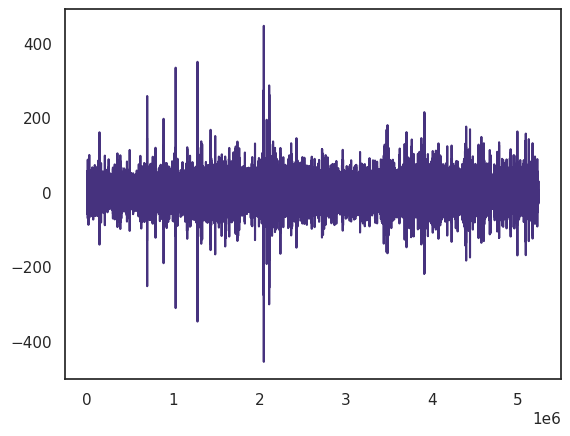

In [ ]:
diff = train_data['target'].diff()
plt.plot(diff)
plt.show()
diff = diff.dropna()

Target values that needs to be predicted and this test data target values have different spikes of volatility compared to the training target values as we can see from the plots.

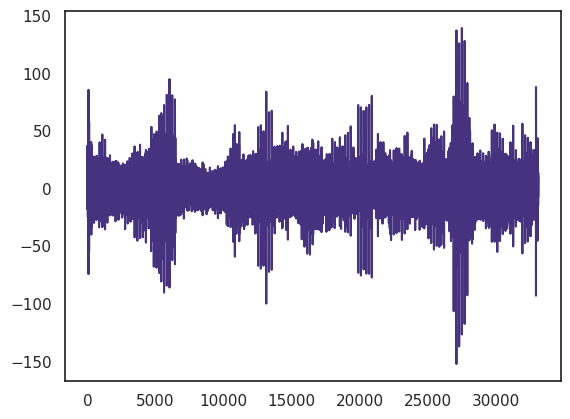

In [ ]:
diff = revealed_tar['revealed_target'].diff()
plt.plot(diff)
plt.show()
diff = diff.dropna()

### The below ADF test was attemptted to determine the data stationary or not but lack of GPU and CPU memory the code couldnot complete

In [ ]:
# from statsmodels.tsa.stattools import adfuller

# def adf_test(series):
#     result = adfuller(series)
#     if result[1] > 0.05:
#         print("Series is not stationary")
#     else:
#         print("Series is stationary")

# # We have'train_data' is the DataFrame and 'time_id' is the column containing the time series data
# adf_test(train_data['time_id'])


# ARIMA MODEL

* Input Data Handling: The function takes training data (trainA), testing data (test), and revealed target data (revealed_target) as input.

* Training and Cross-Validation: It iterates through cross-validation folds using time-series cross-validation (TimeSeriesCV), fitting an ARIMA model for each fold. The model's performance is evaluated using Mean Absolute Error (MAE) and Root Mean Squared Error (RMSE) on the validation set.

* Training Time: It measures and prints the training time for each fold.

* Model Training: After cross-validation, the function trains the final ARIMA model on the entire training dataset.

* Testing: It makes predictions on the test dataset using the trained ARIMA model and computes MAE on the test set. Additionally, it calculates the RMSE between predicted and actual values from CSV files.

* Testing Time: It measures and prints the testing time for making predictions on the test dataset.

* Visualization: The function visualizes the training and validation data, as well as the actual and forecasted values on both validation and test sets.

* Output: The function returns the trained ARIMA model (final_model).

trainset: 474 -- 479
val_set: 480 -- 480


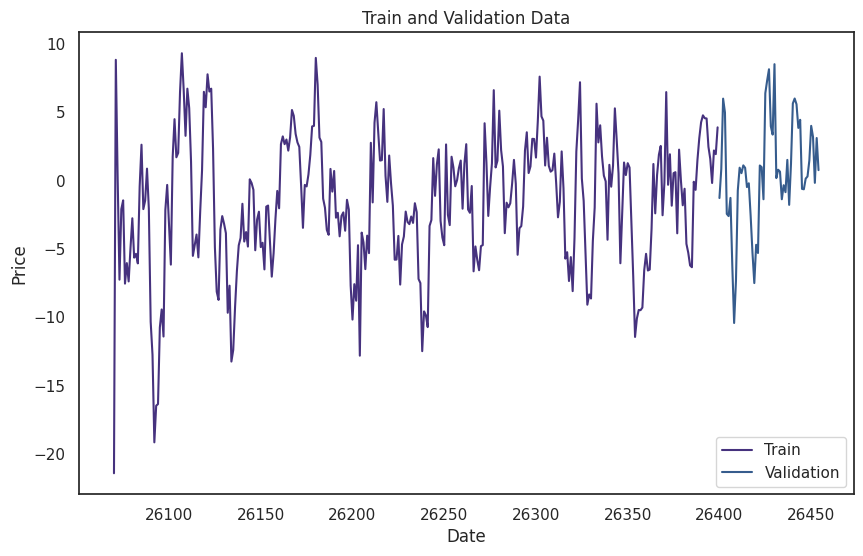

Forecasted Values: [ 3.78527933  3.26025945  3.1589953   0.99669151 -0.02229271 -1.49757526
 -0.9472847  -0.80860924 -0.94458992 -0.93698582 -0.91364129 -0.92076956
 -0.92335083 -0.9213971  -0.9213972  -0.92175935 -0.92167062 -0.92162522
 -0.92165279 -0.92165445 -0.92164893 -0.92164998 -0.92165074 -0.92165036
 -0.92165031 -0.9216504  -0.92165039 -0.92165037 -0.92165038 -0.92165038
 -0.92165038 -0.92165038 -0.92165038 -0.92165038 -0.92165038 -0.92165038
 -0.92165038 -0.92165038 -0.92165038 -0.92165038 -0.92165038 -0.92165038
 -0.92165038 -0.92165038 -0.92165038 -0.92165038 -0.92165038 -0.92165038
 -0.92165038 -0.92165038 -0.92165038 -0.92165038 -0.92165038 -0.92165038
 -0.92165038]
MAE: 3.2753189850334987
RMSE: 4.155718184293812


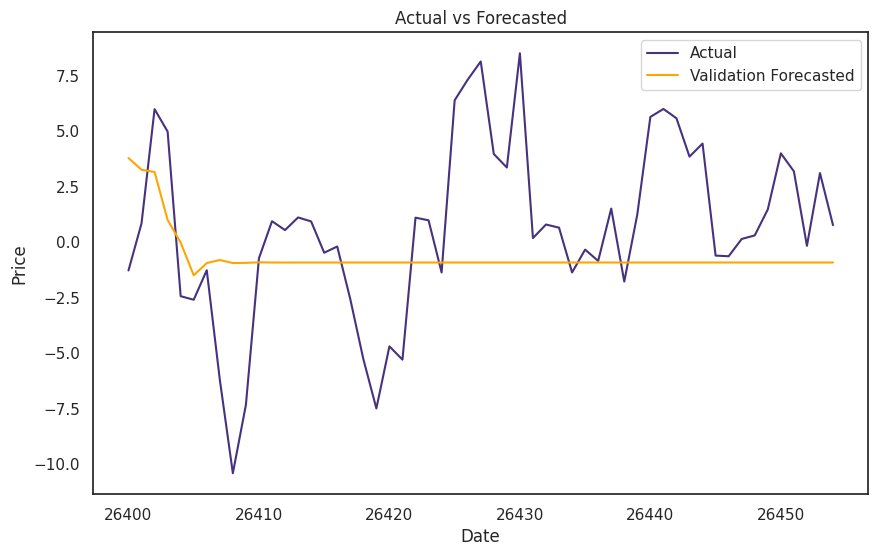

trainset: 467 -- 472
val_set: 473 -- 473


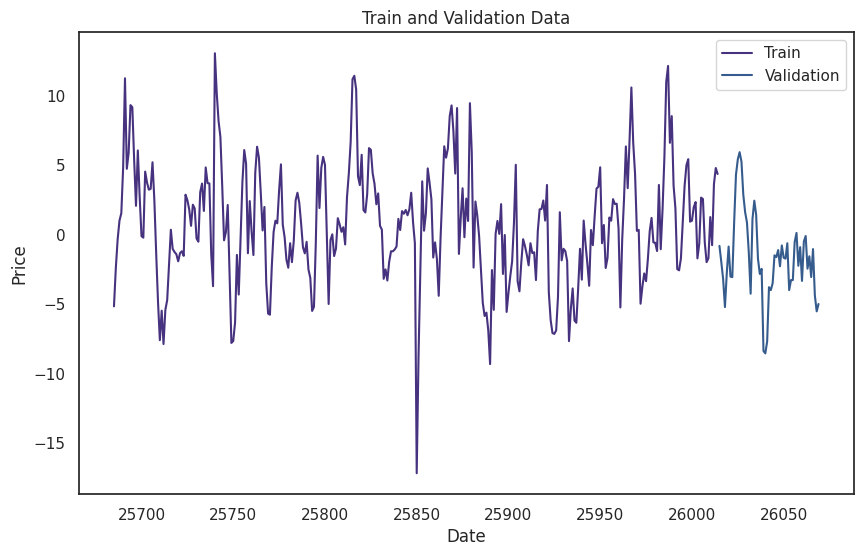

Forecasted Values: [3.94367074 2.25572203 2.68165191 0.86964992 0.58473415 0.67059304
 0.67765825 0.66976607 0.67059921 0.67106526 0.67091913 0.67090857
 0.67092174 0.67092026 0.6709195  0.67091974 0.67091976 0.67091974
 0.67091974 0.67091974 0.67091974 0.67091974 0.67091974 0.67091974
 0.67091974 0.67091974 0.67091974 0.67091974 0.67091974 0.67091974
 0.67091974 0.67091974 0.67091974 0.67091974 0.67091974 0.67091974
 0.67091974 0.67091974 0.67091974 0.67091974 0.67091974 0.67091974
 0.67091974 0.67091974 0.67091974 0.67091974 0.67091974 0.67091974
 0.67091974 0.67091974 0.67091974 0.67091974 0.67091974 0.67091974
 0.67091974]
MAE: 3.2917208292911084
RMSE: 3.9210116244447786


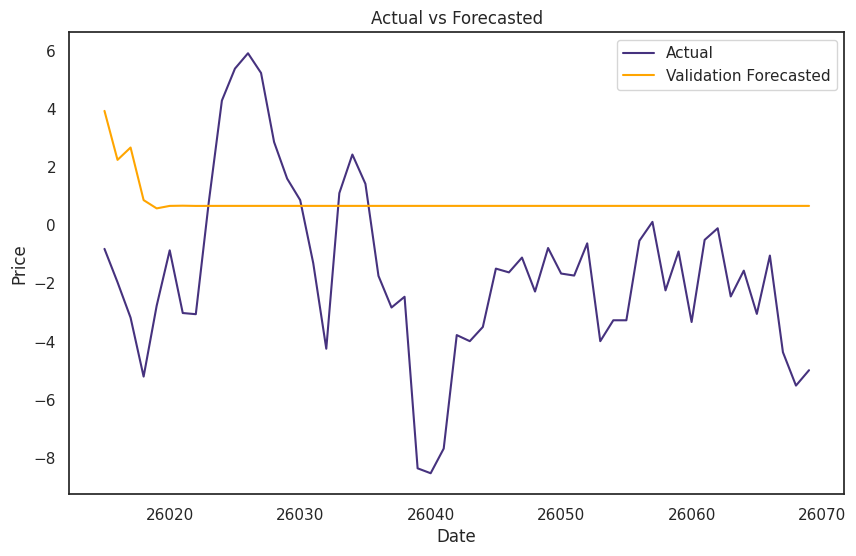

trainset: 460 -- 465
val_set: 466 -- 466


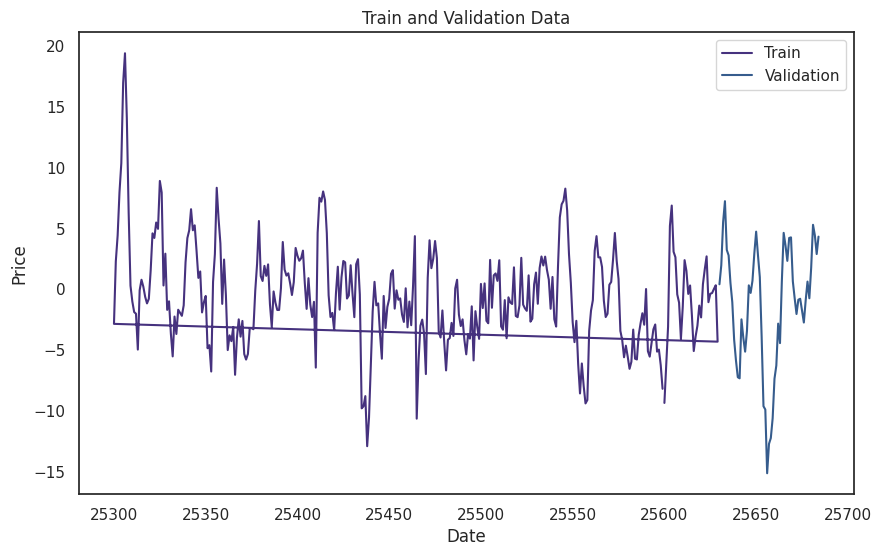

Forecasted Values: [-7.73047893 -6.90233682 -5.16048148 -3.21067896 -2.14337586 -1.3467697
 -1.56855701 -1.6757026  -1.63379128 -1.62024398 -1.62768476 -1.62924448
 -1.62798394 -1.62783326 -1.62803868 -1.62804726 -1.62801492 -1.62801591
 -1.62802083 -1.62802033 -1.6280196  -1.62801973 -1.62801984 -1.62801981
 -1.6280198  -1.6280198  -1.6280198  -1.6280198  -1.6280198  -1.6280198
 -1.6280198  -1.6280198  -1.6280198  -1.6280198  -1.6280198  -1.6280198
 -1.6280198  -1.6280198  -1.6280198  -1.6280198  -1.6280198  -1.6280198
 -1.6280198  -1.6280198  -1.6280198  -1.6280198  -1.6280198  -1.6280198
 -1.6280198  -1.6280198  -1.6280198  -1.6280198  -1.6280198  -1.6280198
 -1.6280198 ]
MAE: 4.2689987783310155
RMSE: 5.470256697674677


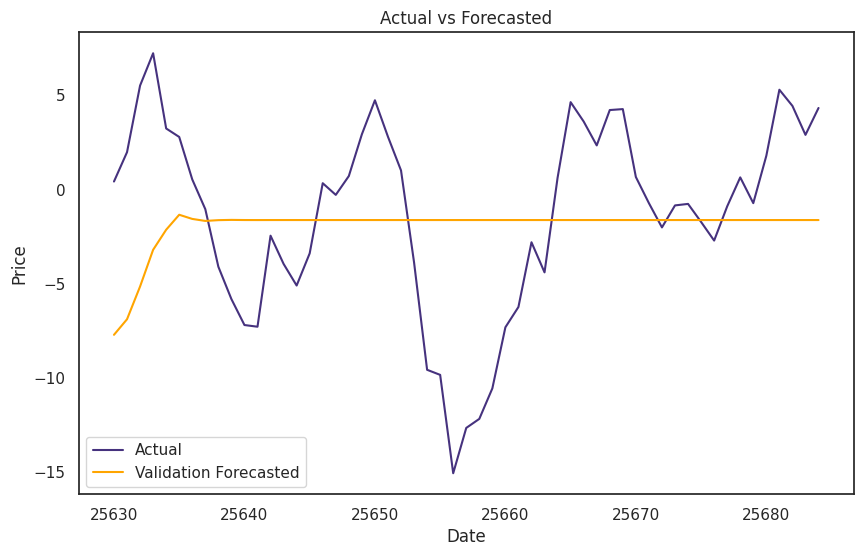

trainset: 453 -- 458
val_set: 459 -- 459


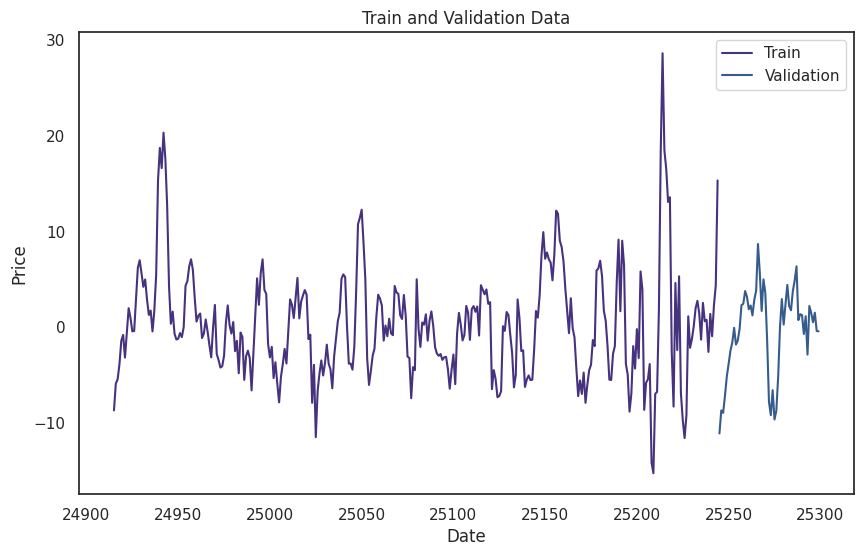

Forecasted Values: [14.4795255  10.60461872 11.14199405  8.26527606  6.80128527  0.41661411
  0.18558373  0.36793802  0.38275474  0.37790061  0.37724515  0.37736311
  0.37738794  0.37738545  0.3773846   0.37738464  0.37738466  0.37738466
  0.37738466  0.37738466  0.37738466  0.37738466  0.37738466  0.37738466
  0.37738466  0.37738466  0.37738466  0.37738466  0.37738466  0.37738466
  0.37738466  0.37738466  0.37738466  0.37738466  0.37738466  0.37738466
  0.37738466  0.37738466  0.37738466  0.37738466  0.37738466  0.37738466
  0.37738466  0.37738466  0.37738466  0.37738466  0.37738466  0.37738466
  0.37738466  0.37738466  0.37738466  0.37738466  0.37738466  0.37738466
  0.37738466]
MAE: 4.113895541527689
RMSE: 6.847308079601878


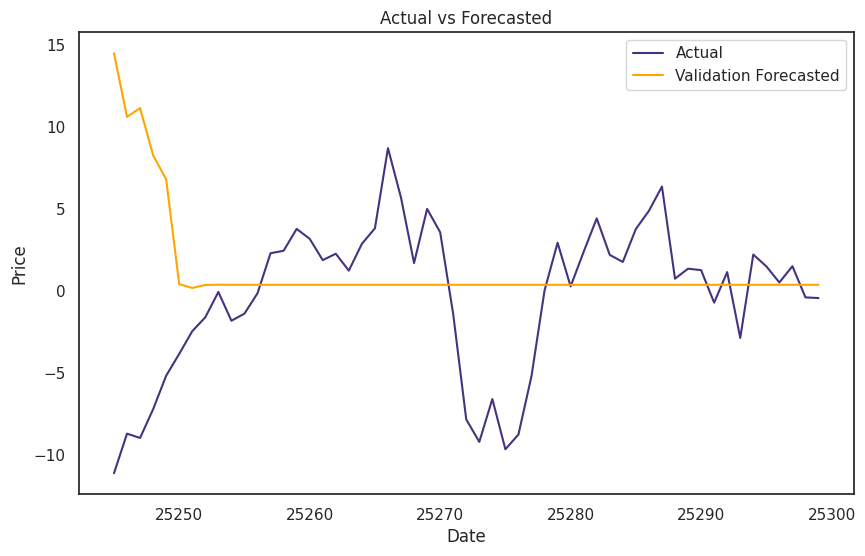

trainset: 446 -- 451
val_set: 452 -- 452


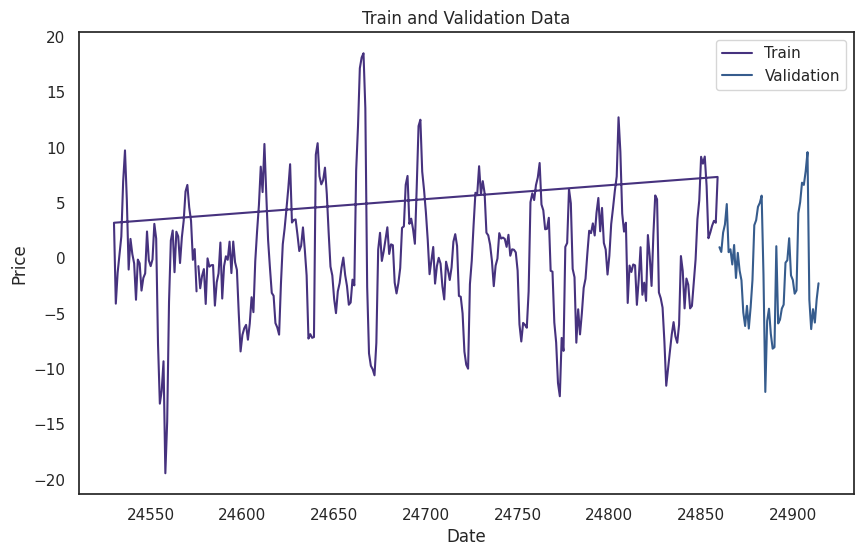

Forecasted Values: [-3.54874089 -2.51050625 -2.20789784 -1.01086195 -1.49394546  0.14832312
  0.35978187  0.1366764   0.08653135  0.1150082   0.12480934  0.12146556
  0.11973999  0.12008345  0.12036627  0.12034002  0.12029624  0.12029635
  0.12030279  0.12030332  0.12030242  0.12030227  0.12030239  0.12030242
  0.12030241  0.1203024   0.1203024   0.1203024   0.1203024   0.1203024
  0.1203024   0.1203024   0.1203024   0.1203024   0.1203024   0.1203024
  0.1203024   0.1203024   0.1203024   0.1203024   0.1203024   0.1203024
  0.1203024   0.1203024   0.1203024   0.1203024   0.1203024   0.1203024
  0.1203024   0.1203024   0.1203024   0.1203024   0.1203024   0.1203024
  0.1203024 ]
MAE: 3.9587631184152317
RMSE: 4.874377517697367


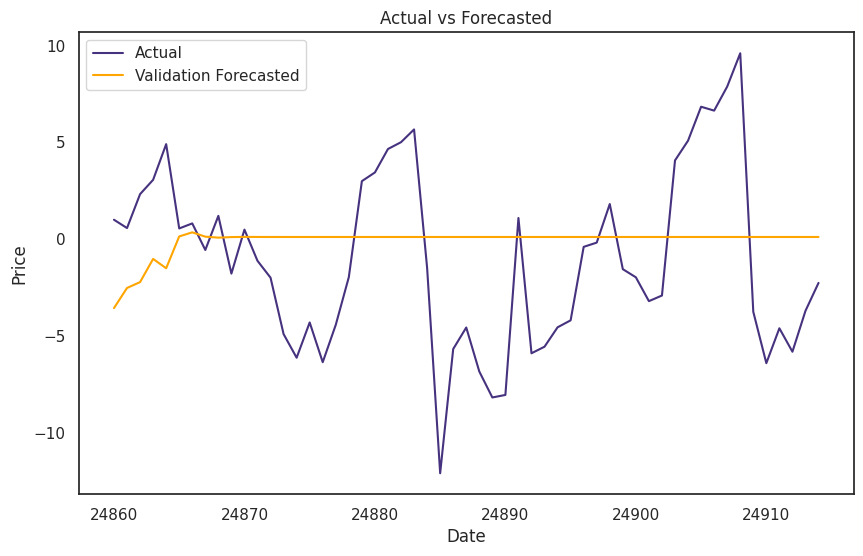

trainset: 439 -- 444
val_set: 445 -- 445


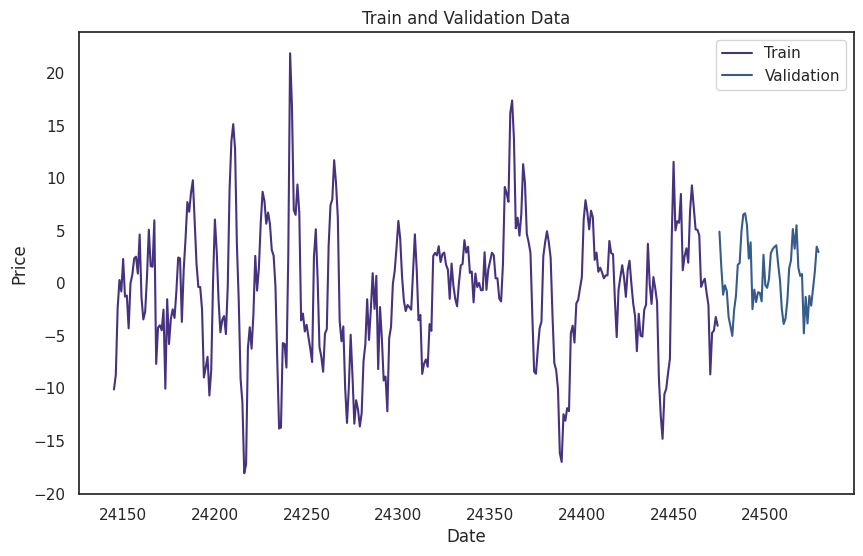

Forecasted Values: [-3.09385338  1.72152224 -0.31836913 -1.38562944 -1.35982701 -0.74549194
 -0.70396758 -0.76146687 -0.76967895 -0.76460751 -0.76343532 -0.7638505
 -0.76399567 -0.76396521 -0.76394874 -0.76395055 -0.76395231 -0.76395225
 -0.76395208 -0.76395207 -0.76395209 -0.76395209 -0.76395209 -0.76395209
 -0.76395209 -0.76395209 -0.76395209 -0.76395209 -0.76395209 -0.76395209
 -0.76395209 -0.76395209 -0.76395209 -0.76395209 -0.76395209 -0.76395209
 -0.76395209 -0.76395209 -0.76395209 -0.76395209 -0.76395209 -0.76395209
 -0.76395209 -0.76395209 -0.76395209 -0.76395209 -0.76395209 -0.76395209
 -0.76395209 -0.76395209 -0.76395209 -0.76395209 -0.76395209 -0.76395209
 -0.76395209]
MAE: 2.670455052312428
RMSE: 3.367489059121555


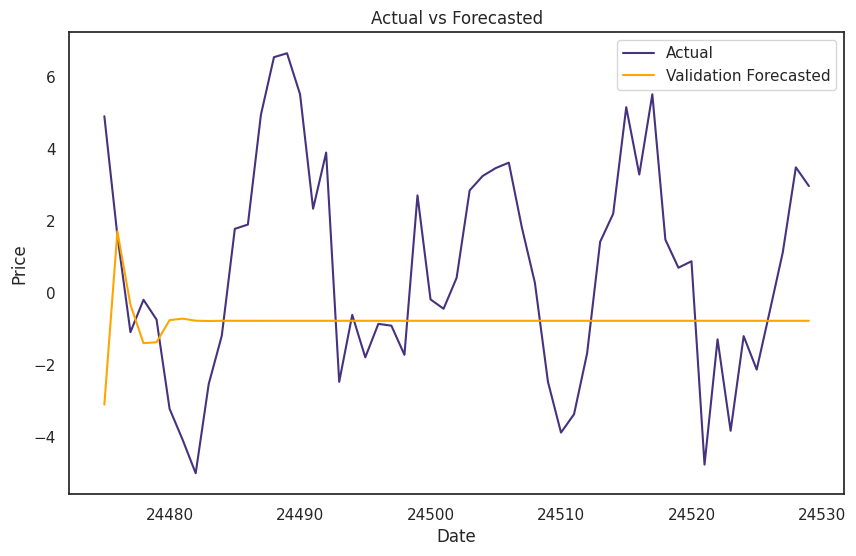

trainset: 432 -- 437
val_set: 438 -- 438


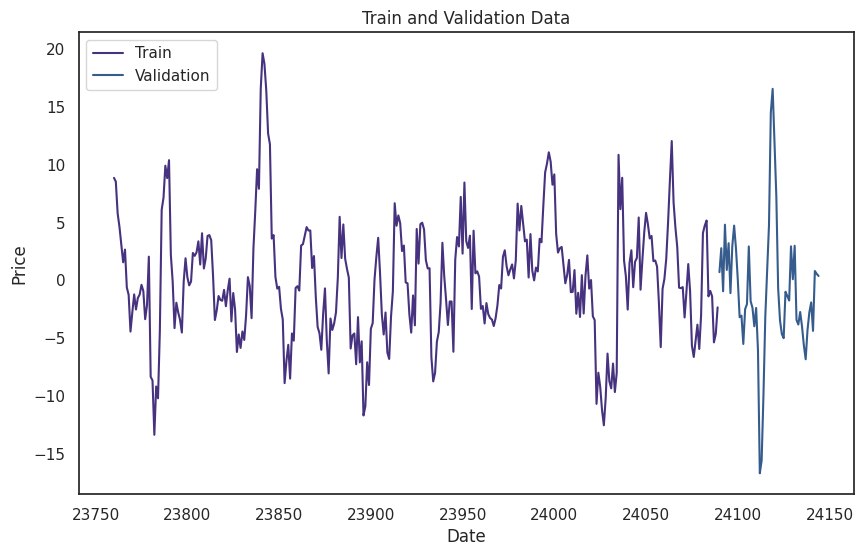

Forecasted Values: [0.08800127 0.30939689 0.47504111 1.21349083 0.9793495  0.17001868
 0.26803386 0.08849248 0.14025143 0.09504896 0.11350085 0.10115
 0.10705429 0.10352521 0.10533876 0.10430773 0.1048553  0.1045509
 0.10471499 0.10462469 0.1046737  0.10464685 0.10466147 0.10465348
 0.10465784 0.10465546 0.10465675 0.10465605 0.10465643 0.10465622
 0.10465634 0.10465627 0.10465631 0.10465629 0.1046563  0.10465629
 0.1046563  0.1046563  0.1046563  0.1046563  0.1046563  0.1046563
 0.1046563  0.1046563  0.1046563  0.1046563  0.1046563  0.1046563
 0.1046563  0.1046563  0.1046563  0.1046563  0.1046563  0.1046563
 0.1046563 ]
MAE: 4.165209748415291
RMSE: 5.72911095860062


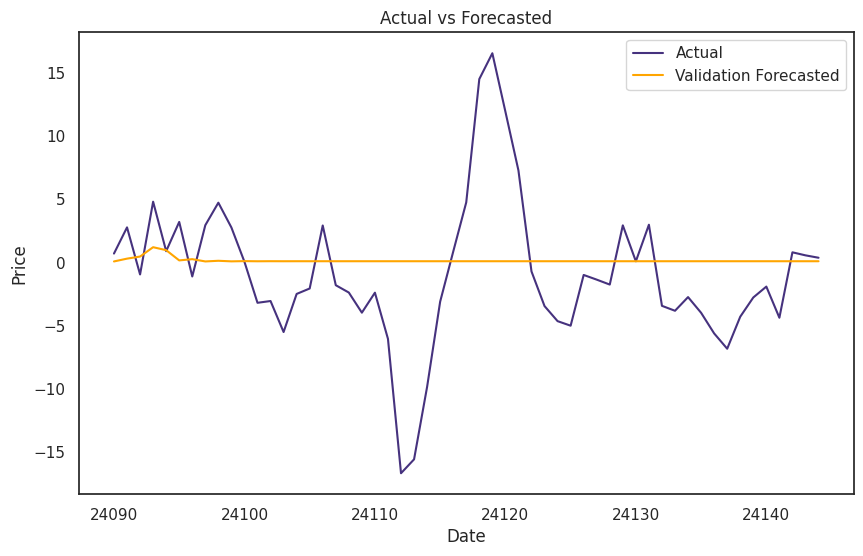

trainset: 425 -- 430
val_set: 431 -- 431


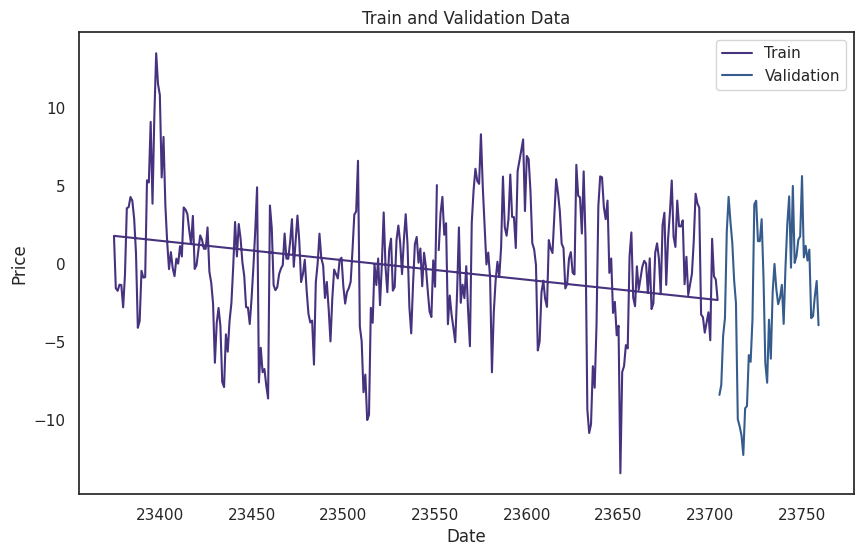

Forecasted Values: [ 4.37413453  5.93582412  5.11404316  3.72455361  2.38985184 -1.01104367
 -0.42493599  0.2960198   0.10314067 -0.04396444  0.01198201  0.04061233
  0.0255567   0.02033246  0.02417695  0.02503861  0.02409635  0.02397996
  0.02420299  0.02421072  0.02415958  0.0241621   0.02417347  0.02417195
  0.0241695   0.02417005  0.02417056  0.02417039  0.02417029  0.02417034
  0.02417036  0.02417034  0.02417034  0.02417034  0.02417034  0.02417034
  0.02417034  0.02417034  0.02417034  0.02417034  0.02417034  0.02417034
  0.02417034  0.02417034  0.02417034  0.02417034  0.02417034  0.02417034
  0.02417034  0.02417034  0.02417034  0.02417034  0.02417034  0.02417034
  0.02417034]
MAE: 3.9857690968542583
RMSE: 5.456087027873729


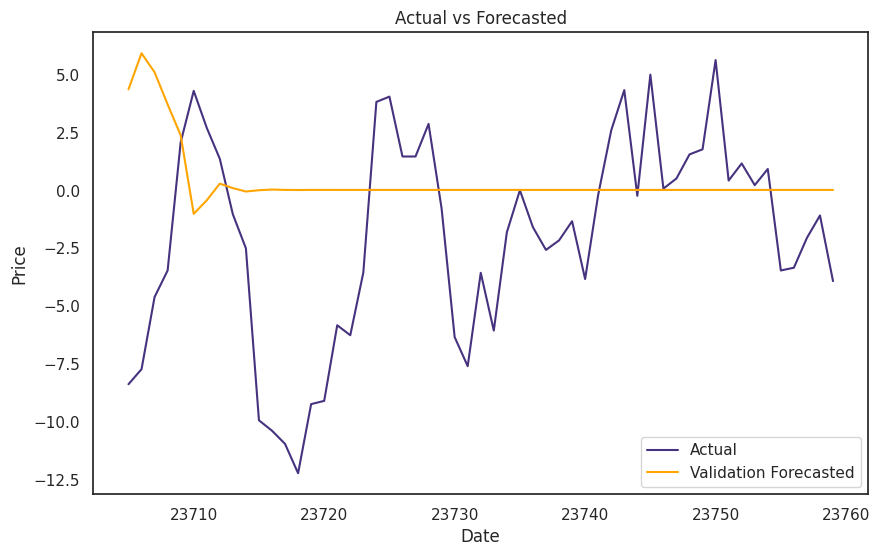

trainset: 418 -- 423
val_set: 424 -- 424


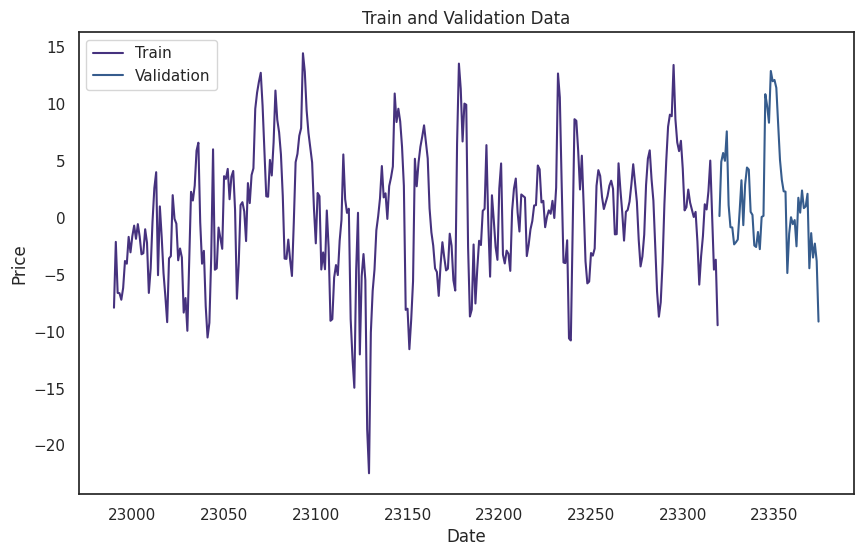

Forecasted Values: [-8.94987496 -8.02287272 -5.06589914 -2.34514406 -2.96870735 -0.20062545
  0.83265334  0.1844611  -0.36319103 -0.30179031 -0.09495046 -0.0549488
 -0.11438513 -0.14574067 -0.13453365 -0.12041698 -0.12010431 -0.12487556
 -0.126394   -0.12519909 -0.12432264 -0.12447519 -0.12482226 -0.12487232
 -0.12476754 -0.12471932 -0.12474116 -0.12476423 -0.12476353 -0.12475537
 -0.1247532  -0.12475537 -0.12475676 -0.12475642 -0.12475584 -0.12475579
 -0.12475597 -0.12475604 -0.124756   -0.12475596 -0.12475597 -0.12475598
 -0.12475598 -0.12475598 -0.12475598 -0.12475598 -0.12475598 -0.12475598
 -0.12475598 -0.12475598 -0.12475598 -0.12475598 -0.12475598 -0.12475598
 -0.12475598]
MAE: 4.015330869326763
RMSE: 5.7589053785437585


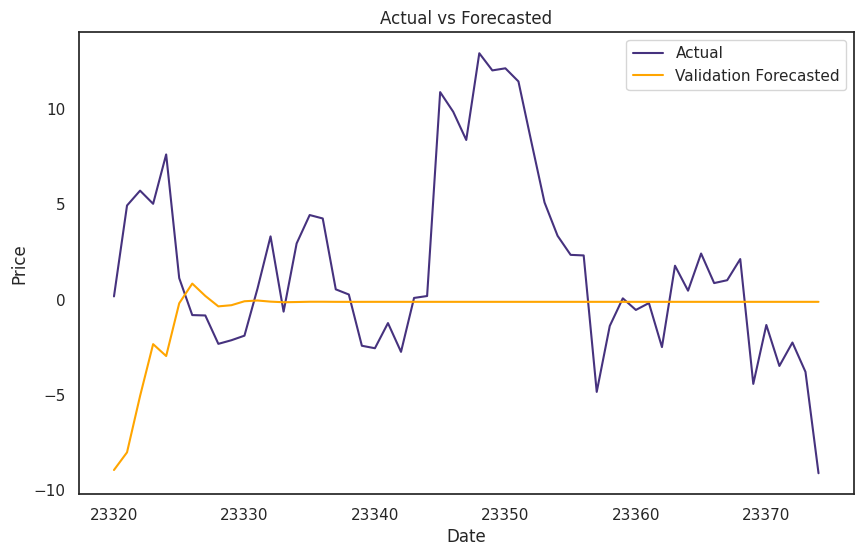

trainset: 411 -- 416
val_set: 417 -- 417


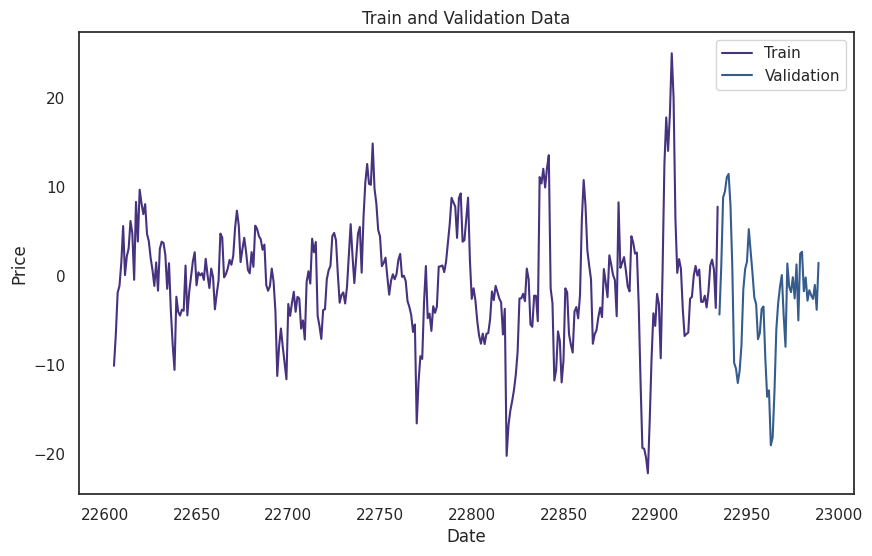

Forecasted Values: [ 6.73932424  4.75378491  3.87282098  4.50191245  5.65581801 -0.10282869
 -0.59450067 -0.57299113 -0.56587193 -0.5655127  -0.56555998 -0.56556781
 -0.56556795 -0.56556787 -0.56556787 -0.56556787 -0.56556787 -0.56556787
 -0.56556787 -0.56556787 -0.56556787 -0.56556787 -0.56556787 -0.56556787
 -0.56556787 -0.56556787 -0.56556787 -0.56556787 -0.56556787 -0.56556787
 -0.56556787 -0.56556787 -0.56556787 -0.56556787 -0.56556787 -0.56556787
 -0.56556787 -0.56556787 -0.56556787 -0.56556787 -0.56556787 -0.56556787
 -0.56556787 -0.56556787 -0.56556787 -0.56556787 -0.56556787 -0.56556787
 -0.56556787 -0.56556787 -0.56556787 -0.56556787 -0.56556787 -0.56556787
 -0.56556787]
MAE: 5.402432407404158
RMSE: 6.6412105260788366


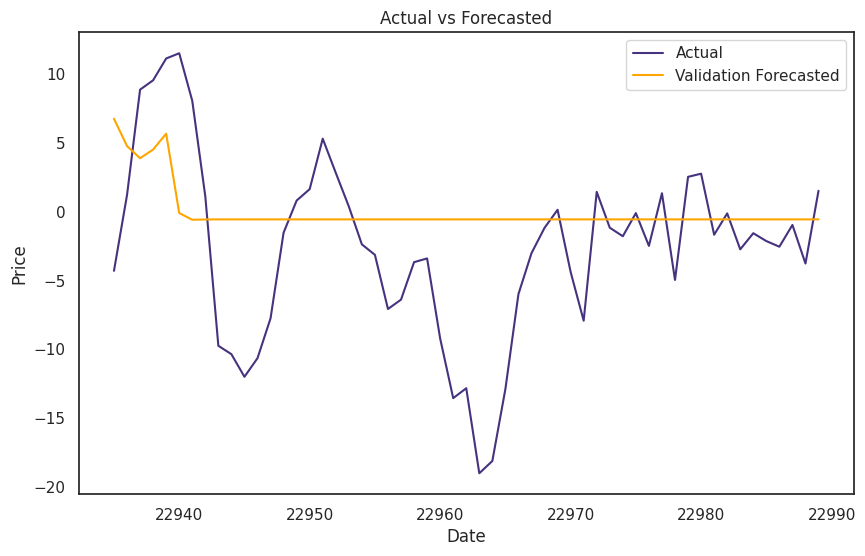

trainset: 404 -- 409
val_set: 410 -- 410


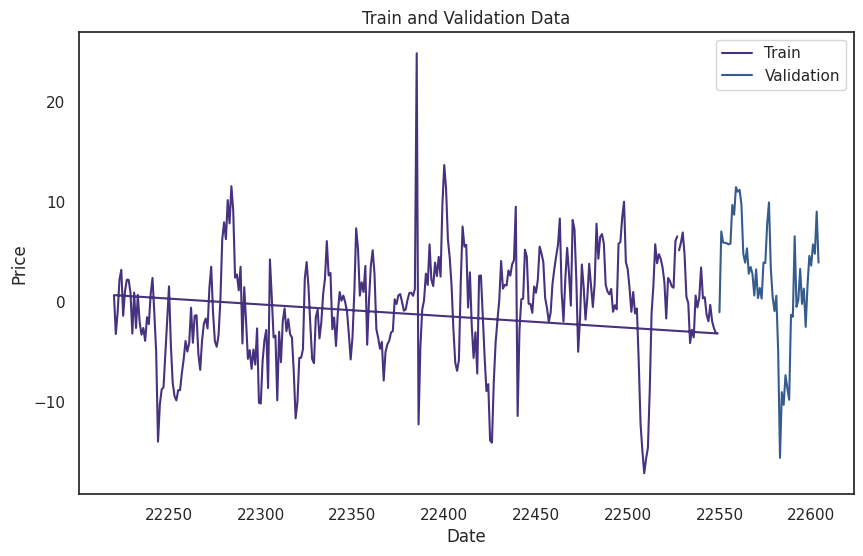

Forecasted Values: [4.35167658 3.35192825 2.81619866 2.16164564 0.55328712 0.01395423
 0.29321633 0.41079171 0.36354751 0.33862506 0.34635592 0.35151997
 0.35031139 0.34926183 0.34943817 0.34964788 0.3496251  0.34958384
 0.34958605 0.34959405 0.34959404 0.34959251 0.34959243 0.34959272
 0.34959275 0.3495927  0.34959269 0.3495927  0.3495927  0.3495927
 0.3495927  0.3495927  0.3495927  0.3495927  0.3495927  0.3495927
 0.3495927  0.3495927  0.3495927  0.3495927  0.3495927  0.3495927
 0.3495927  0.3495927  0.3495927  0.3495927  0.3495927  0.3495927
 0.3495927  0.3495927  0.3495927  0.3495927  0.3495927  0.3495927
 0.3495927 ]
MAE: 4.800970002787035
RMSE: 6.004591144201641


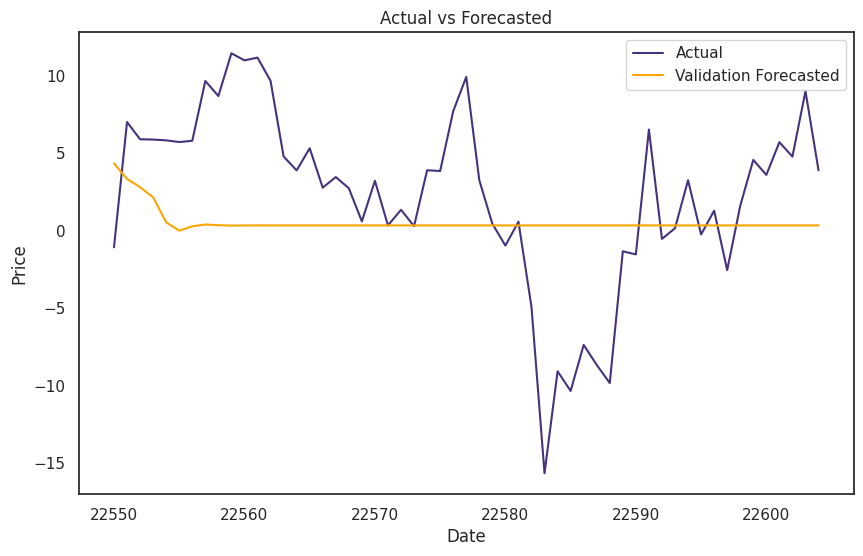

trainset: 397 -- 402
val_set: 403 -- 403


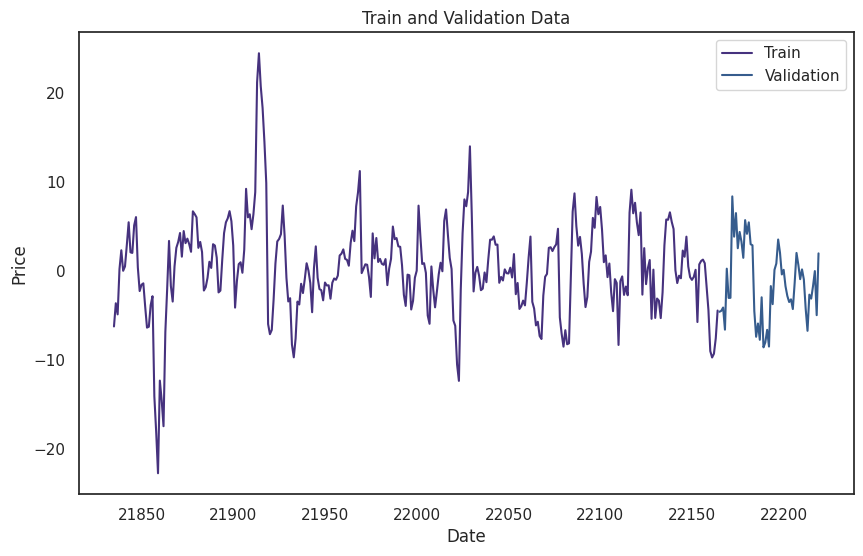

Forecasted Values: [-0.30631234  1.28844646  1.99310091  1.97152954  1.00855657  0.15690018
  0.20761639  0.29611889  0.29581776  0.28689056  0.28643617  0.28731034
  0.28740355  0.28732059  0.28730671  0.2873143   0.28731611  0.28731545
  0.28731523  0.28731528  0.28731531  0.28731531  0.2873153   0.2873153
  0.2873153   0.2873153   0.2873153   0.2873153   0.2873153   0.2873153
  0.2873153   0.2873153   0.2873153   0.2873153   0.2873153   0.2873153
  0.2873153   0.2873153   0.2873153   0.2873153   0.2873153   0.2873153
  0.2873153   0.2873153   0.2873153   0.2873153   0.2873153   0.2873153
  0.2873153   0.2873153   0.2873153   0.2873153   0.2873153   0.2873153
  0.2873153 ]
MAE: 3.6935792445081748
RMSE: 4.496856739481793


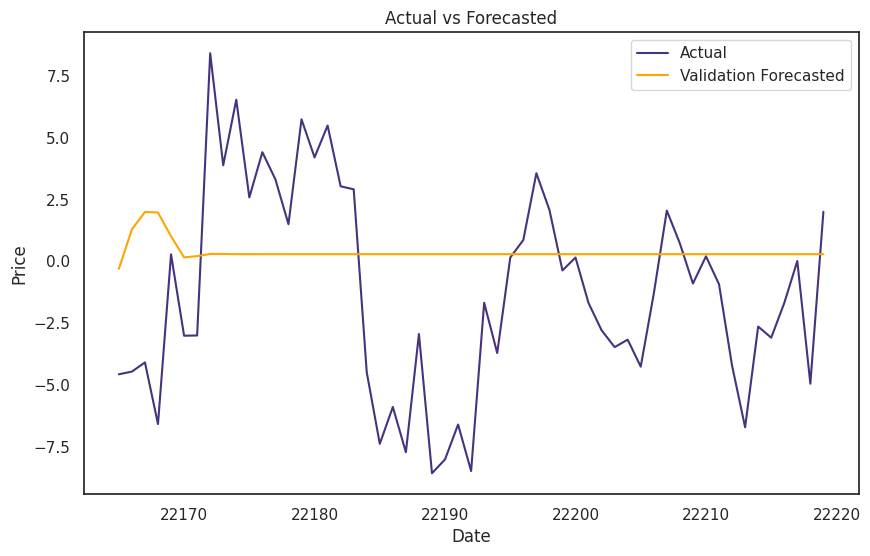

trainset: 390 -- 395
val_set: 396 -- 396


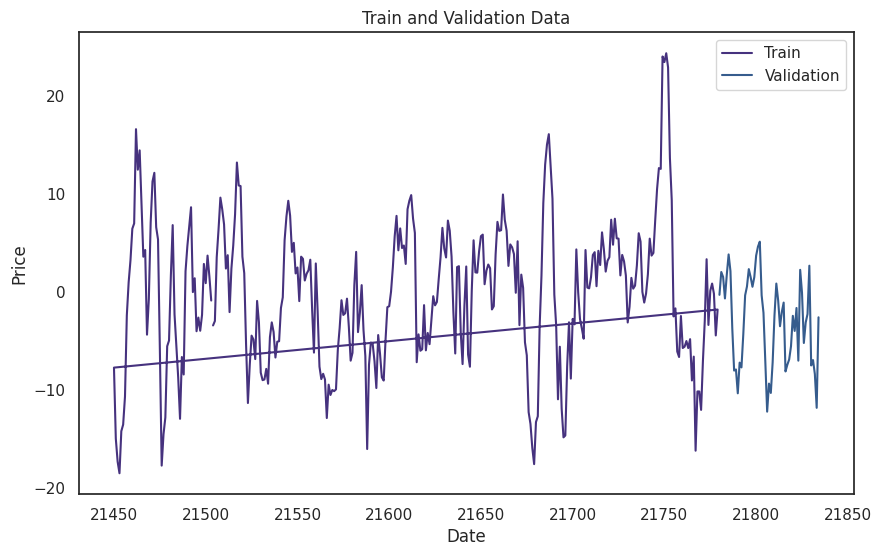

Forecasted Values: [-1.4771416  -3.2825779  -2.8006034  -4.14785365 -2.77741922 -0.62625182
 -0.64444555 -0.40170398 -0.4231433  -0.39420266 -0.3989202  -0.39529705
 -0.39611574 -0.39564392 -0.39577345 -0.39571018 -0.39572976 -0.3957211
 -0.39572399 -0.39572279 -0.39572321 -0.39572304 -0.3957231  -0.39572308
 -0.39572309 -0.39572308 -0.39572308 -0.39572308 -0.39572308 -0.39572308
 -0.39572308 -0.39572308 -0.39572308 -0.39572308 -0.39572308 -0.39572308
 -0.39572308 -0.39572308 -0.39572308 -0.39572308 -0.39572308 -0.39572308
 -0.39572308 -0.39572308 -0.39572308 -0.39572308 -0.39572308 -0.39572308
 -0.39572308 -0.39572308 -0.39572308 -0.39572308 -0.39572308 -0.39572308
 -0.39572308]
MAE: 4.133799660674632
RMSE: 5.304256803810997


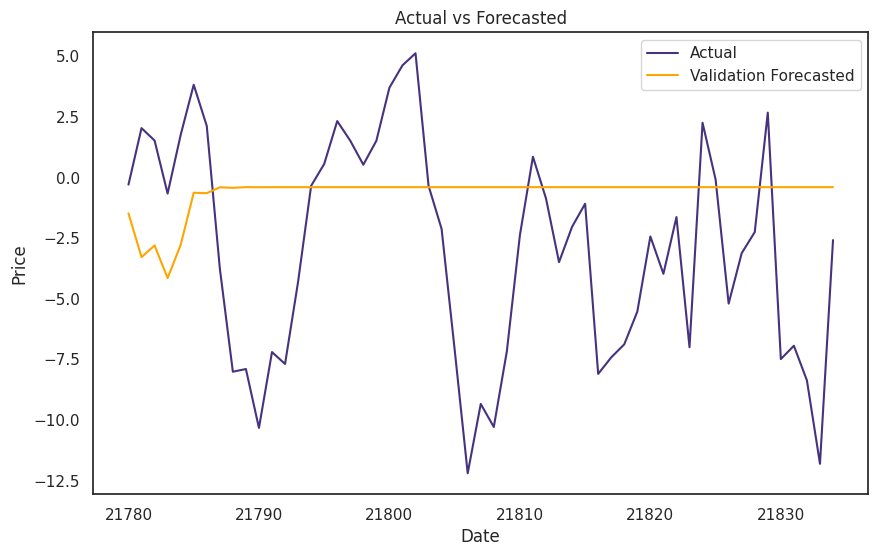

trainset: 383 -- 388
val_set: 389 -- 389


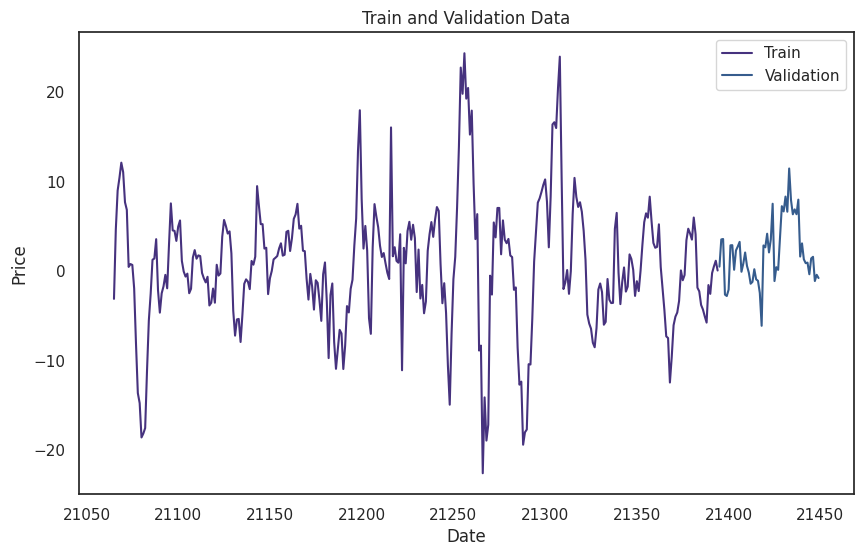

Forecasted Values: [ 0.04435687  0.80627859 -0.07344135 -0.49595906 -1.24984318  0.37465585
  0.33791675  0.43096705  0.42923229  0.43456363  0.43448548  0.43479102
  0.43478776  0.43480528  0.43480516  0.43480617  0.43480617  0.43480622
  0.43480622  0.43480623  0.43480623  0.43480623  0.43480623  0.43480623
  0.43480623  0.43480623  0.43480623  0.43480623  0.43480623  0.43480623
  0.43480623  0.43480623  0.43480623  0.43480623  0.43480623  0.43480623
  0.43480623  0.43480623  0.43480623  0.43480623  0.43480623  0.43480623
  0.43480623  0.43480623  0.43480623  0.43480623  0.43480623  0.43480623
  0.43480623  0.43480623  0.43480623  0.43480623  0.43480623  0.43480623
  0.43480623]
MAE: 2.861830023256942
RMSE: 3.766096015850434


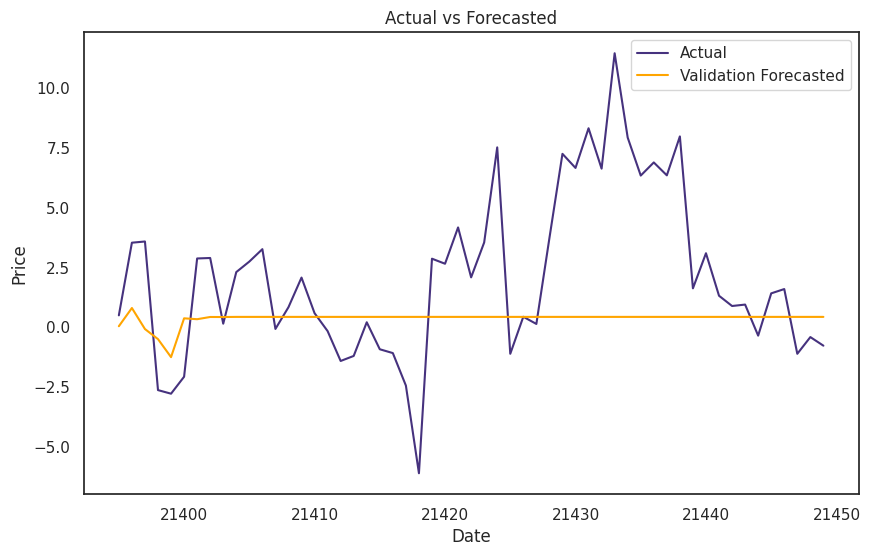

trainset: 376 -- 381
val_set: 382 -- 382


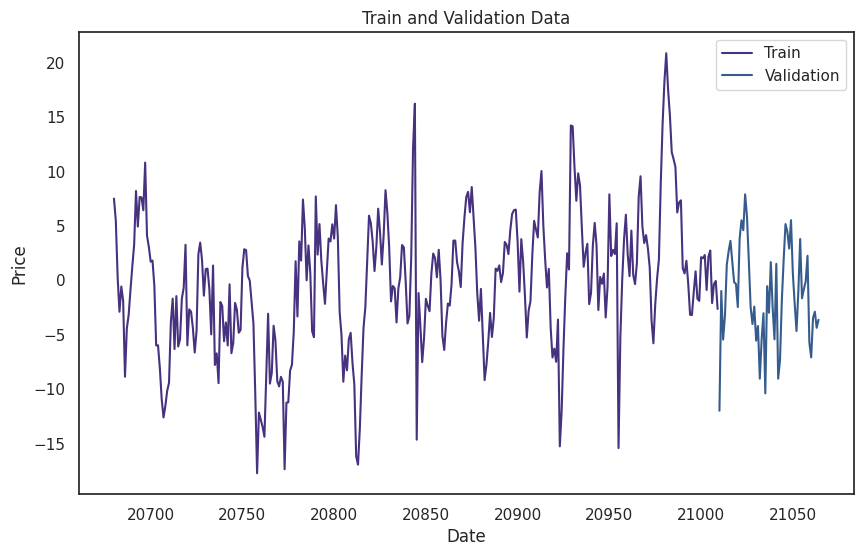

Forecasted Values: [-2.11704985 -1.06292833  0.27551519  0.18269727  0.85354819  1.92308944
  1.8349429   1.97690623  1.94398766  1.96617336  1.95873651  1.96256476
  1.96107114  1.96176486  1.96147672  1.96160518  1.96155044  1.96157445
  1.96156411  1.96156861  1.96156667  1.96156751  1.96156715  1.96156731
  1.96156724  1.96156727  1.96156725  1.96156726  1.96156726  1.96156726
  1.96156726  1.96156726  1.96156726  1.96156726  1.96156726  1.96156726
  1.96156726  1.96156726  1.96156726  1.96156726  1.96156726  1.96156726
  1.96156726  1.96156726  1.96156726  1.96156726  1.96156726  1.96156726
  1.96156726  1.96156726  1.96156726  1.96156726  1.96156726  1.96156726
  1.96156726]
MAE: 4.346324094538711
RMSE: 5.201767021058449


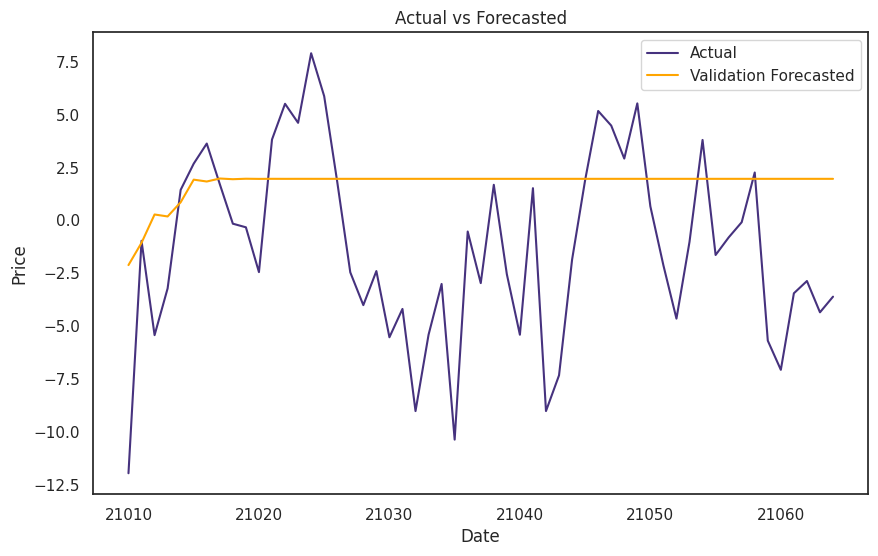

trainset: 369 -- 374
val_set: 375 -- 375


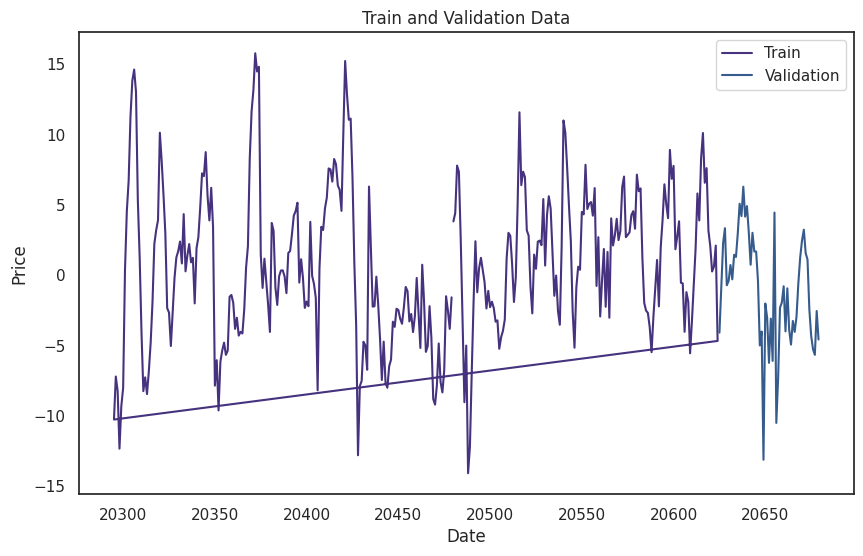

Forecasted Values: [ 0.41199575  0.83237475 -0.78404313  0.31225124  0.55997587  0.27526769
  0.27714222  0.2686666   0.26855796  0.26830245  0.26829424  0.26828644
  0.26828604  0.2682858   0.26828578  0.26828578  0.26828578  0.26828578
  0.26828578  0.26828578  0.26828578  0.26828578  0.26828578  0.26828578
  0.26828578  0.26828578  0.26828578  0.26828578  0.26828578  0.26828578
  0.26828578  0.26828578  0.26828578  0.26828578  0.26828578  0.26828578
  0.26828578  0.26828578  0.26828578  0.26828578  0.26828578  0.26828578
  0.26828578  0.26828578  0.26828578  0.26828578  0.26828578  0.26828578
  0.26828578  0.26828578  0.26828578  0.26828578  0.26828578  0.26828578
  0.26828578]
MAE: 3.3728630520692366
RMSE: 4.203653481026625


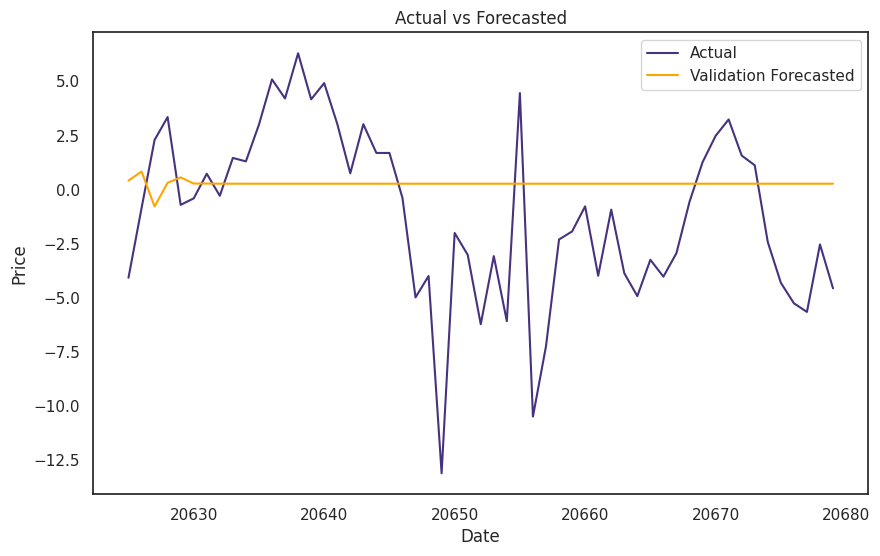

trainset: 362 -- 367
val_set: 368 -- 368


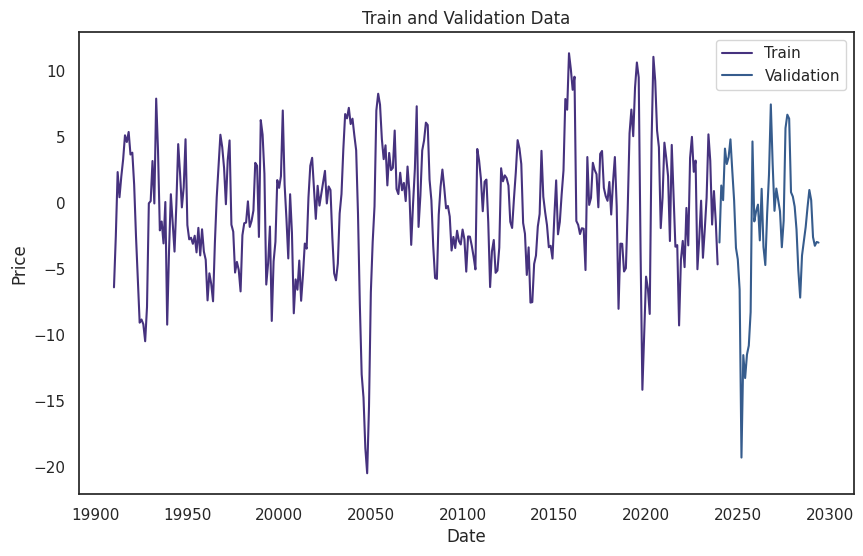

Forecasted Values: [-5.05909765 -3.62284222 -2.08504016 -2.56530335 -1.60544431 -0.32658534
 -0.46324842 -0.63476926 -0.61537201 -0.59237372 -0.59511914 -0.59820203
 -0.59781444 -0.59740129 -0.59745589 -0.59751124 -0.59750356 -0.59749615
 -0.59749723 -0.59749822 -0.59749807 -0.59749794 -0.59749796 -0.59749798
 -0.59749797 -0.59749797 -0.59749797 -0.59749797 -0.59749797 -0.59749797
 -0.59749797 -0.59749797 -0.59749797 -0.59749797 -0.59749797 -0.59749797
 -0.59749797 -0.59749797 -0.59749797 -0.59749797 -0.59749797 -0.59749797
 -0.59749797 -0.59749797 -0.59749797 -0.59749797 -0.59749797 -0.59749797
 -0.59749797 -0.59749797 -0.59749797 -0.59749797 -0.59749797 -0.59749797
 -0.59749797]
MAE: 3.7413164867480897
RMSE: 5.282309146824865


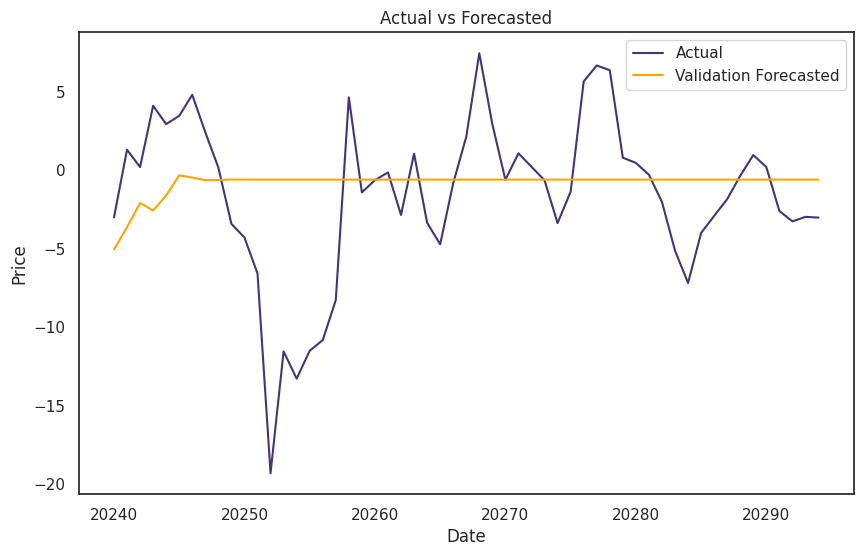

trainset: 355 -- 360
val_set: 361 -- 361


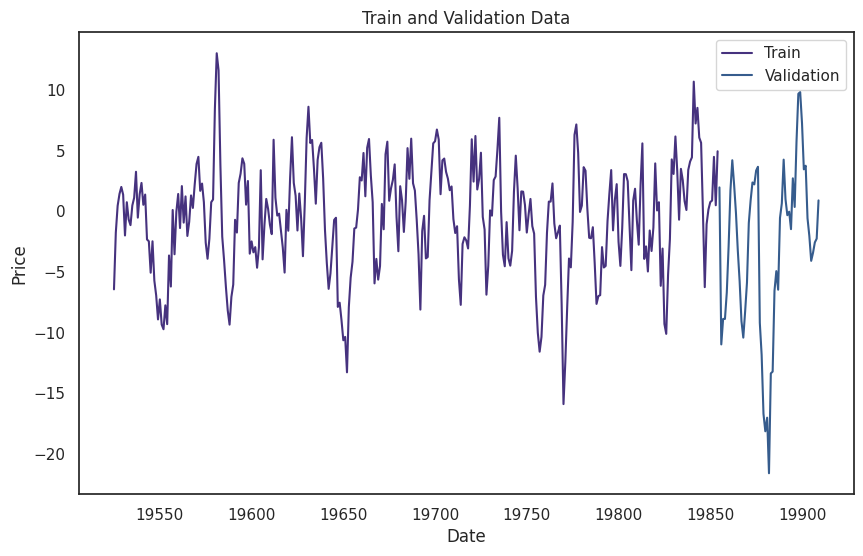

Forecasted Values: [ 3.38582813  2.52926767  1.7488968   0.20347523  2.70332519 -1.00235526
 -0.75151146 -0.50714584 -0.55440719 -0.56691056 -0.56194823 -0.56160752
 -0.56201429 -0.56199165 -0.56196425 -0.56196915 -0.5619706  -0.56197007
 -0.56197002 -0.56197007 -0.56197006 -0.56197006 -0.56197006 -0.56197006
 -0.56197006 -0.56197006 -0.56197006 -0.56197006 -0.56197006 -0.56197006
 -0.56197006 -0.56197006 -0.56197006 -0.56197006 -0.56197006 -0.56197006
 -0.56197006 -0.56197006 -0.56197006 -0.56197006 -0.56197006 -0.56197006
 -0.56197006 -0.56197006 -0.56197006 -0.56197006 -0.56197006 -0.56197006
 -0.56197006 -0.56197006 -0.56197006 -0.56197006 -0.56197006 -0.56197006
 -0.56197006]
MAE: 5.64201638944236
RMSE: 7.588447286698271


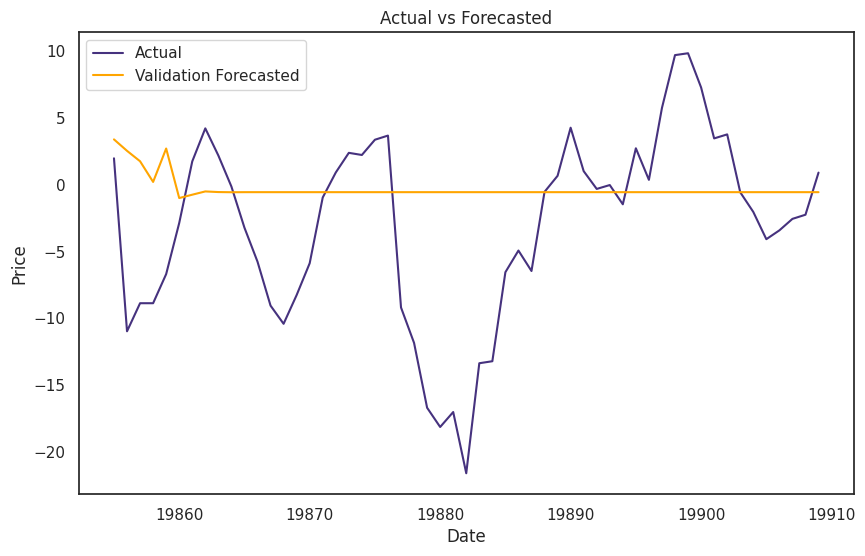

trainset: 348 -- 353
val_set: 354 -- 354


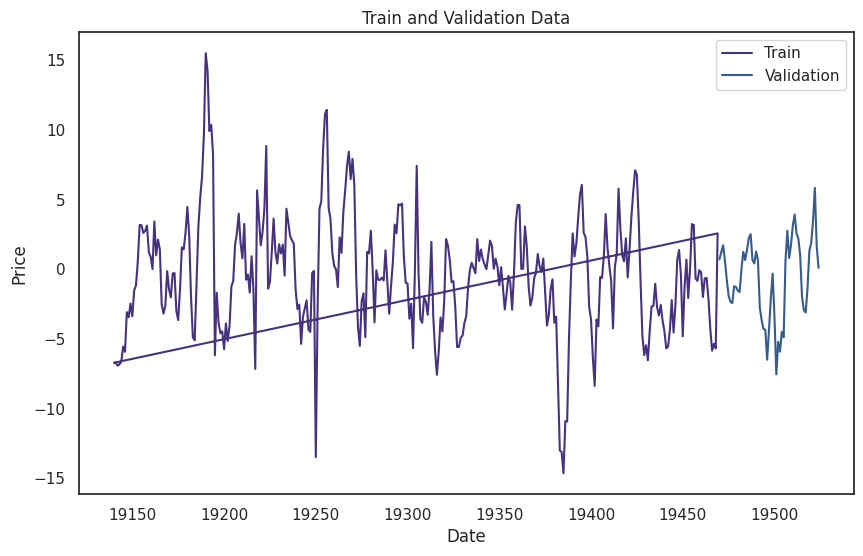

Forecasted Values: [ 3.93362519  2.47729403  1.1704918   1.36992534  0.37671348 -0.68783143
 -0.52065785 -0.3066483  -0.33385899 -0.37671184 -0.37249628 -0.36394834
 -0.3645506  -0.36624932 -0.36617599 -0.36583964 -0.36584512 -0.36591148
 -0.36591216 -0.36589912 -0.36589864 -0.36590119 -0.36590136 -0.36590086
 -0.36590081 -0.36590091 -0.36590092 -0.3659009  -0.3659009  -0.3659009
 -0.3659009  -0.3659009  -0.3659009  -0.3659009  -0.3659009  -0.3659009
 -0.3659009  -0.3659009  -0.3659009  -0.3659009  -0.3659009  -0.3659009
 -0.3659009  -0.3659009  -0.3659009  -0.3659009  -0.3659009  -0.3659009
 -0.3659009  -0.3659009  -0.3659009  -0.3659009  -0.3659009  -0.3659009
 -0.3659009 ]
MAE: 2.4630991593417093
RMSE: 2.891434115029091


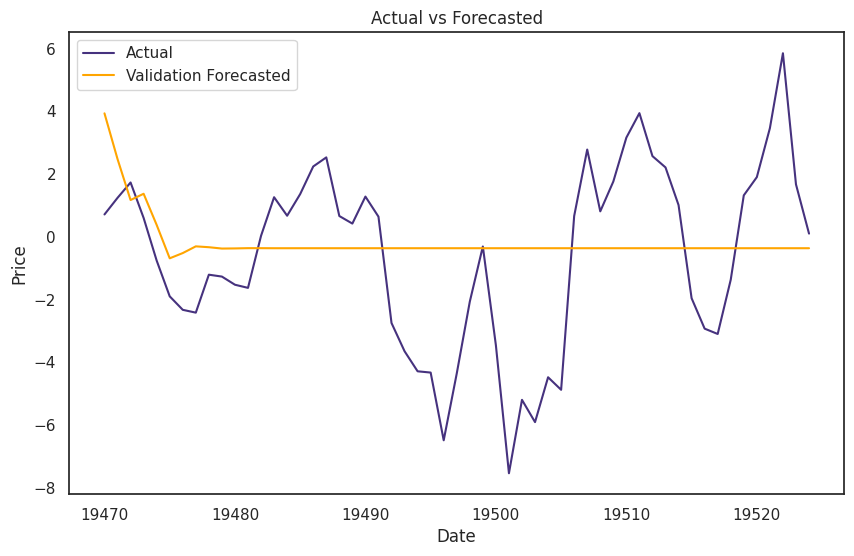

trainset: 341 -- 346
val_set: 347 -- 347


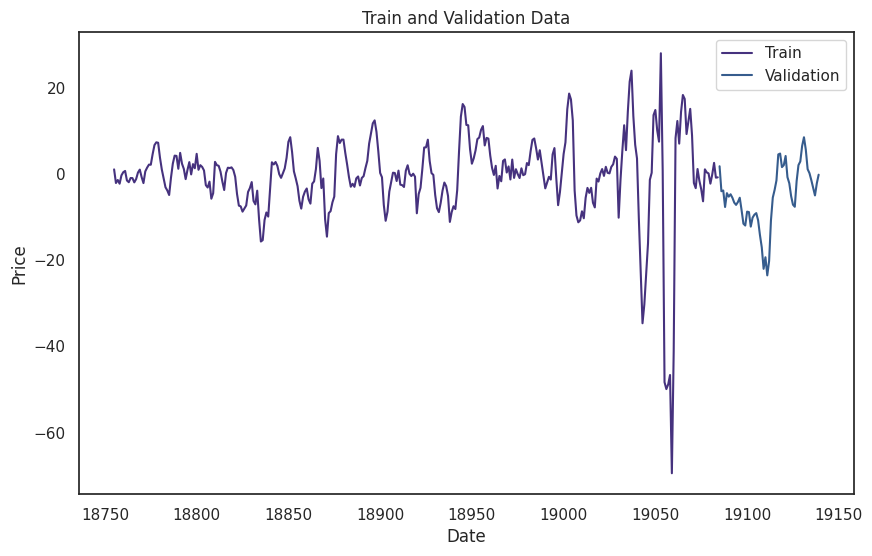

Forecasted Values: [-2.88984476e+00 -2.67407289e+00 -3.31354351e+00 -2.65991700e+00
  1.79162041e-03  2.61945286e-01 -3.76976465e-01 -6.52025969e-01
 -5.66693696e-01 -4.64759642e-01 -4.55291561e-01 -4.79918382e-01
 -4.90368217e-01 -4.87030572e-01 -4.83127226e-01 -4.82783666e-01
 -4.83732778e-01 -4.84129722e-01 -4.83999238e-01 -4.83849781e-01
 -4.83837356e-01 -4.83873931e-01 -4.83889006e-01 -4.83883907e-01
 -4.83878185e-01 -4.83877737e-01 -4.83879147e-01 -4.83879719e-01
 -4.83879520e-01 -4.83879301e-01 -4.83879285e-01 -4.83879339e-01
 -4.83879361e-01 -4.83879353e-01 -4.83879345e-01 -4.83879344e-01
 -4.83879346e-01 -4.83879347e-01 -4.83879347e-01 -4.83879346e-01
 -4.83879346e-01 -4.83879346e-01 -4.83879346e-01 -4.83879346e-01
 -4.83879346e-01 -4.83879346e-01 -4.83879346e-01 -4.83879346e-01
 -4.83879346e-01 -4.83879346e-01 -4.83879346e-01 -4.83879346e-01
 -4.83879346e-01 -4.83879346e-01 -4.83879346e-01]
MAE: 6.649805371772228
RMSE: 8.522162228549739


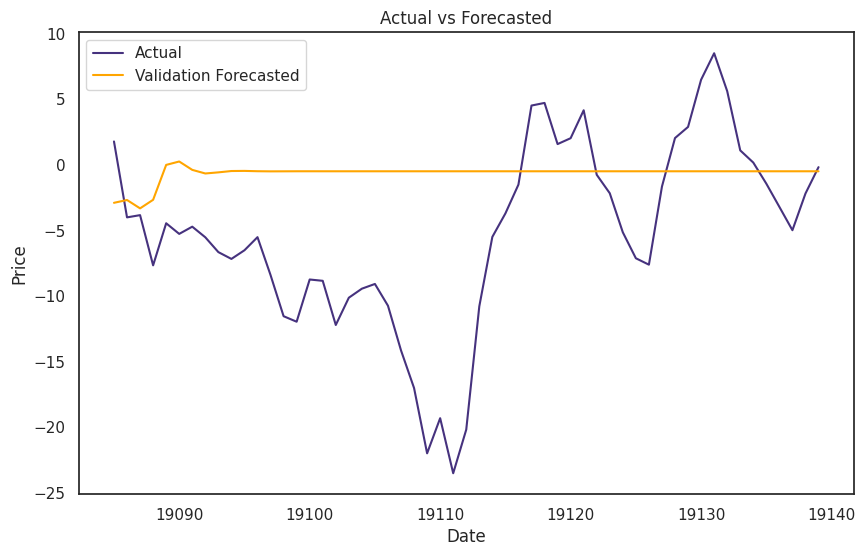

trainset: 334 -- 339
val_set: 340 -- 340


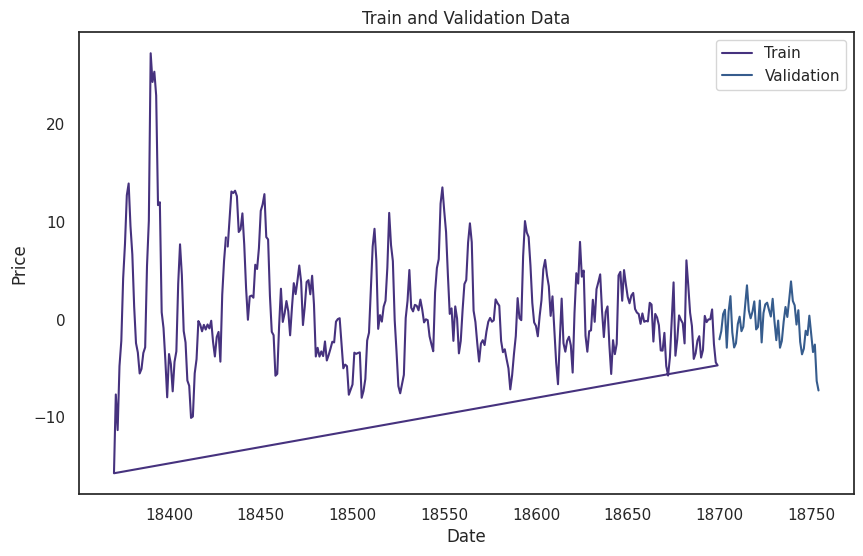

Forecasted Values: [7.94767793 7.07034588 7.76830062 4.02496546 2.65382001 1.37278797
 1.1403984  1.01535094 0.98475341 0.97179156 0.9680973  0.96670384
 0.96627418 0.96612127 0.96607217 0.96605521 0.96604965 0.96604775
 0.96604713 0.96604691 0.96604684 0.96604682 0.96604681 0.96604681
 0.96604681 0.96604681 0.96604681 0.96604681 0.96604681 0.96604681
 0.96604681 0.96604681 0.96604681 0.96604681 0.96604681 0.96604681
 0.96604681 0.96604681 0.96604681 0.96604681 0.96604681 0.96604681
 0.96604681 0.96604681 0.96604681 0.96604681 0.96604681 0.96604681
 0.96604681 0.96604681 0.96604681 0.96604681 0.96604681 0.96604681
 0.96604681]
MAE: 2.357654219476226
RMSE: 3.307140580739865


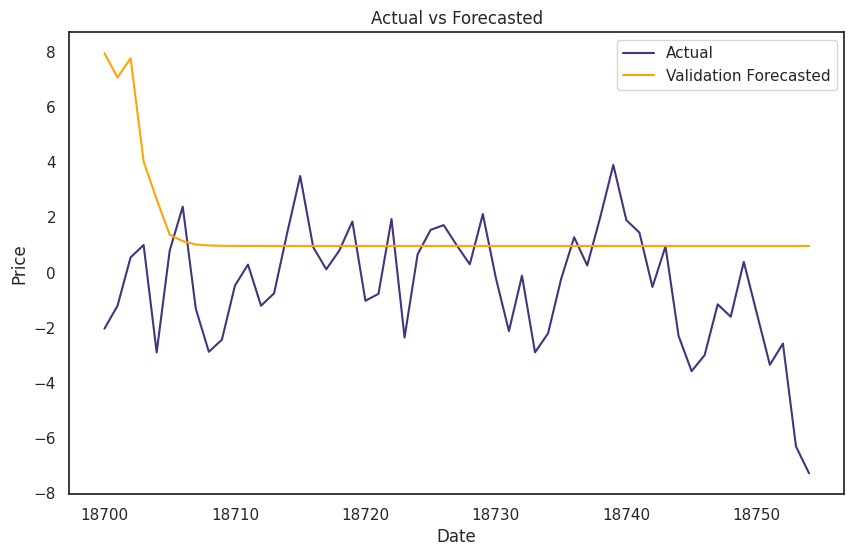

trainset: 327 -- 332
val_set: 333 -- 333


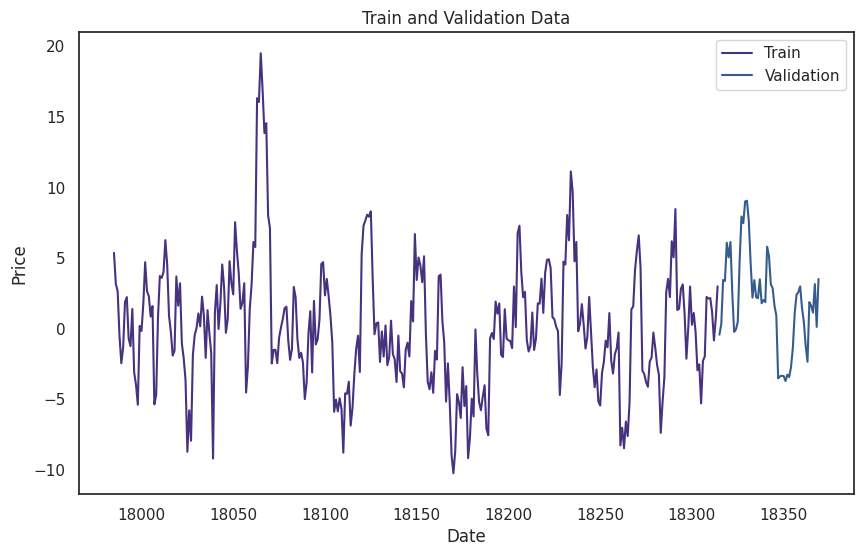

Forecasted Values: [ 3.91276233  3.45907943  3.97400715  4.1482342   1.93092783 -0.26039711
  0.18711178  0.16504887  0.15723597  0.1592027   0.15905808  0.15903221
  0.1590406   0.15903979  0.15903971  0.15903975  0.15903974  0.15903974
  0.15903974  0.15903974  0.15903974  0.15903974  0.15903974  0.15903974
  0.15903974  0.15903974  0.15903974  0.15903974  0.15903974  0.15903974
  0.15903974  0.15903974  0.15903974  0.15903974  0.15903974  0.15903974
  0.15903974  0.15903974  0.15903974  0.15903974  0.15903974  0.15903974
  0.15903974  0.15903974  0.15903974  0.15903974  0.15903974  0.15903974
  0.15903974  0.15903974  0.15903974  0.15903974  0.15903974  0.15903974
  0.15903974]
MAE: 3.0402832713249475
RMSE: 3.719791104938155


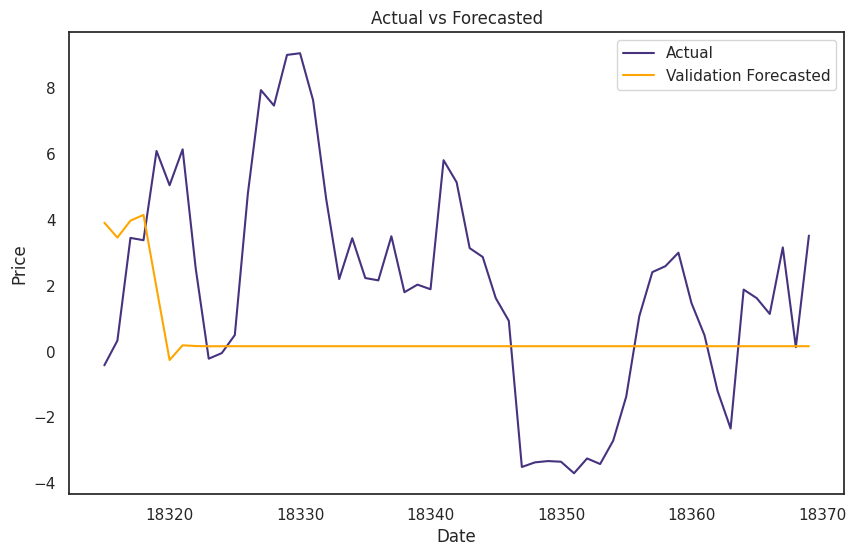

trainset: 320 -- 325
val_set: 326 -- 326


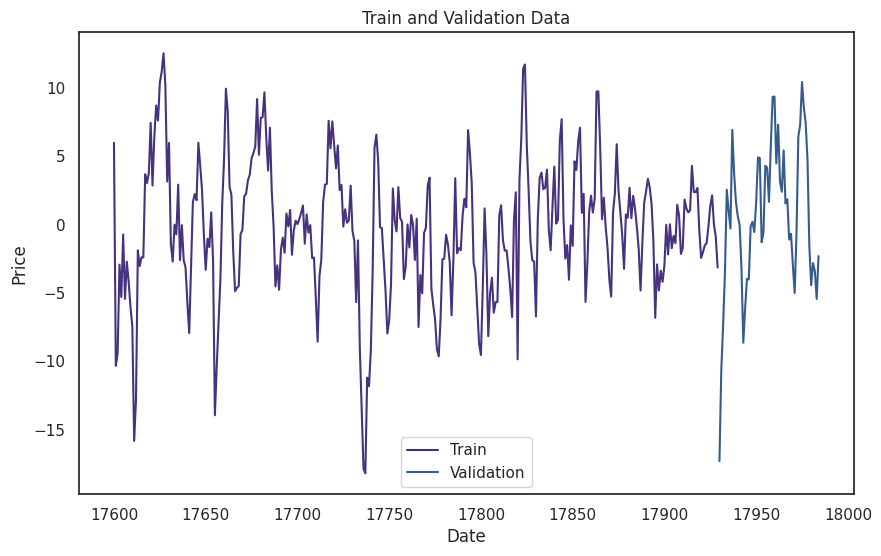

Forecasted Values: [-3.53600043 -3.154146   -2.75995941 -2.11931185 -1.14087841 -0.09500687
 -0.26916867 -0.35346259 -0.33049335 -0.32440376 -0.32703668 -0.32739984
 -0.32712444 -0.32711211 -0.3271389  -0.32713794 -0.32713551 -0.32713579
 -0.327136   -0.32713595 -0.32713594 -0.32713594 -0.32713594 -0.32713594
 -0.32713594 -0.32713594 -0.32713594 -0.32713594 -0.32713594 -0.32713594
 -0.32713594 -0.32713594 -0.32713594 -0.32713594 -0.32713594 -0.32713594
 -0.32713594 -0.32713594 -0.32713594 -0.32713594 -0.32713594 -0.32713594
 -0.32713594 -0.32713594 -0.32713594 -0.32713594 -0.32713594 -0.32713594
 -0.32713594 -0.32713594 -0.32713594 -0.32713594 -0.32713594 -0.32713594
 -0.32713594]
MAE: 4.320841443932024
RMSE: 5.126558515263182


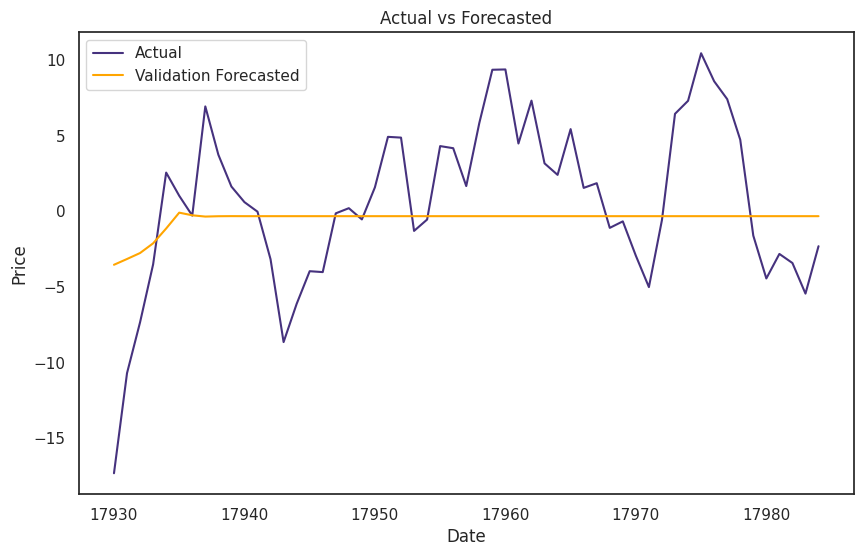

trainset: 313 -- 318
val_set: 319 -- 319


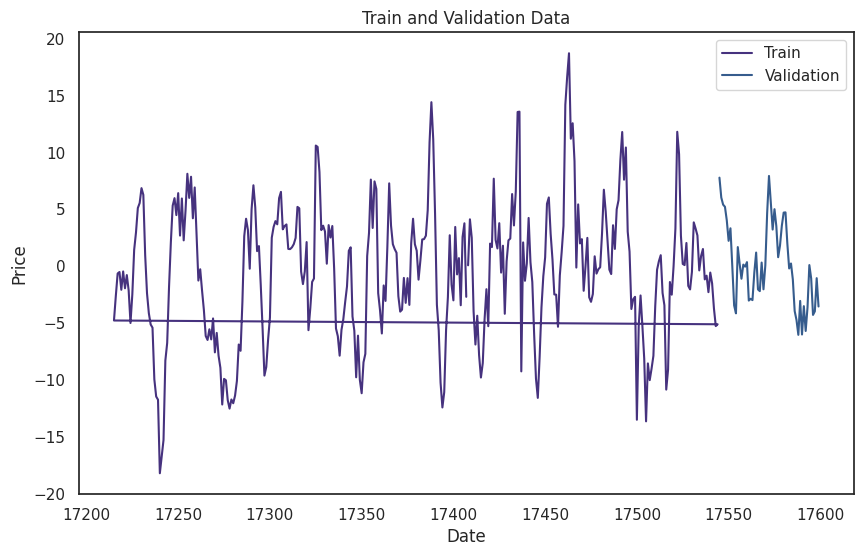

Forecasted Values: [-1.14364168 -1.74015232 -0.71145379 -2.14208203 -2.23183908 -0.69054628
 -0.65692506 -0.54706766 -0.54184153 -0.53393794 -0.53336344 -0.53278968
 -0.53273418 -0.53269217 -0.53268715 -0.53268405 -0.53268362 -0.53268339
 -0.53268335 -0.53268333 -0.53268333 -0.53268333 -0.53268333 -0.53268333
 -0.53268333 -0.53268333 -0.53268333 -0.53268333 -0.53268333 -0.53268333
 -0.53268333 -0.53268333 -0.53268333 -0.53268333 -0.53268333 -0.53268333
 -0.53268333 -0.53268333 -0.53268333 -0.53268333 -0.53268333 -0.53268333
 -0.53268333 -0.53268333 -0.53268333 -0.53268333 -0.53268333 -0.53268333
 -0.53268333 -0.53268333 -0.53268333 -0.53268333 -0.53268333 -0.53268333
 -0.53268333]
MAE: 3.0326888216985894
RMSE: 3.8480148003020815


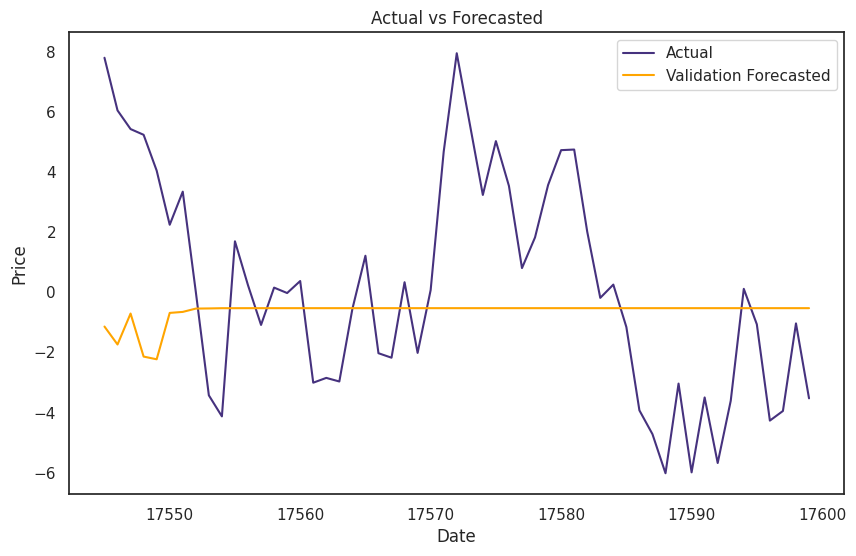

trainset: 306 -- 311
val_set: 312 -- 312


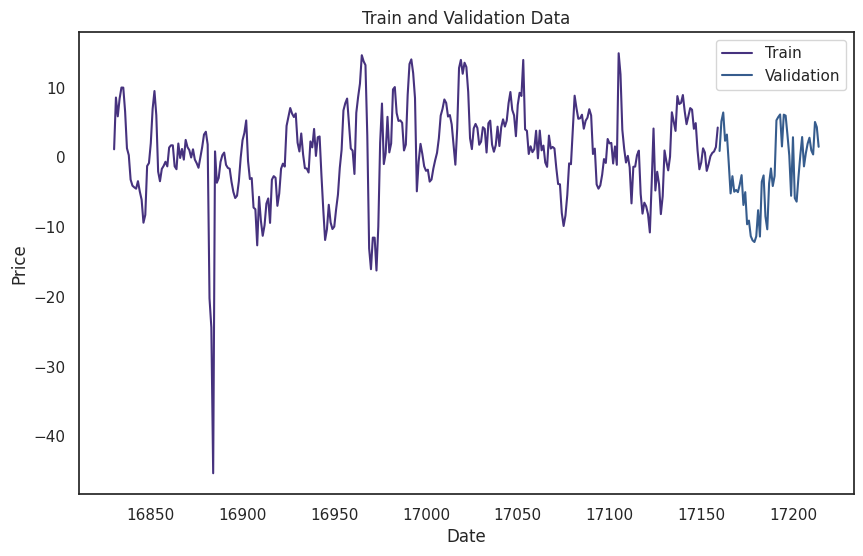

Forecasted Values: [3.67782465 3.14730838 2.39904295 2.19138505 1.95326271 1.41997617
 1.41161924 1.52585565 1.54046693 1.51743342 1.51169567 1.51602696
 1.5177517  1.51700962 1.51655394 1.51666313 1.51677378 1.5167626
 1.51673745 1.51673705 1.51674243 1.51674312 1.51674204 1.51674177
 1.51674197 1.51674205 1.51674202 1.516742   1.516742   1.51674201
 1.51674201 1.516742   1.516742   1.516742   1.516742   1.516742
 1.516742   1.516742   1.516742   1.516742   1.516742   1.516742
 1.516742   1.516742   1.516742   1.516742   1.516742   1.516742
 1.516742   1.516742   1.516742   1.516742   1.516742   1.516742
 1.516742  ]
MAE: 5.195100486978592
RMSE: 6.392700636908899


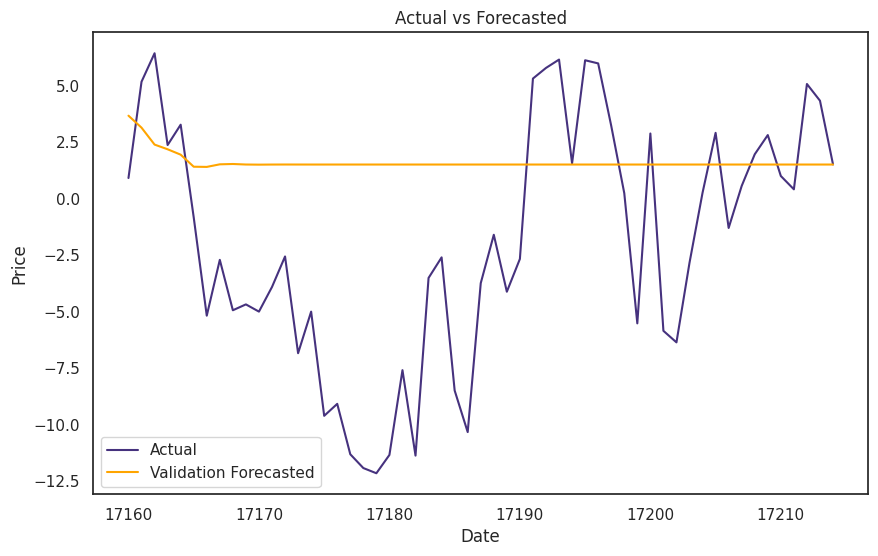

trainset: 299 -- 304
val_set: 305 -- 305


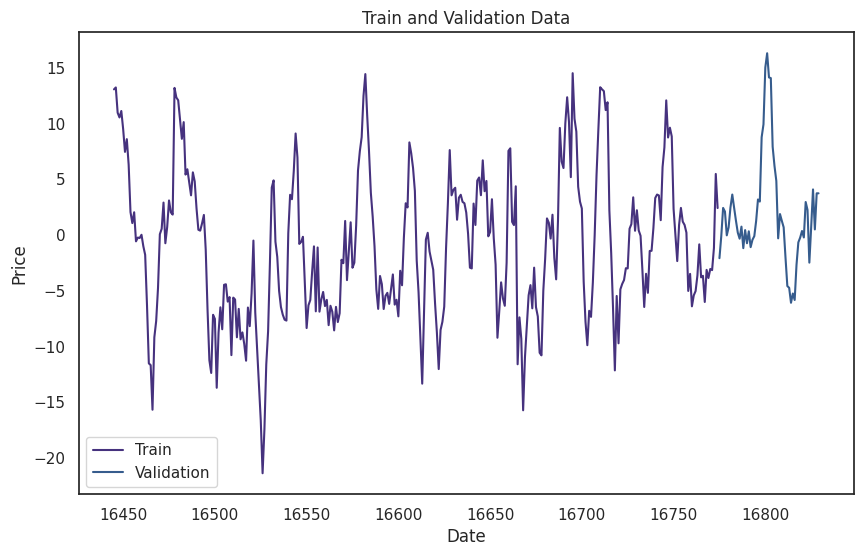

Forecasted Values: [ 2.89553556  3.08648738  2.61867546  1.7489215  -0.5612386  -0.3578157
 -0.74268435 -0.76517288 -0.8379532  -0.85318582 -0.86863583 -0.87375334
 -0.87732255 -0.87879272 -0.8796615  -0.8800598  -0.88027748 -0.88038267
 -0.88043804 -0.8804655  -0.88047969 -0.88048682 -0.88049047 -0.88049231
 -0.88049325 -0.88049373 -0.88049397 -0.8804941  -0.88049416 -0.88049419
 -0.88049421 -0.88049421 -0.88049422 -0.88049422 -0.88049422 -0.88049422
 -0.88049422 -0.88049422 -0.88049422 -0.88049422 -0.88049422 -0.88049422
 -0.88049422 -0.88049422 -0.88049422 -0.88049422 -0.88049422 -0.88049422
 -0.88049422 -0.88049422 -0.88049422 -0.88049422 -0.88049422 -0.88049422
 -0.88049422]
MAE: 3.7595238814713055
RMSE: 5.587667837402753


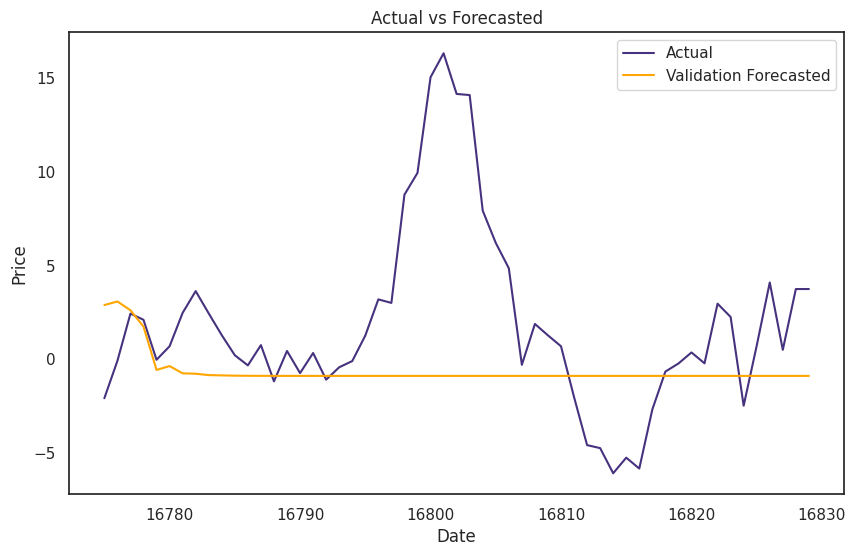

trainset: 292 -- 297
val_set: 298 -- 298


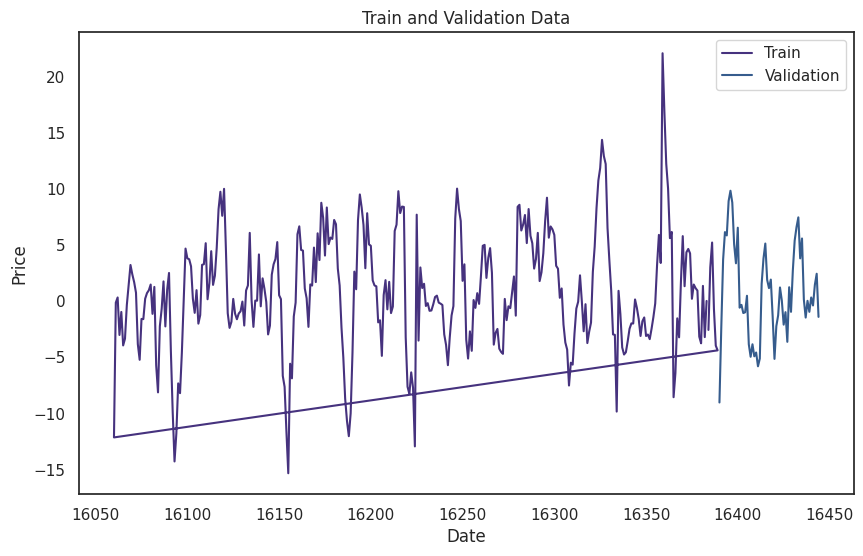

Forecasted Values: [0.11005344 1.18992774 1.59801377 0.05202034 1.12850509 0.72083224
 0.66258886 0.69398223 0.69672357 0.69438265 0.69429153 0.69446111
 0.69446011 0.69444816 0.69444875 0.69444957 0.69444949 0.69444944
 0.69444945 0.69444945 0.69444945 0.69444945 0.69444945 0.69444945
 0.69444945 0.69444945 0.69444945 0.69444945 0.69444945 0.69444945
 0.69444945 0.69444945 0.69444945 0.69444945 0.69444945 0.69444945
 0.69444945 0.69444945 0.69444945 0.69444945 0.69444945 0.69444945
 0.69444945 0.69444945 0.69444945 0.69444945 0.69444945 0.69444945
 0.69444945 0.69444945 0.69444945 0.69444945 0.69444945 0.69444945
 0.69444945]
MAE: 3.333026754912737
RMSE: 4.106709632920552


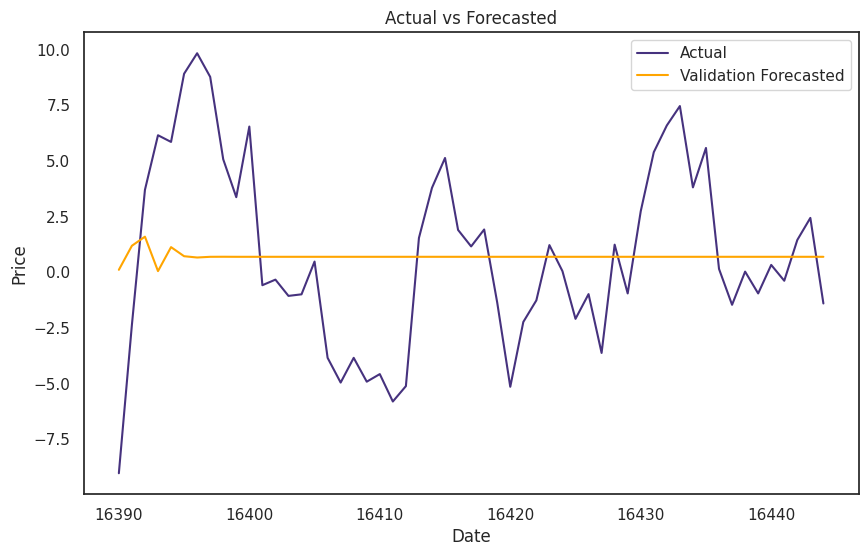

trainset: 285 -- 290
val_set: 291 -- 291


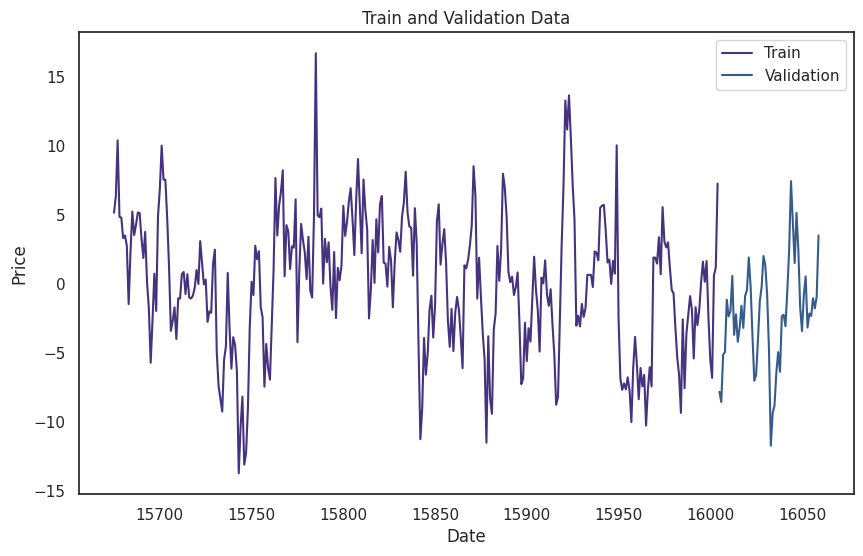

Forecasted Values: [ 7.26983194  6.84896124  6.92934309  2.92111805  3.60001172 -0.26572566
  0.19358707 -0.10090496 -0.04007898 -0.06529548 -0.05872457 -0.06103052
 -0.0603657  -0.06058346 -0.06051787 -0.06053873 -0.06053233 -0.06053434
 -0.06053372 -0.06053391 -0.06053385 -0.06053387 -0.06053387 -0.06053387
 -0.06053387 -0.06053387 -0.06053387 -0.06053387 -0.06053387 -0.06053387
 -0.06053387 -0.06053387 -0.06053387 -0.06053387 -0.06053387 -0.06053387
 -0.06053387 -0.06053387 -0.06053387 -0.06053387 -0.06053387 -0.06053387
 -0.06053387 -0.06053387 -0.06053387 -0.06053387 -0.06053387 -0.06053387
 -0.06053387 -0.06053387 -0.06053387 -0.06053387 -0.06053387 -0.06053387
 -0.06053387]
MAE: 3.759671490361594
RMSE: 5.24153177739445


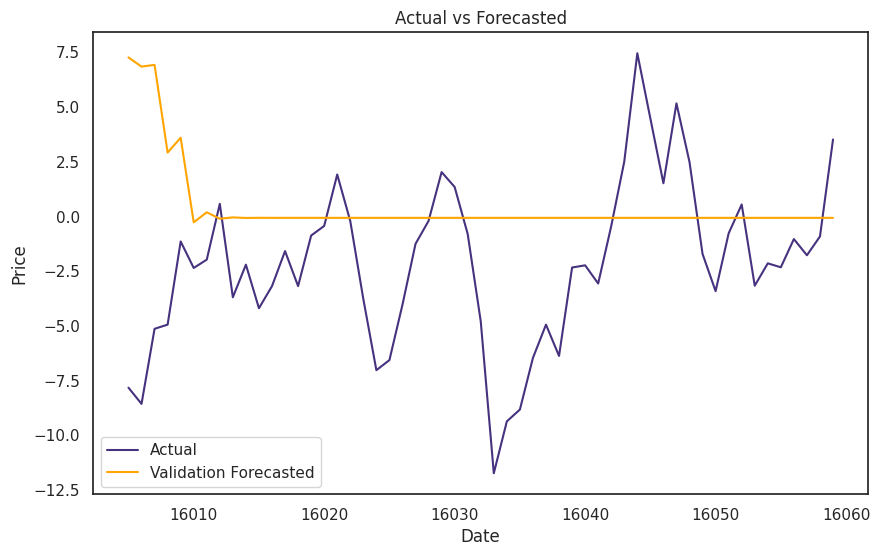

trainset: 278 -- 283
val_set: 284 -- 284


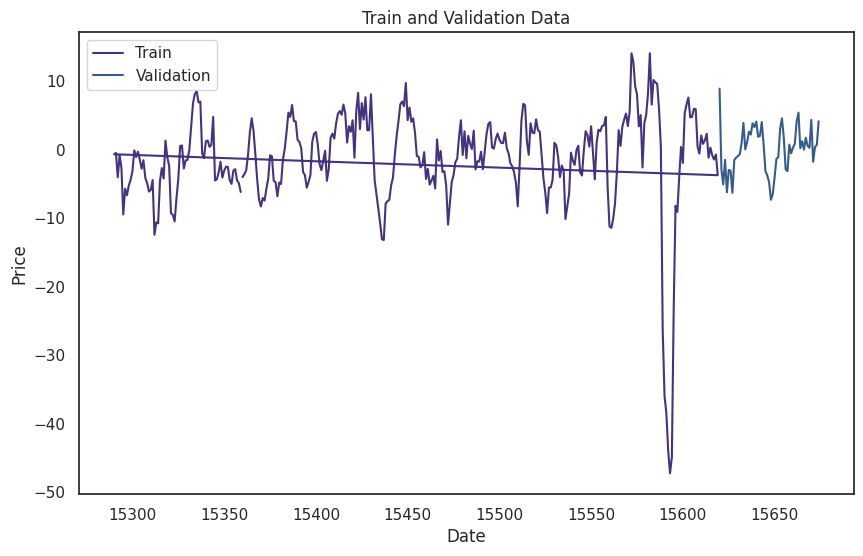

Forecasted Values: [-5.97695449 -6.12261412 -7.47638939 -3.99845055 -3.1668262  -1.7758131
 -1.49455941 -1.44088265 -1.43067972 -1.4287409  -1.42837248 -1.42830247
 -1.42828917 -1.42828664 -1.42828616 -1.42828607 -1.42828605 -1.42828605
 -1.42828605 -1.42828605 -1.42828605 -1.42828605 -1.42828605 -1.42828605
 -1.42828605 -1.42828605 -1.42828605 -1.42828605 -1.42828605 -1.42828605
 -1.42828605 -1.42828605 -1.42828605 -1.42828605 -1.42828605 -1.42828605
 -1.42828605 -1.42828605 -1.42828605 -1.42828605 -1.42828605 -1.42828605
 -1.42828605 -1.42828605 -1.42828605 -1.42828605 -1.42828605 -1.42828605
 -1.42828605 -1.42828605 -1.42828605 -1.42828605 -1.42828605 -1.42828605
 -1.42828605]
MAE: 3.2289712681853135
RMSE: 3.896322882269392


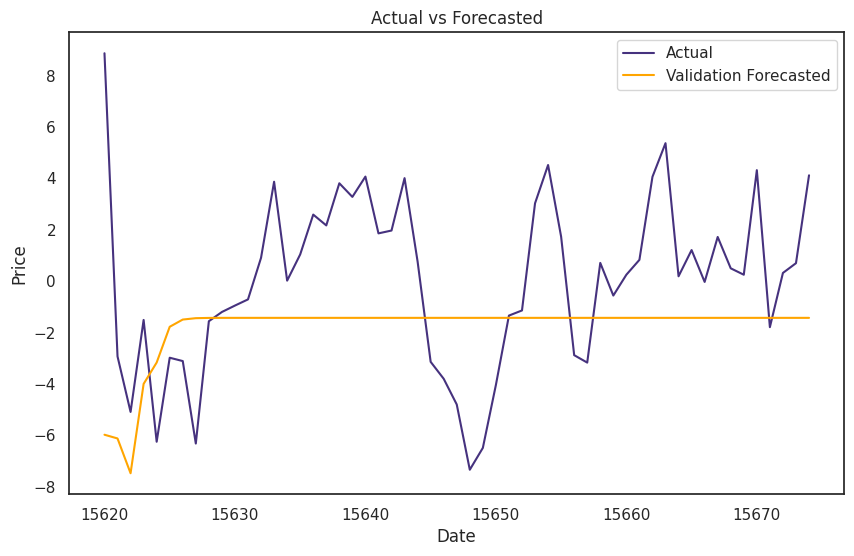

trainset: 271 -- 276
val_set: 277 -- 277


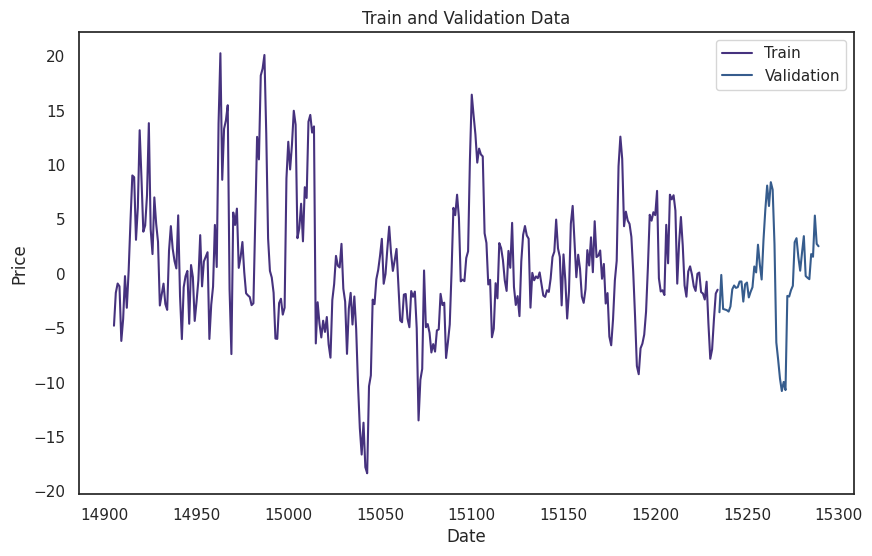

Forecasted Values: [0.1114046  2.31898018 2.50312598 1.02612261 1.0264284  0.64788235
 0.66300892 0.68079758 0.67935104 0.67854455 0.67864709 0.67868218
 0.67867579 0.67867434 0.67867471 0.67867477 0.67867475 0.67867474
 0.67867475 0.67867475 0.67867475 0.67867475 0.67867475 0.67867475
 0.67867475 0.67867475 0.67867475 0.67867475 0.67867475 0.67867475
 0.67867475 0.67867475 0.67867475 0.67867475 0.67867475 0.67867475
 0.67867475 0.67867475 0.67867475 0.67867475 0.67867475 0.67867475
 0.67867475 0.67867475 0.67867475 0.67867475 0.67867475 0.67867475
 0.67867475 0.67867475 0.67867475 0.67867475 0.67867475 0.67867475
 0.67867475]
MAE: 3.351606948972909
RMSE: 4.460108271089365


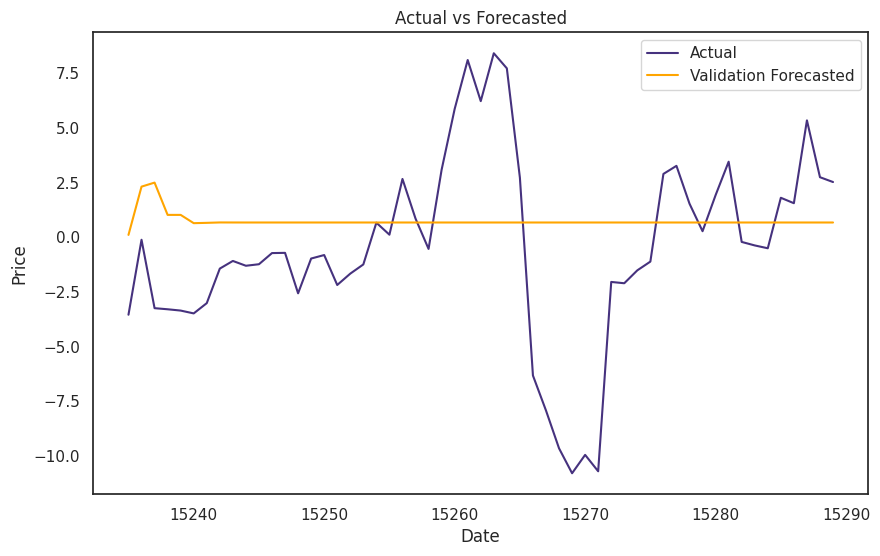

trainset: 264 -- 269
val_set: 270 -- 270


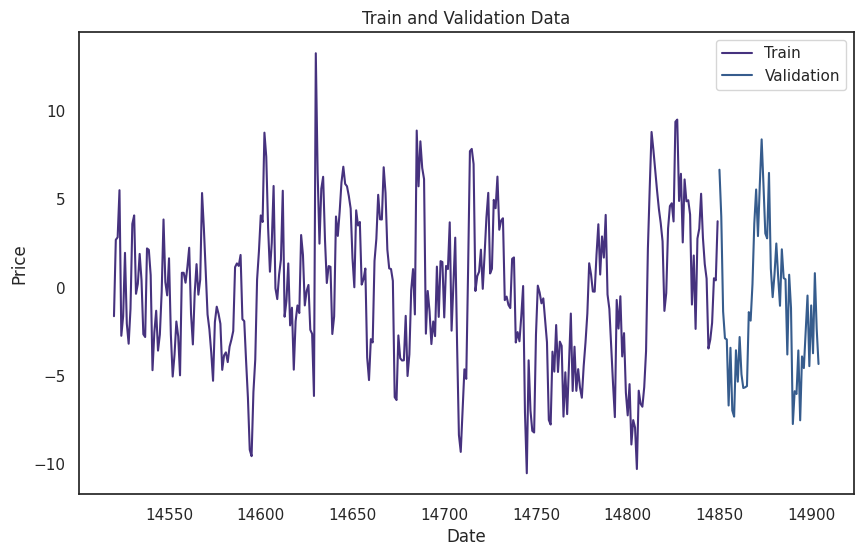

Forecasted Values: [ 3.50572149  2.39496523  1.26285323  0.89331953  0.87265299 -0.33004039
 -0.31030471 -0.15703099 -0.16172963 -0.18123211 -0.18035497 -0.17787745
 -0.17802466 -0.17833889 -0.17831563 -0.17827584 -0.17827937 -0.1782844
 -0.17828388 -0.17828325 -0.17828332 -0.1782834  -0.17828339 -0.17828338
 -0.17828338 -0.17828338 -0.17828338 -0.17828338 -0.17828338 -0.17828338
 -0.17828338 -0.17828338 -0.17828338 -0.17828338 -0.17828338 -0.17828338
 -0.17828338 -0.17828338 -0.17828338 -0.17828338 -0.17828338 -0.17828338
 -0.17828338 -0.17828338 -0.17828338 -0.17828338 -0.17828338 -0.17828338
 -0.17828338 -0.17828338 -0.17828338 -0.17828338 -0.17828338 -0.17828338
 -0.17828338]
MAE: 3.631985229312602
RMSE: 4.131779490061119


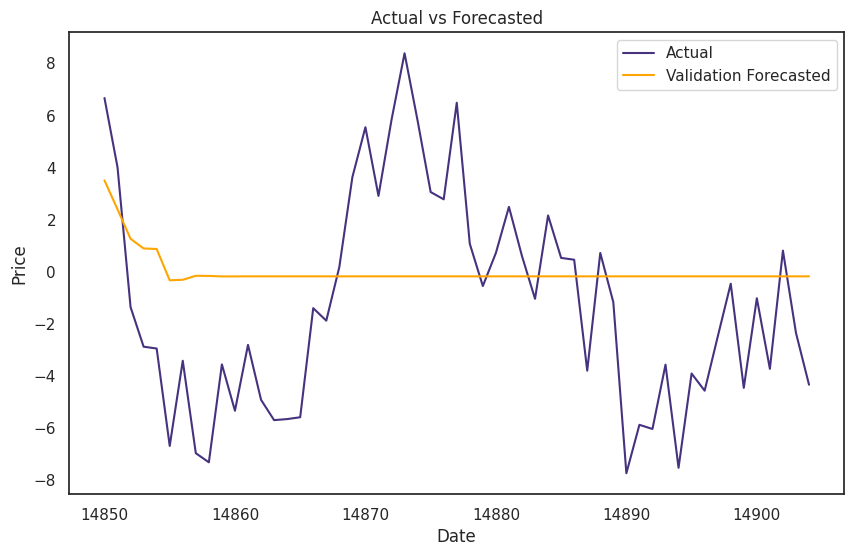

trainset: 257 -- 262
val_set: 263 -- 263


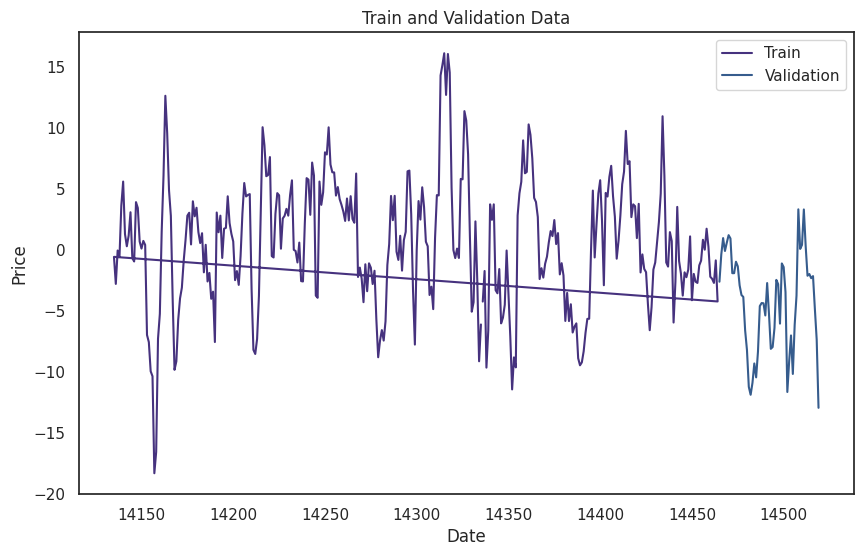

Forecasted Values: [-3.34217489 -3.19289211 -5.86199854 -2.65367694  1.52731436  1.36266902
  0.77260366  0.78157423  0.86450929  0.86523503  0.85362582  0.85324646
  0.85486486  0.85495675  0.85473206  0.85471381  0.85474487  0.85474817
  0.8547439   0.85474333  0.85474392  0.85474401  0.85474393  0.85474392
  0.85474393  0.85474393  0.85474393  0.85474393  0.85474393  0.85474393
  0.85474393  0.85474393  0.85474393  0.85474393  0.85474393  0.85474393
  0.85474393  0.85474393  0.85474393  0.85474393  0.85474393  0.85474393
  0.85474393  0.85474393  0.85474393  0.85474393  0.85474393  0.85474393
  0.85474393  0.85474393  0.85474393  0.85474393  0.85474393  0.85474393
  0.85474393]
MAE: 5.1929269628654655
RMSE: 6.583754944285011


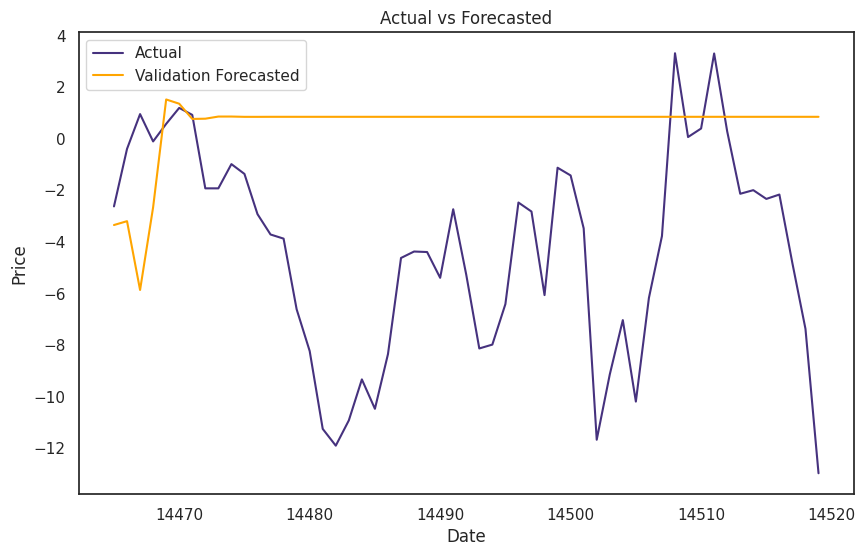

trainset: 250 -- 255
val_set: 256 -- 256


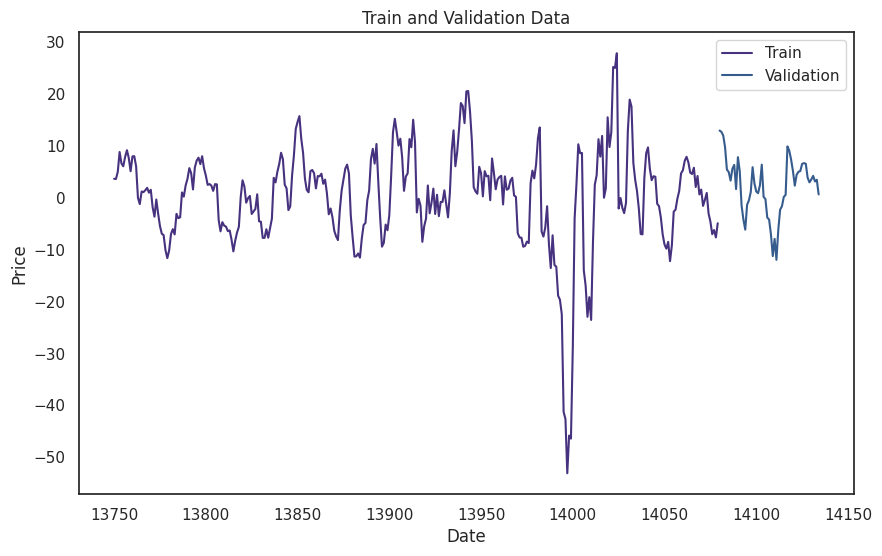

Forecasted Values: [-2.4149505   0.35477107  1.96993506  2.62578172  2.48302037  0.71708534
  0.31617614  0.22282118  0.20109662  0.19604104  0.19486454  0.19459075
  0.19452704  0.19451221  0.19450876  0.19450796  0.19450777  0.19450773
  0.19450772  0.19450771  0.19450771  0.19450771  0.19450771  0.19450771
  0.19450771  0.19450771  0.19450771  0.19450771  0.19450771  0.19450771
  0.19450771  0.19450771  0.19450771  0.19450771  0.19450771  0.19450771
  0.19450771  0.19450771  0.19450771  0.19450771  0.19450771  0.19450771
  0.19450771  0.19450771  0.19450771  0.19450771  0.19450771  0.19450771
  0.19450771  0.19450771  0.19450771  0.19450771  0.19450771  0.19450771
  0.19450771]
MAE: 4.796511756678039
RMSE: 5.822135992682398


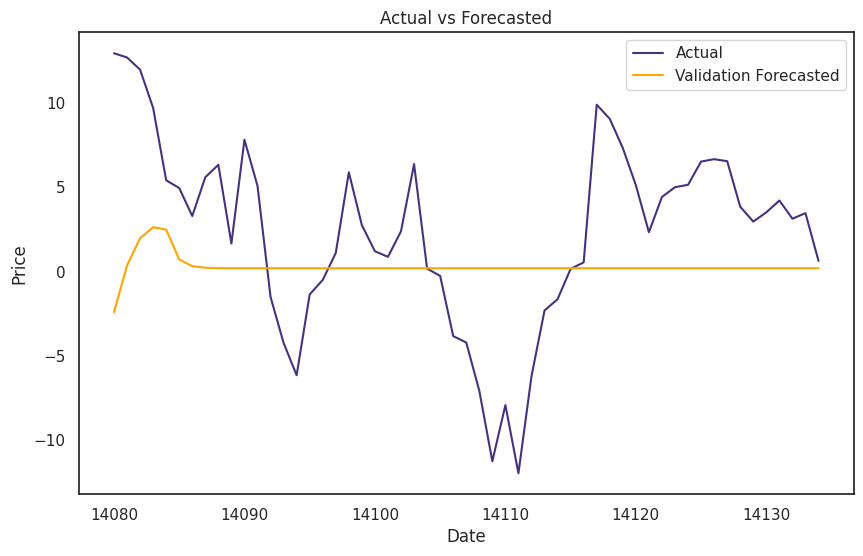

trainset: 243 -- 248
val_set: 249 -- 249


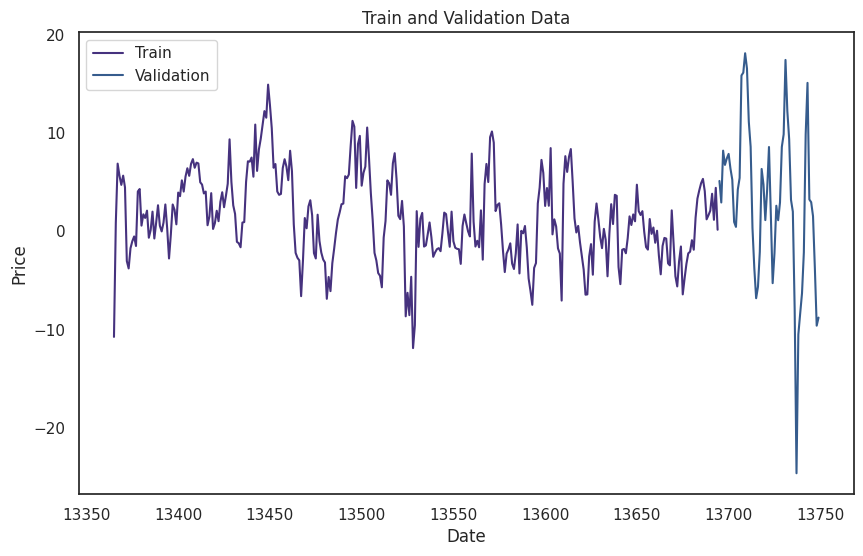

Forecasted Values: [-0.68202717 -0.91294463 -2.59247943 -1.30590962 -2.15312449  0.51558383
  0.23212307 -0.03559462  0.03539518  0.05617176  0.0450043   0.04420036
  0.045605    0.04549715  0.04535034  0.04538377  0.04539595  0.04539035
  0.04538974  0.04539047  0.04539044  0.04539036  0.04539037  0.04539038
  0.04539038  0.04539038  0.04539038  0.04539038  0.04539038  0.04539038
  0.04539038  0.04539038  0.04539038  0.04539038  0.04539038  0.04539038
  0.04539038  0.04539038  0.04539038  0.04539038  0.04539038  0.04539038
  0.04539038  0.04539038  0.04539038  0.04539038  0.04539038  0.04539038
  0.04539038  0.04539038  0.04539038  0.04539038  0.04539038  0.04539038
  0.04539038]
MAE: 7.023345127528698
RMSE: 8.779876373060109


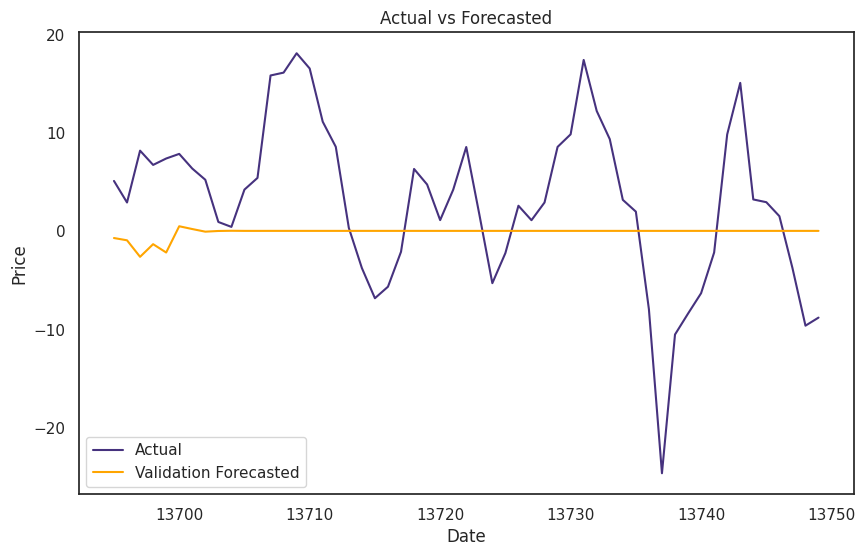

trainset: 236 -- 241
val_set: 242 -- 242


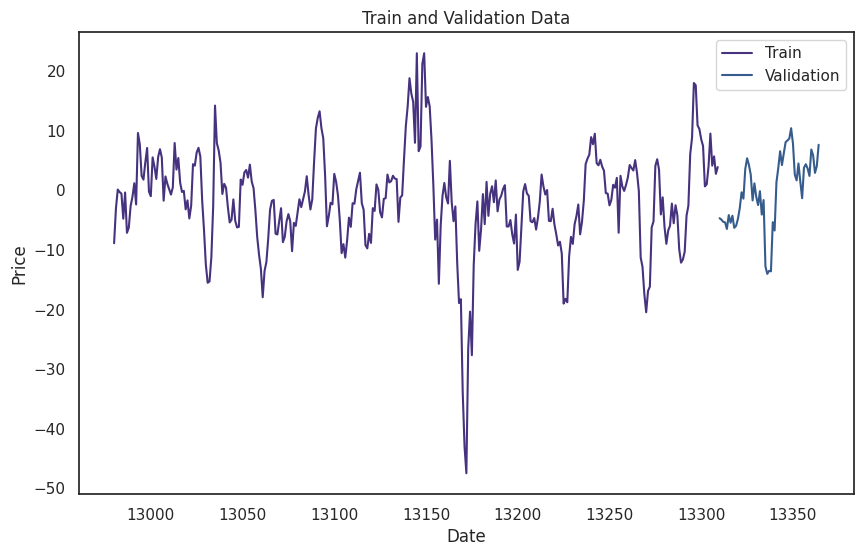

Forecasted Values: [ 1.76485394 -1.67147505 -0.49414282 -1.90805697 -0.49137028 -1.86083467
 -1.6621062  -1.88540771 -1.85839575 -1.89495627 -1.89145685 -1.89746839
 -1.8970504  -1.89804323 -1.89800092 -1.89816563 -1.89816312 -1.89819057
 -1.89819092 -1.89819551 -1.8981957  -1.89819647 -1.89819652 -1.89819665
 -1.89819667 -1.89819669 -1.89819669 -1.8981967  -1.8981967  -1.8981967
 -1.8981967  -1.8981967  -1.8981967  -1.8981967  -1.8981967  -1.8981967
 -1.8981967  -1.8981967  -1.8981967  -1.8981967  -1.8981967  -1.8981967
 -1.8981967  -1.8981967  -1.8981967  -1.8981967  -1.8981967  -1.8981967
 -1.8981967  -1.8981967  -1.8981967  -1.8981967  -1.8981967  -1.8981967
 -1.8981967 ]
MAE: 5.219563166802516
RMSE: 6.318735829591227


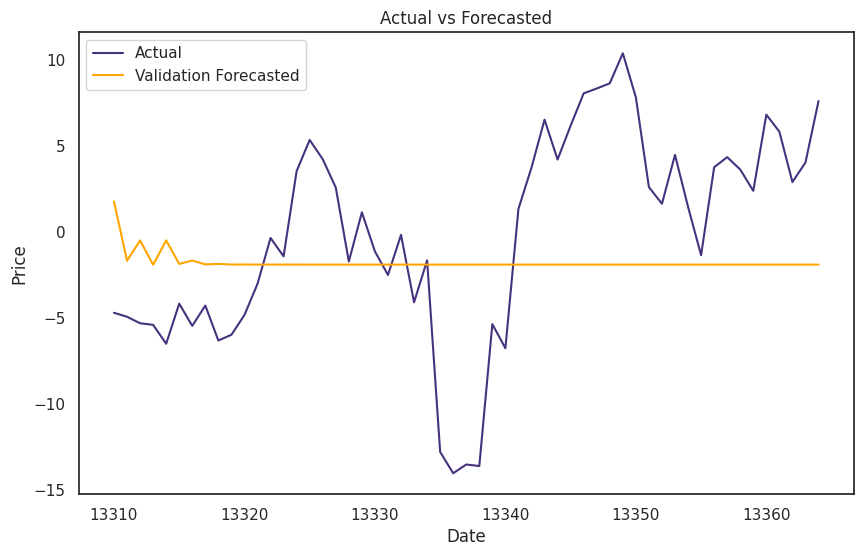

trainset: 229 -- 234
val_set: 235 -- 235


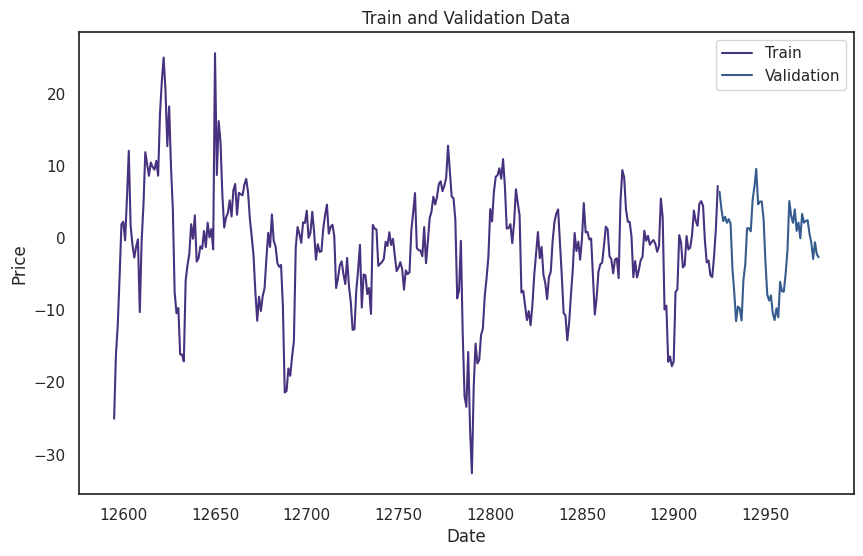

Forecasted Values: [ 6.14633932  5.99594186  4.94850621  3.04294722  1.16769819 -1.2304342
 -1.63769522 -1.7237689  -1.74115065 -1.74469187 -1.74541208 -1.74555861
 -1.74558842 -1.74559448 -1.74559572 -1.74559597 -1.74559602 -1.74559603
 -1.74559603 -1.74559603 -1.74559603 -1.74559603 -1.74559603 -1.74559603
 -1.74559603 -1.74559603 -1.74559603 -1.74559603 -1.74559603 -1.74559603
 -1.74559603 -1.74559603 -1.74559603 -1.74559603 -1.74559603 -1.74559603
 -1.74559603 -1.74559603 -1.74559603 -1.74559603 -1.74559603 -1.74559603
 -1.74559603 -1.74559603 -1.74559603 -1.74559603 -1.74559603 -1.74559603
 -1.74559603 -1.74559603 -1.74559603 -1.74559603 -1.74559603 -1.74559603
 -1.74559603]
MAE: 5.108563811071137
RMSE: 5.415809207617167


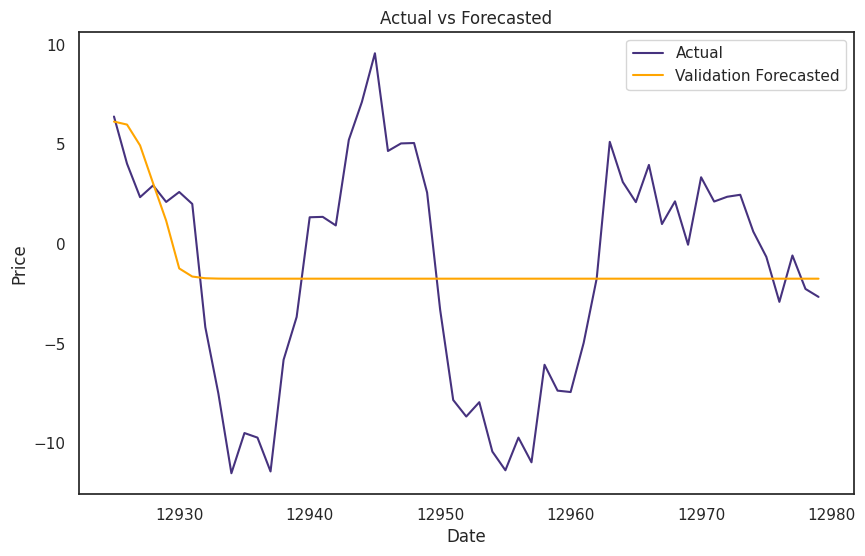

trainset: 222 -- 227
val_set: 228 -- 228


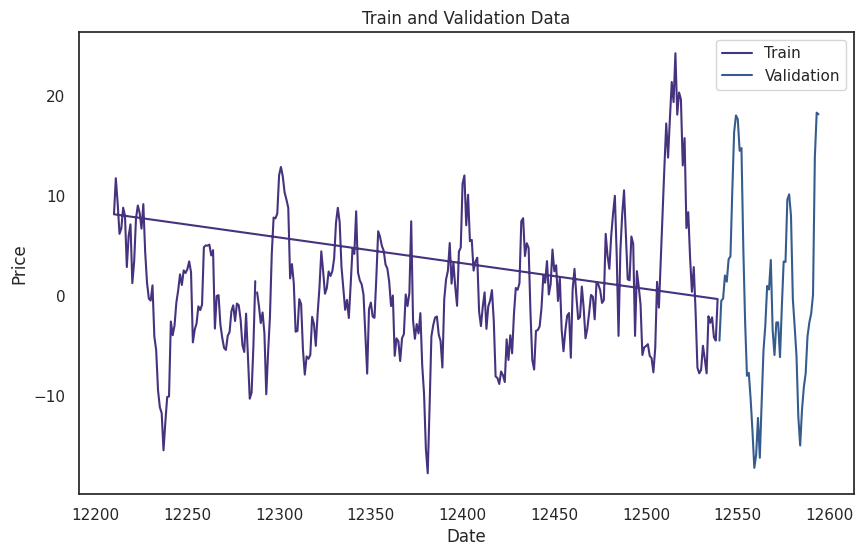

Forecasted Values: [0.18355912 0.78435795 1.70535957 2.88686667 3.21521658 1.97020001
 1.67001034 1.26726994 1.06877323 0.90737621 0.80832058 0.73765382
 0.69125293 0.65938197 0.63802428 0.62351817 0.61373775 0.60711704
 0.60264504 0.59962079 0.59757693 0.59619516 0.59526118 0.5946298
 0.59420301 0.59391451 0.59371949 0.59358766 0.59349855 0.59343831
 0.59339759 0.59337006 0.59335146 0.59333888 0.59333038 0.59332463
 0.59332074 0.59331812 0.59331634 0.59331514 0.59331433 0.59331378
 0.59331341 0.59331316 0.59331299 0.59331288 0.5933128  0.59331275
 0.59331271 0.59331269 0.59331267 0.59331266 0.59331265 0.59331265
 0.59331265]
MAE: 7.835152467675673
RMSE: 9.560456573749931


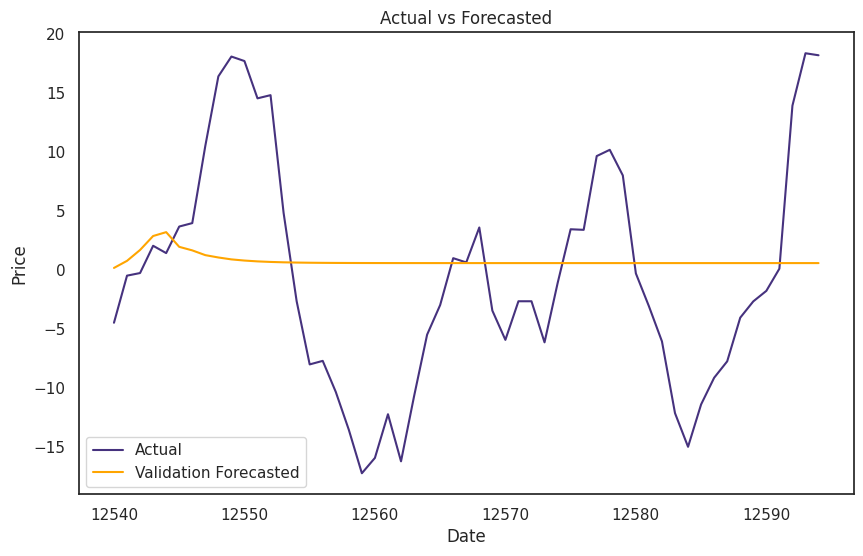

trainset: 215 -- 220
val_set: 221 -- 221


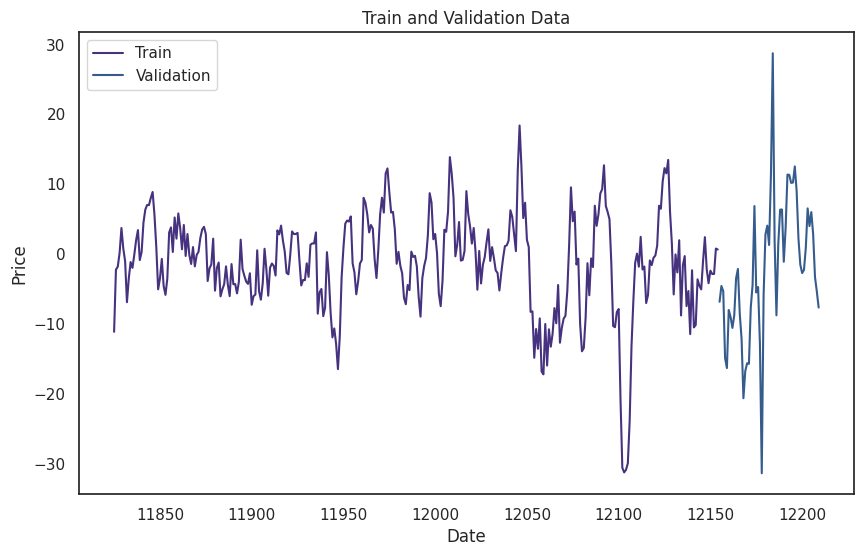

Forecasted Values: [ 0.33064006 -0.38469767  0.93805049 -1.02851832 -2.76377397 -1.42455341
 -1.67187377 -1.49777308 -1.53266498 -1.50997318 -1.51485582 -1.51189108
 -1.51256985 -1.51218163 -1.51227548 -1.51222454 -1.51223745 -1.51223076
 -1.51223253 -1.51223164 -1.51223189 -1.51223177 -1.5122318  -1.51223179
 -1.51223179 -1.51223179 -1.51223179 -1.51223179 -1.51223179 -1.51223179
 -1.51223179 -1.51223179 -1.51223179 -1.51223179 -1.51223179 -1.51223179
 -1.51223179 -1.51223179 -1.51223179 -1.51223179 -1.51223179 -1.51223179
 -1.51223179 -1.51223179 -1.51223179 -1.51223179 -1.51223179 -1.51223179
 -1.51223179 -1.51223179 -1.51223179 -1.51223179 -1.51223179 -1.51223179
 -1.51223179]
MAE: 7.904687565410349
RMSE: 10.08575626934826


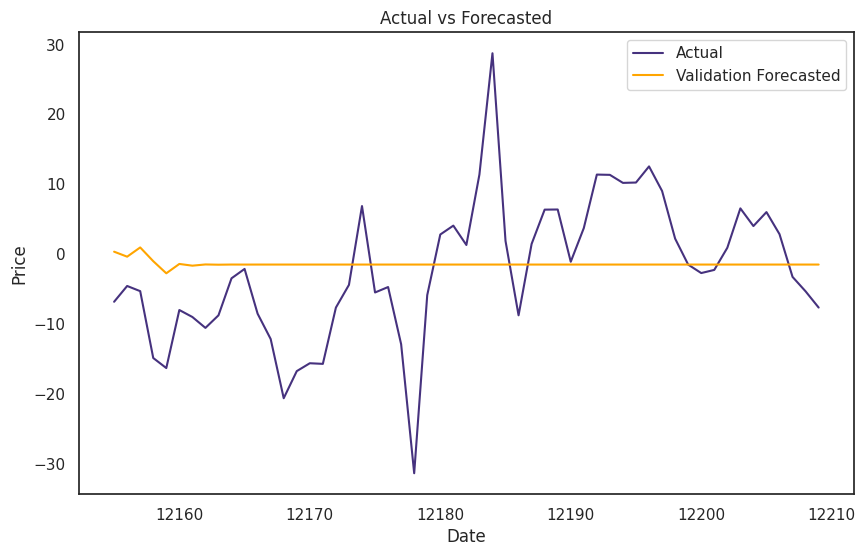

trainset: 208 -- 213
val_set: 214 -- 214


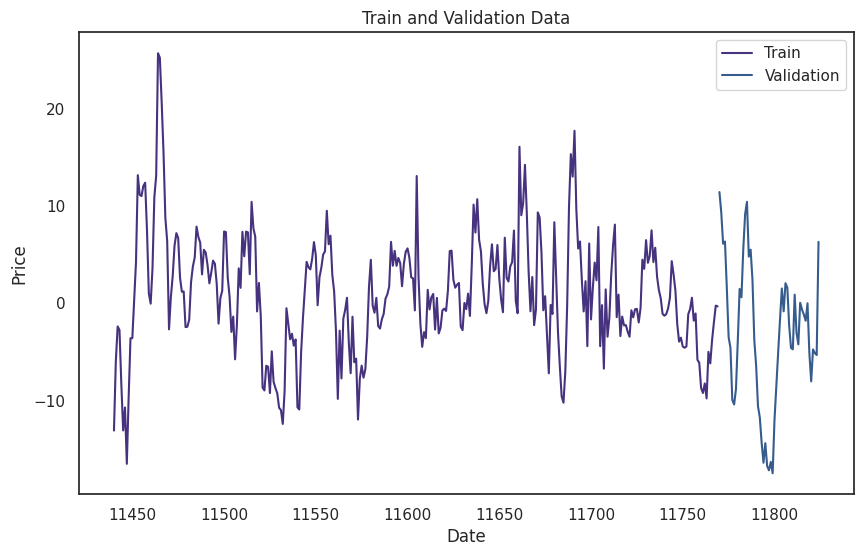

Forecasted Values: [-0.2950032   0.61452263  0.59959445  0.35685628  0.13628089  0.86879252
  0.73425743  0.84521635  0.81223353  0.8308831   0.82404688  0.82737032
  0.82603261  0.82664232  0.82638649  0.82649987  0.82645141  0.82647263
  0.82646349  0.82646747  0.82646574  0.82646649  0.82646617  0.82646631
  0.82646625  0.82646627  0.82646626  0.82646627  0.82646627  0.82646627
  0.82646627  0.82646627  0.82646627  0.82646627  0.82646627  0.82646627
  0.82646627  0.82646627  0.82646627  0.82646627  0.82646627  0.82646627
  0.82646627  0.82646627  0.82646627  0.82646627  0.82646627  0.82646627
  0.82646627  0.82646627  0.82646627  0.82646627  0.82646627  0.82646627
  0.82646627]
MAE: 6.687472898805748
RMSE: 8.491293288171319


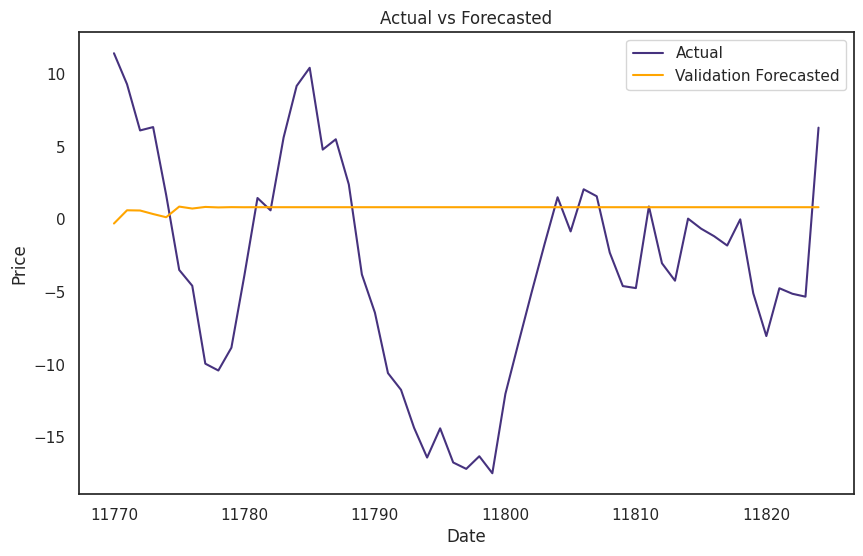

trainset: 201 -- 206
val_set: 207 -- 207


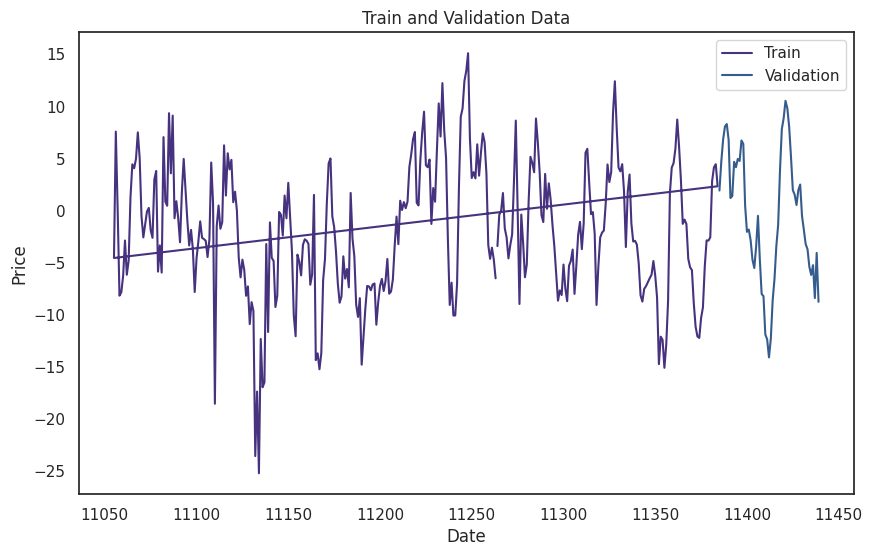

Forecasted Values: [-4.58515009 -1.92345142 -0.69538185 -0.83097529 -0.54306749  0.35912322
  0.37616925  0.30391173  0.29930056  0.30494258  0.30556812  0.30513945
  0.30506965  0.30510122  0.30510828  0.30510604  0.30510537  0.30510552
  0.30510558  0.30510557  0.30510557  0.30510557  0.30510557  0.30510557
  0.30510557  0.30510557  0.30510557  0.30510557  0.30510557  0.30510557
  0.30510557  0.30510557  0.30510557  0.30510557  0.30510557  0.30510557
  0.30510557  0.30510557  0.30510557  0.30510557  0.30510557  0.30510557
  0.30510557  0.30510557  0.30510557  0.30510557  0.30510557  0.30510557
  0.30510557  0.30510557  0.30510557  0.30510557  0.30510557  0.30510557
  0.30510557]
MAE: 5.366636372713561
RMSE: 6.508279437759848


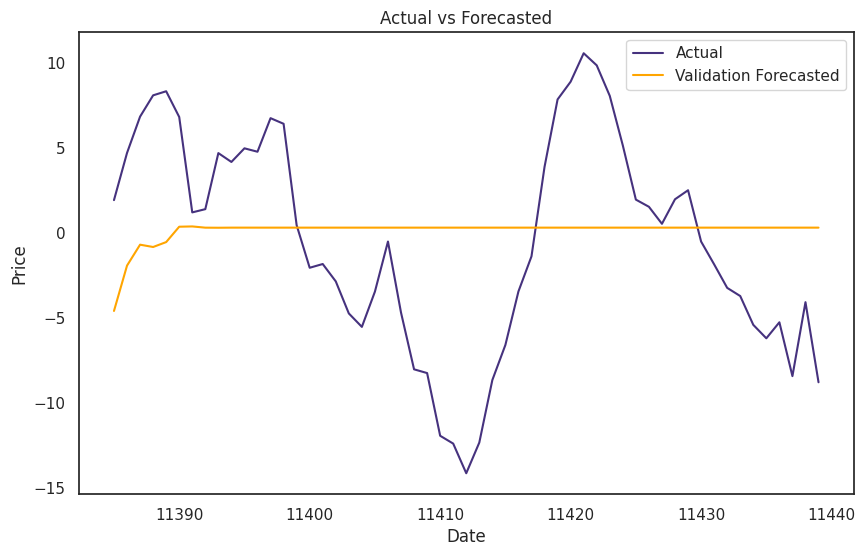

trainset: 194 -- 199
val_set: 200 -- 200


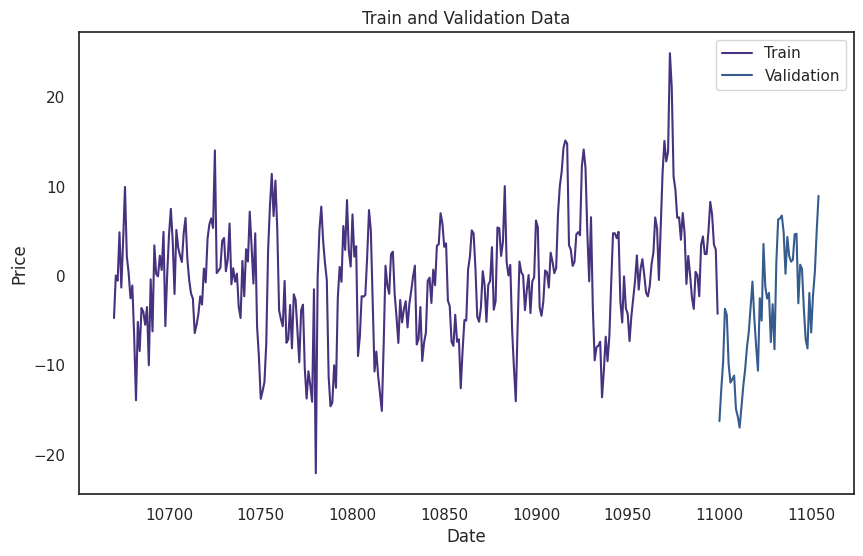

Forecasted Values: [-2.78440621 -4.27919427 -4.91196232 -3.39192844 -1.99373365  1.93429722
  1.1586857   1.12083721  1.1629354   1.15702316  1.15618239  1.15660341
  1.15656528  1.15655307  1.15655701  1.15655685  1.1565567   1.15655674
  1.15655674  1.15655673  1.15655673  1.15655673  1.15655673  1.15655673
  1.15655673  1.15655673  1.15655673  1.15655673  1.15655673  1.15655673
  1.15655673  1.15655673  1.15655673  1.15655673  1.15655673  1.15655673
  1.15655673  1.15655673  1.15655673  1.15655673  1.15655673  1.15655673
  1.15655673  1.15655673  1.15655673  1.15655673  1.15655673  1.15655673
  1.15655673  1.15655673  1.15655673  1.15655673  1.15655673  1.15655673
  1.15655673]
MAE: 6.687229511921612
RMSE: 7.9806610252459125


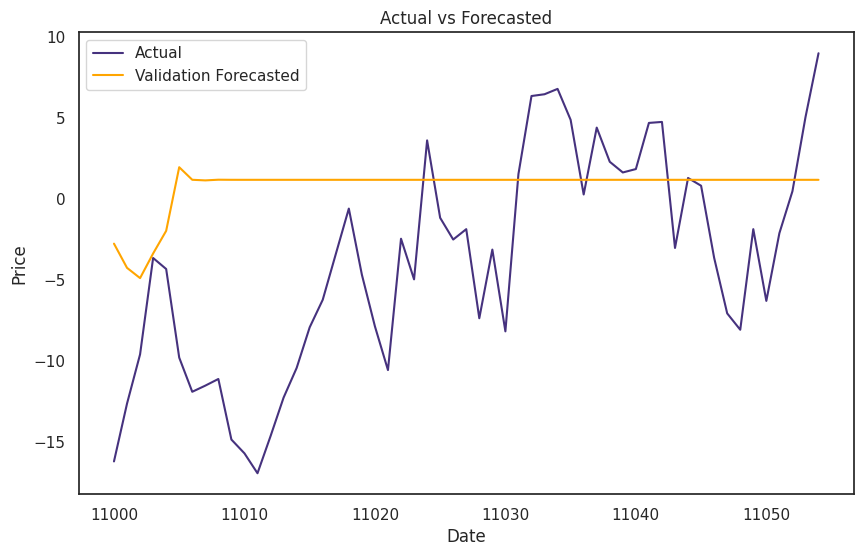

trainset: 187 -- 192
val_set: 193 -- 193


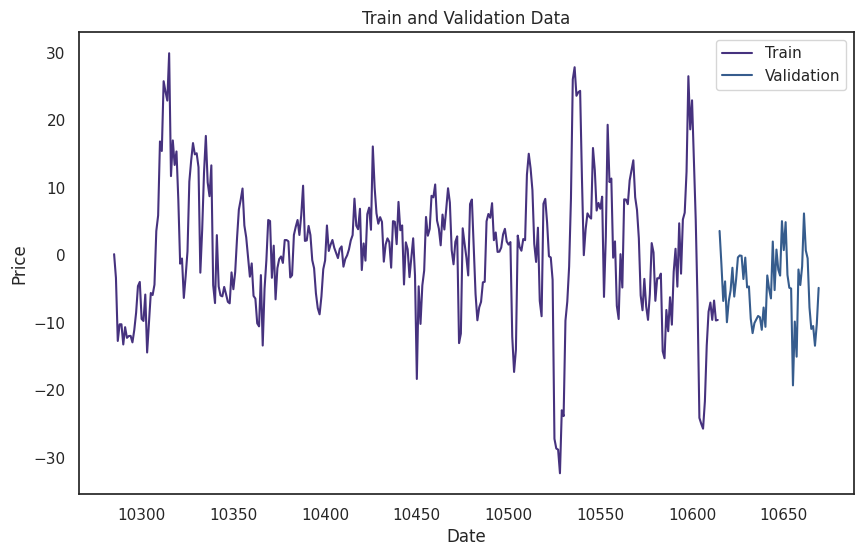

Forecasted Values: [-7.56986283 -3.80867058 -0.91932794 -1.48394315  1.16119371  0.59285962
  0.69082065  0.67356351  0.67659644  0.67606327  0.676157    0.67614052
  0.67614342  0.67614291  0.676143    0.67614298  0.67614299  0.67614299
  0.67614299  0.67614299  0.67614299  0.67614299  0.67614299  0.67614299
  0.67614299  0.67614299  0.67614299  0.67614299  0.67614299  0.67614299
  0.67614299  0.67614299  0.67614299  0.67614299  0.67614299  0.67614299
  0.67614299  0.67614299  0.67614299  0.67614299  0.67614299  0.67614299
  0.67614299  0.67614299  0.67614299  0.67614299  0.67614299  0.67614299
  0.67614299  0.67614299  0.67614299  0.67614299  0.67614299  0.67614299
  0.67614299]
MAE: 6.17642108393147
RMSE: 7.736978175035635


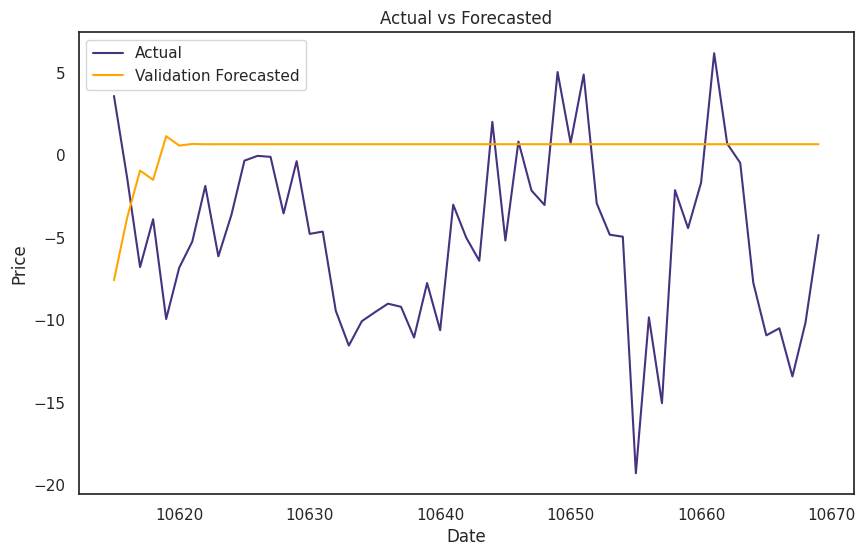

trainset: 180 -- 185
val_set: 186 -- 186


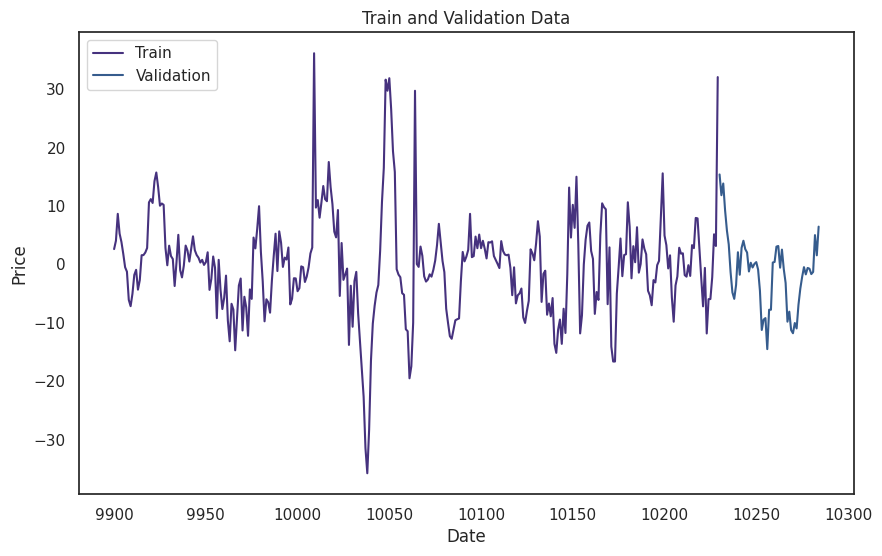

Forecasted Values: [ 2.14312227e+01  2.11321153e+01  1.64321693e+01  1.26806470e+01
  9.43790567e+00 -5.64791550e-01  6.48724259e-01 -9.32130165e-02
  7.99772585e-02  1.33112097e-02  3.25428466e-02  2.60393614e-02
  2.80491224e-02  2.73959933e-02  2.76023122e-02  2.75360929e-02
  2.75571572e-02  2.75504230e-02  2.75525699e-02  2.75518843e-02
  2.75521030e-02  2.75520332e-02  2.75520555e-02  2.75520484e-02
  2.75520507e-02  2.75520499e-02  2.75520502e-02  2.75520501e-02
  2.75520501e-02  2.75520501e-02  2.75520501e-02  2.75520501e-02
  2.75520501e-02  2.75520501e-02  2.75520501e-02  2.75520501e-02
  2.75520501e-02  2.75520501e-02  2.75520501e-02  2.75520501e-02
  2.75520501e-02  2.75520501e-02  2.75520501e-02  2.75520501e-02
  2.75520501e-02  2.75520501e-02  2.75520501e-02  2.75520501e-02
  2.75520501e-02  2.75520501e-02  2.75520501e-02  2.75520501e-02
  2.75520501e-02  2.75520501e-02  2.75520501e-02]
MAE: 6.02591175838552
RMSE: 5.6874281748281135


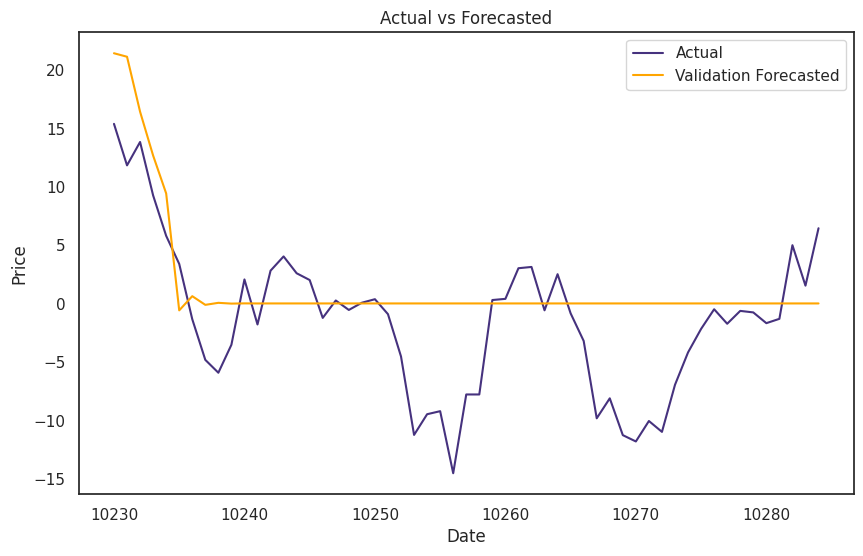

trainset: 173 -- 178
val_set: 179 -- 179


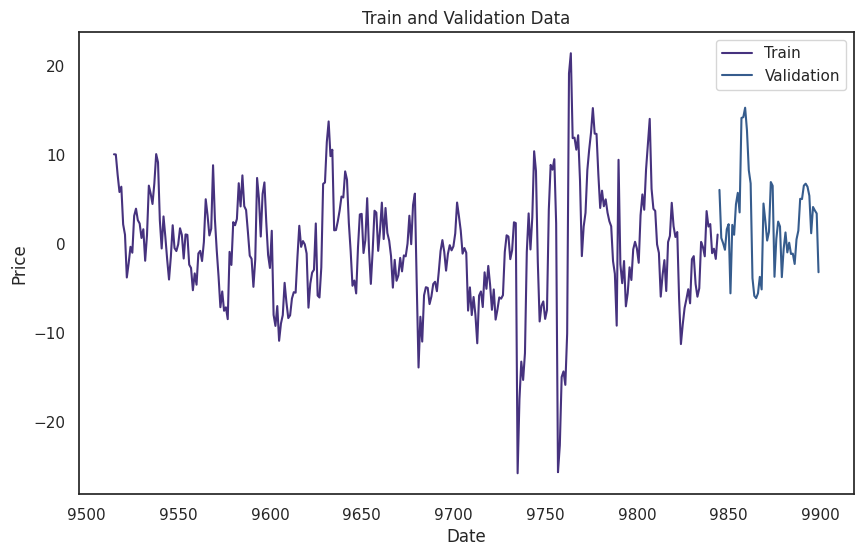

Forecasted Values: [ 1.16826736  0.66460735  1.51543657  1.42577572  1.13804338 -0.38962788
 -0.74096493 -0.43780978 -0.26078772 -0.29095968 -0.34589787 -0.35332449
 -0.34096691 -0.33556234 -0.33729847 -0.33920351 -0.3392798  -0.33880063
 -0.33864668 -0.33872954 -0.33879314 -0.33878915 -0.33877132 -0.33876739
 -0.33877098 -0.33877301 -0.33877264 -0.338772   -0.33877192 -0.33877206
 -0.33877213 -0.33877211 -0.33877208 -0.33877208 -0.33877209 -0.33877209
 -0.33877209 -0.33877209 -0.33877209 -0.33877209 -0.33877209 -0.33877209
 -0.33877209 -0.33877209 -0.33877209 -0.33877209 -0.33877209 -0.33877209
 -0.33877209 -0.33877209 -0.33877209 -0.33877209 -0.33877209 -0.33877209
 -0.33877209]
MAE: 4.306152549684775
RMSE: 5.610379237349346


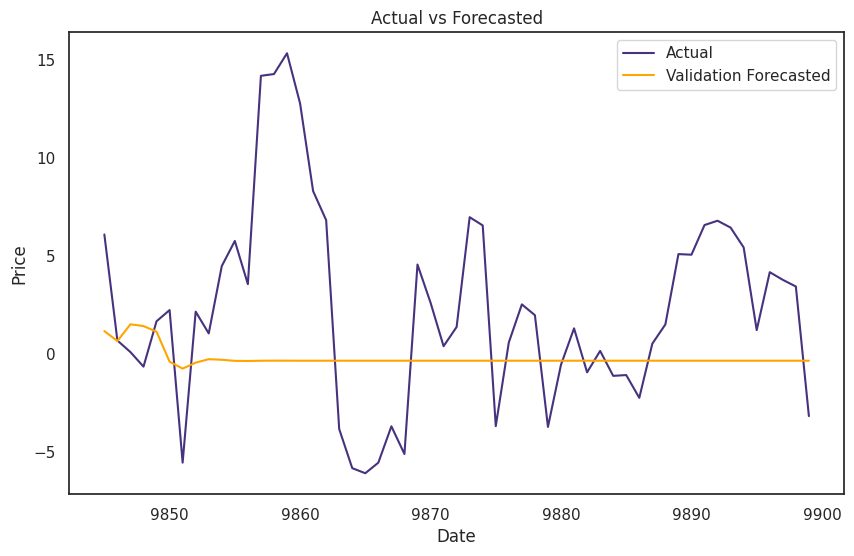

trainset: 166 -- 171
val_set: 172 -- 172


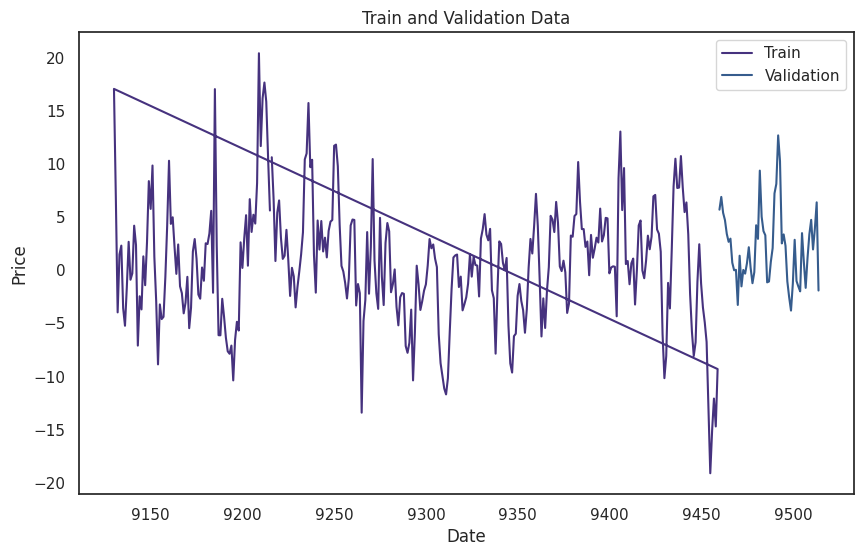

Forecasted Values: [6.46031888 2.99372098 1.31408574 0.85130151 1.01214243 0.62286269
 0.66197098 0.69548005 0.68680041 0.68467001 0.68584325 0.6858905
 0.68576608 0.685779   0.68578965 0.68578684 0.68578617 0.68578655
 0.68578656 0.68578652 0.68578652 0.68578653 0.68578653 0.68578653
 0.68578653 0.68578653 0.68578653 0.68578653 0.68578653 0.68578653
 0.68578653 0.68578653 0.68578653 0.68578653 0.68578653 0.68578653
 0.68578653 0.68578653 0.68578653 0.68578653 0.68578653 0.68578653
 0.68578653 0.68578653 0.68578653 0.68578653 0.68578653 0.68578653
 0.68578653 0.68578653 0.68578653 0.68578653 0.68578653 0.68578653
 0.68578653]
MAE: 2.9170876605815423
RMSE: 3.6329048674808817


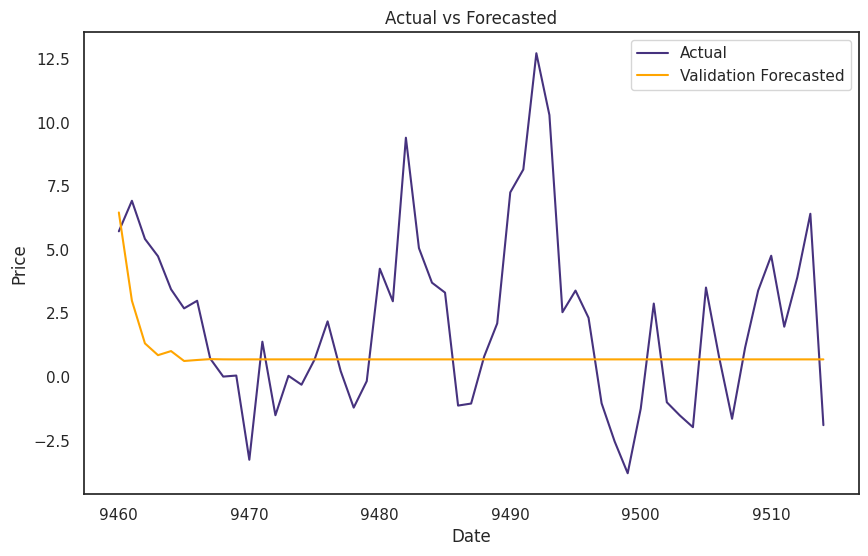

trainset: 159 -- 164
val_set: 165 -- 165


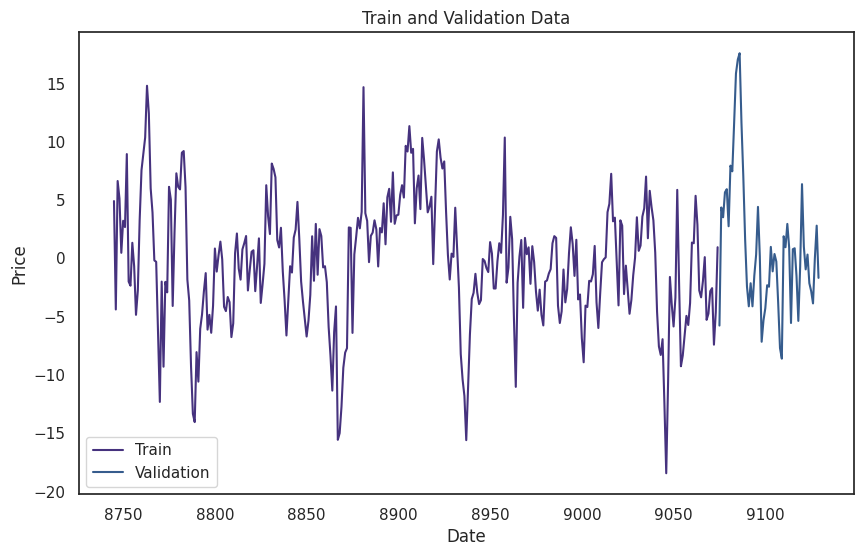

Forecasted Values: [ 0.40927296  0.50331615  1.05231511  2.81208072  0.62746557 -1.36176039
 -0.7115352  -0.54349675 -0.66398382 -0.66688524 -0.64942297 -0.6520226
 -0.65403316 -0.65332083 -0.65316049 -0.65328839 -0.65328893 -0.65327083
 -0.65327387 -0.6532759  -0.65327512 -0.65327497 -0.65327511 -0.6532751
 -0.65327509 -0.65327509 -0.65327509 -0.65327509 -0.65327509 -0.65327509
 -0.65327509 -0.65327509 -0.65327509 -0.65327509 -0.65327509 -0.65327509
 -0.65327509 -0.65327509 -0.65327509 -0.65327509 -0.65327509 -0.65327509
 -0.65327509 -0.65327509 -0.65327509 -0.65327509 -0.65327509 -0.65327509
 -0.65327509 -0.65327509 -0.65327509 -0.65327509 -0.65327509 -0.65327509
 -0.65327509]
MAE: 4.316604284107215
RMSE: 5.976130967680773


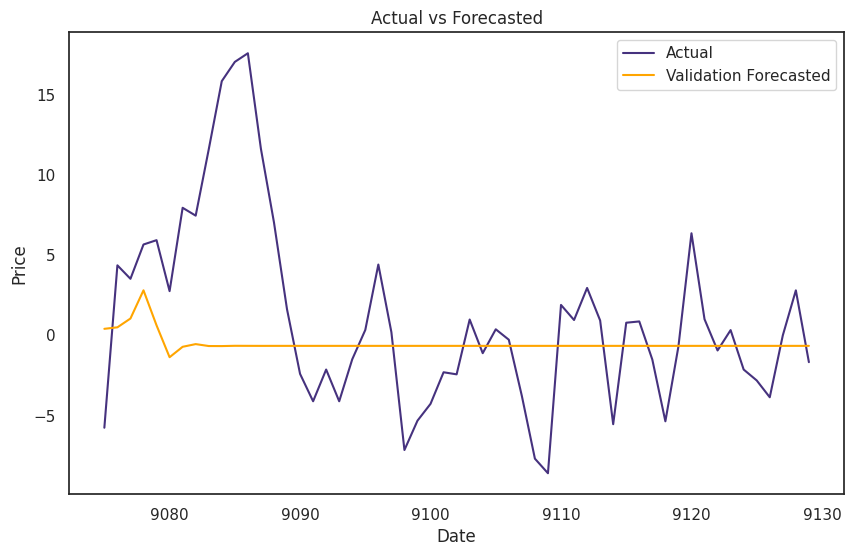

trainset: 152 -- 157
val_set: 158 -- 158


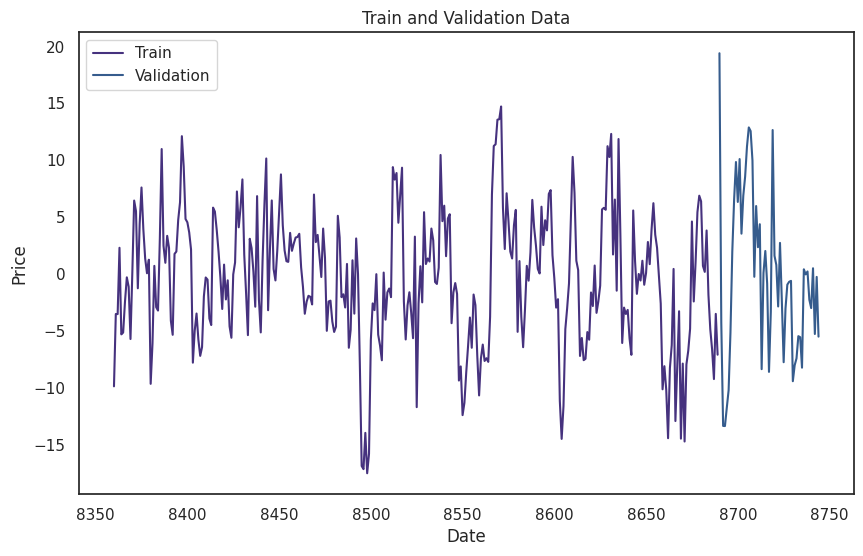

Forecasted Values: [-5.13589326 -3.46283305 -2.26516882  0.33548156 -1.40454485 -0.64357453
 -0.43344461 -0.62062167 -0.62927635 -0.59078785 -0.59583295 -0.60254949
 -0.60037431 -0.59942945 -0.60002489 -0.60010701 -0.59997499 -0.59998194
 -0.6000068  -0.60000106 -0.59999716 -0.59999898 -0.59999943 -0.59999899
 -0.59999898 -0.59999907 -0.59999906 -0.59999904 -0.59999905 -0.59999905
 -0.59999905 -0.59999905 -0.59999905 -0.59999905 -0.59999905 -0.59999905
 -0.59999905 -0.59999905 -0.59999905 -0.59999905 -0.59999905 -0.59999905
 -0.59999905 -0.59999905 -0.59999905 -0.59999905 -0.59999905 -0.59999905
 -0.59999905 -0.59999905 -0.59999905 -0.59999905 -0.59999905 -0.59999905
 -0.59999905]
MAE: 5.699680737506493
RMSE: 7.442162010475407


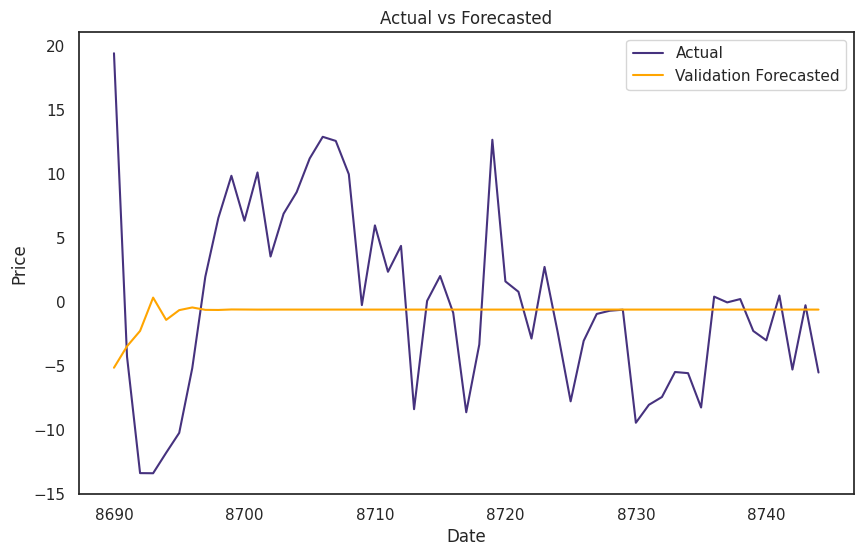

trainset: 145 -- 150
val_set: 151 -- 151


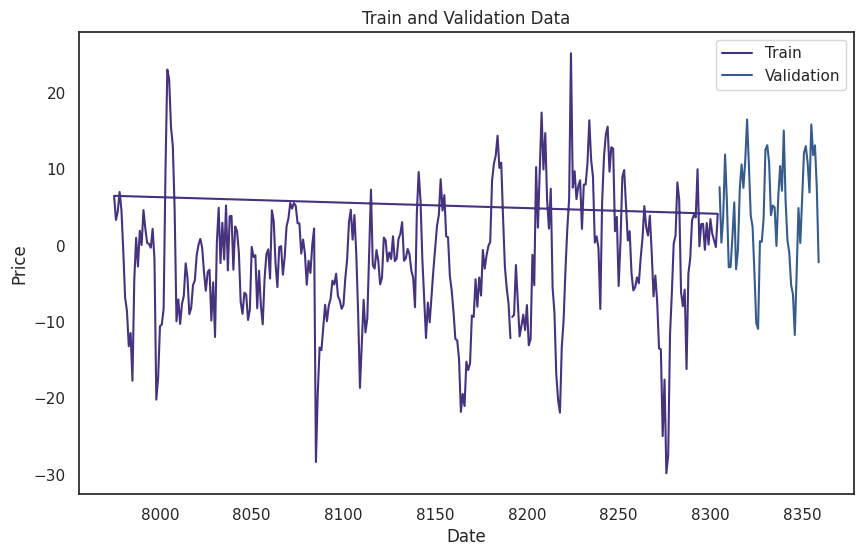

Forecasted Values: [-11.56310939  -9.24642882  -7.54452015  -5.45366934  -5.10702776
  -2.31409719  -2.31753136  -2.1632152   -2.16465271  -2.15611628
  -2.15626471  -2.15579194  -2.15580396  -2.15577775  -2.15577862
  -2.15577717  -2.15577723  -2.15577715  -2.15577715  -2.15577715
  -2.15577715  -2.15577715  -2.15577715  -2.15577715  -2.15577715
  -2.15577715  -2.15577715  -2.15577715  -2.15577715  -2.15577715
  -2.15577715  -2.15577715  -2.15577715  -2.15577715  -2.15577715
  -2.15577715  -2.15577715  -2.15577715  -2.15577715  -2.15577715
  -2.15577715  -2.15577715  -2.15577715  -2.15577715  -2.15577715
  -2.15577715  -2.15577715  -2.15577715  -2.15577715  -2.15577715
  -2.15577715  -2.15577715  -2.15577715  -2.15577715  -2.15577715]
MAE: 8.440288819652666
RMSE: 10.076257539960707


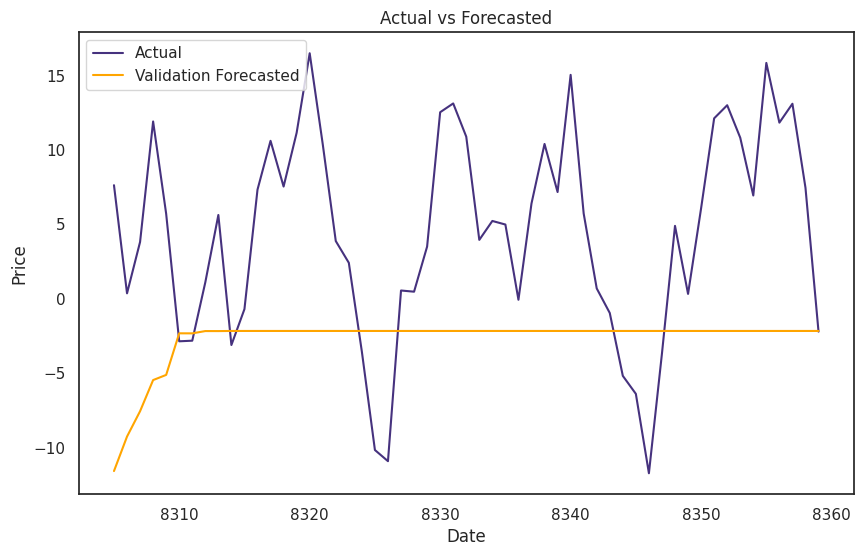

trainset: 138 -- 143
val_set: 144 -- 144


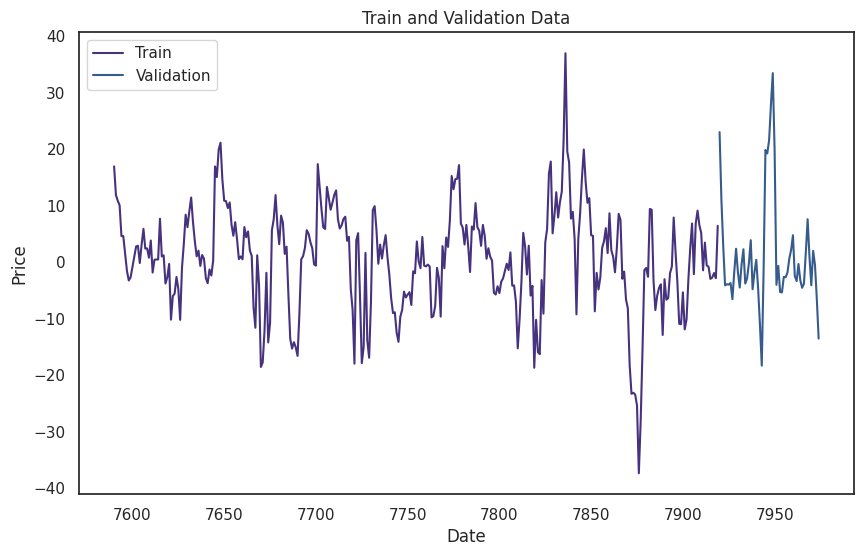

Forecasted Values: [4.51226639 5.36933385 5.6592573  6.64071572 6.76903475 0.44096054
 0.0416904  0.69350594 0.77588127 0.71125504 0.69851582 0.70464483
 0.70637942 0.70583024 0.70561144 0.70565678 0.70568293 0.70567967
 0.70567668 0.70567685 0.70567718 0.70567718 0.70567714 0.70567714
 0.70567715 0.70567715 0.70567715 0.70567715 0.70567715 0.70567715
 0.70567715 0.70567715 0.70567715 0.70567715 0.70567715 0.70567715
 0.70567715 0.70567715 0.70567715 0.70567715 0.70567715 0.70567715
 0.70567715 0.70567715 0.70567715 0.70567715 0.70567715 0.70567715
 0.70567715 0.70567715 0.70567715 0.70567715 0.70567715 0.70567715
 0.70567715]
MAE: 6.850908970592731
RMSE: 9.75896545710794


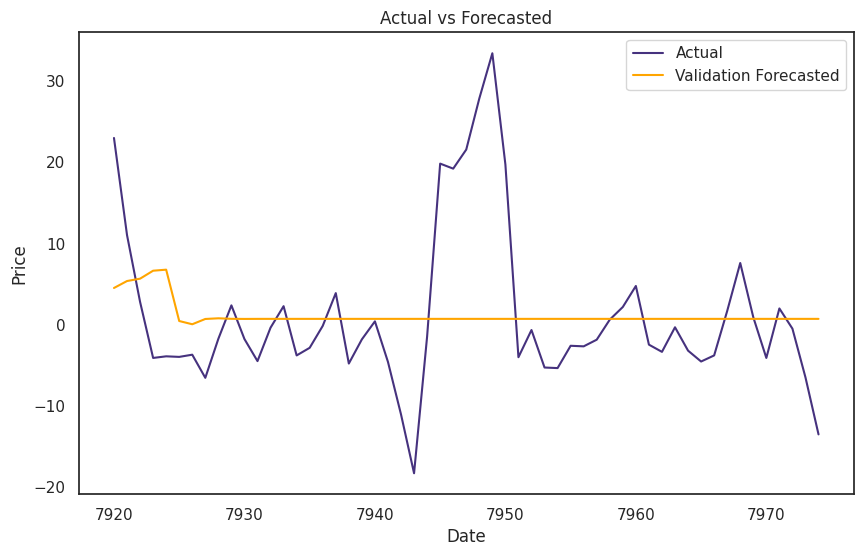

trainset: 131 -- 136
val_set: 137 -- 137


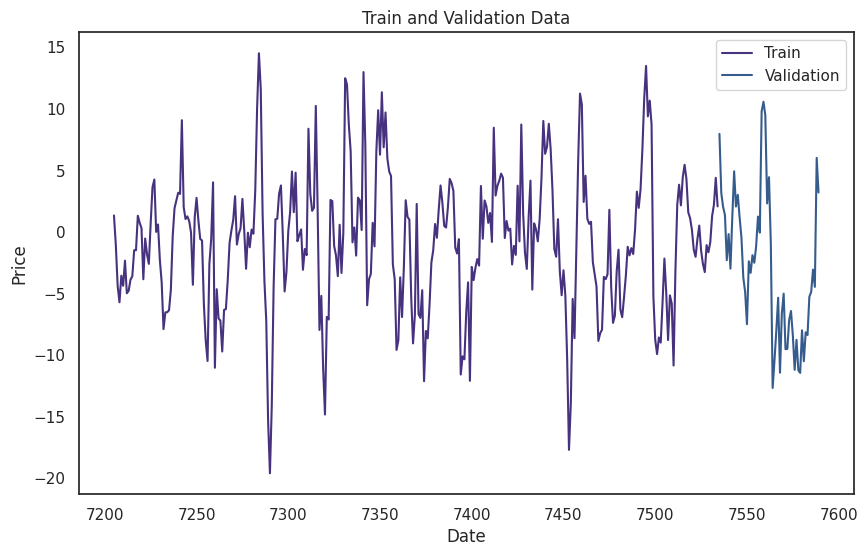

Forecasted Values: [ 1.53981803  0.92203222  0.22825126 -0.30309924 -1.22293223 -0.76061637
 -0.69496867 -0.77553819 -0.77262865 -0.76087836 -0.76319527 -0.76460681
 -0.76403022 -0.76390827 -0.76401515 -0.76401657 -0.76400014 -0.76400255
 -0.76400466 -0.76400396 -0.76400375 -0.76400389 -0.7640039  -0.76400387
 -0.76400388 -0.76400388 -0.76400388 -0.76400388 -0.76400388 -0.76400388
 -0.76400388 -0.76400388 -0.76400388 -0.76400388 -0.76400388 -0.76400388
 -0.76400388 -0.76400388 -0.76400388 -0.76400388 -0.76400388 -0.76400388
 -0.76400388 -0.76400388 -0.76400388 -0.76400388 -0.76400388 -0.76400388
 -0.76400388 -0.76400388 -0.76400388 -0.76400388 -0.76400388 -0.76400388
 -0.76400388]
MAE: 5.325569043281374
RMSE: 6.215227266351934


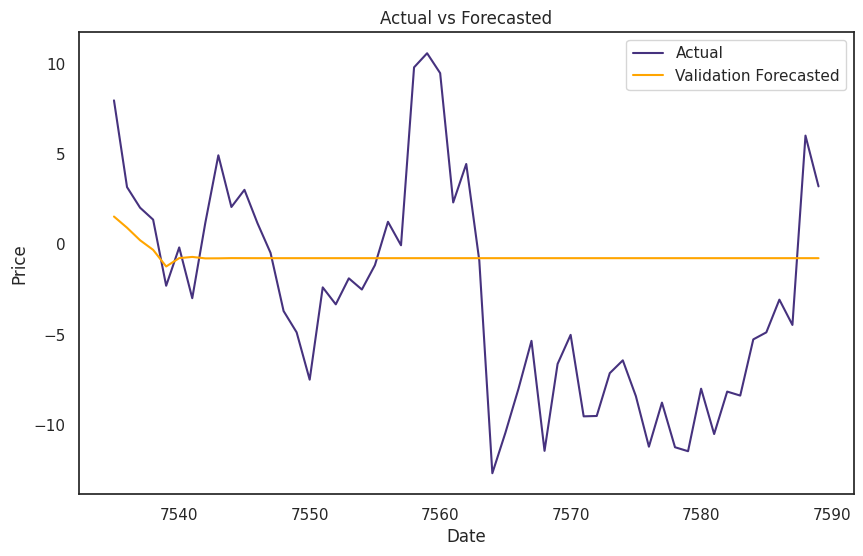

trainset: 124 -- 129
val_set: 130 -- 130


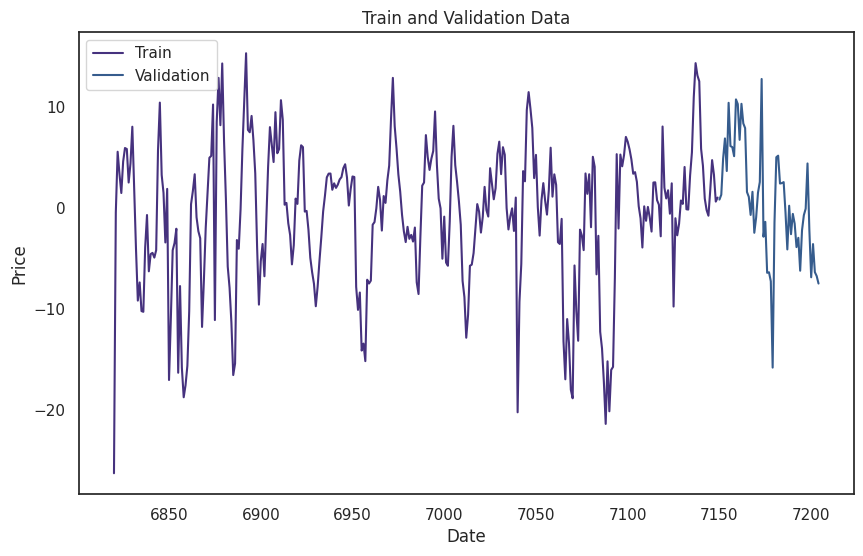

Forecasted Values: [ 0.79581934 -0.93731338 -1.63231028 -1.33503252 -0.48226964 -1.13737907
 -0.99592123 -1.02018012 -1.01640847 -1.01696463 -1.01688521 -1.01689632
 -1.01689479 -1.016895   -1.01689497 -1.01689497 -1.01689497 -1.01689497
 -1.01689497 -1.01689497 -1.01689497 -1.01689497 -1.01689497 -1.01689497
 -1.01689497 -1.01689497 -1.01689497 -1.01689497 -1.01689497 -1.01689497
 -1.01689497 -1.01689497 -1.01689497 -1.01689497 -1.01689497 -1.01689497
 -1.01689497 -1.01689497 -1.01689497 -1.01689497 -1.01689497 -1.01689497
 -1.01689497 -1.01689497 -1.01689497 -1.01689497 -1.01689497 -1.01689497
 -1.01689497 -1.01689497 -1.01689497 -1.01689497 -1.01689497 -1.01689497
 -1.01689497]
MAE: 4.612986920919778
RMSE: 5.908059304510437


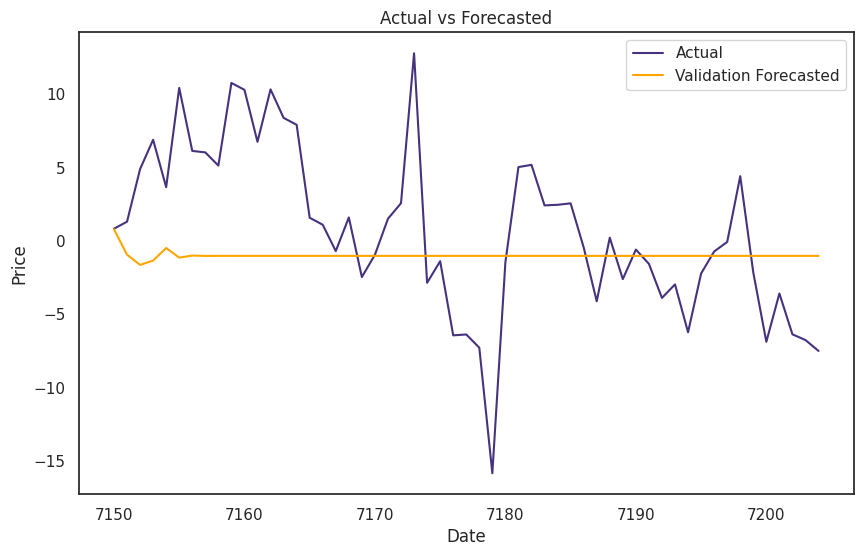

trainset: 117 -- 122
val_set: 123 -- 123


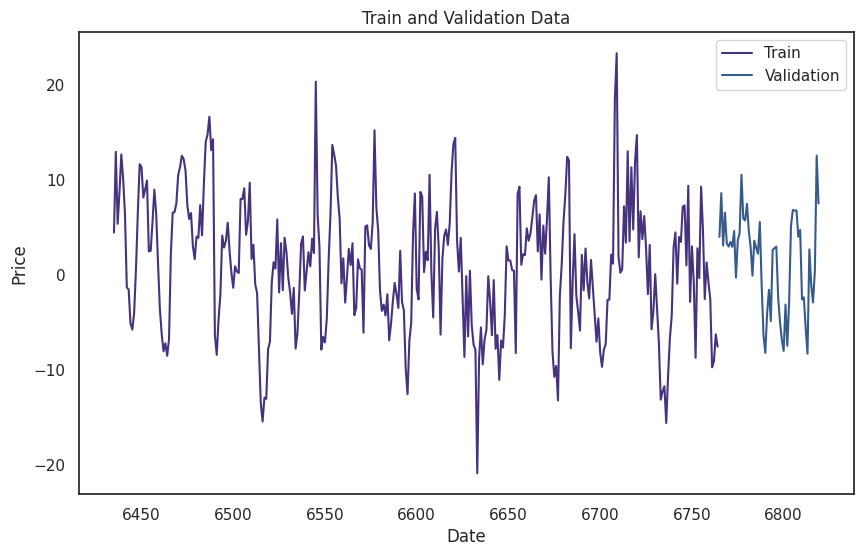

Forecasted Values: [-6.40275483 -4.40554365 -1.69854765 -1.19972914 -0.52788668  0.43064223
  0.20080177  0.24747736  0.23826368  0.24007261  0.23971784  0.2397874
  0.23977376  0.23977644  0.23977591  0.23977602  0.239776    0.239776
  0.239776    0.239776    0.239776    0.239776    0.239776    0.239776
  0.239776    0.239776    0.239776    0.239776    0.239776    0.239776
  0.239776    0.239776    0.239776    0.239776    0.239776    0.239776
  0.239776    0.239776    0.239776    0.239776    0.239776    0.239776
  0.239776    0.239776    0.239776    0.239776    0.239776    0.239776
  0.239776    0.239776    0.239776    0.239776    0.239776    0.239776
  0.239776  ]
MAE: 4.607378447375105
RMSE: 5.547676656029822


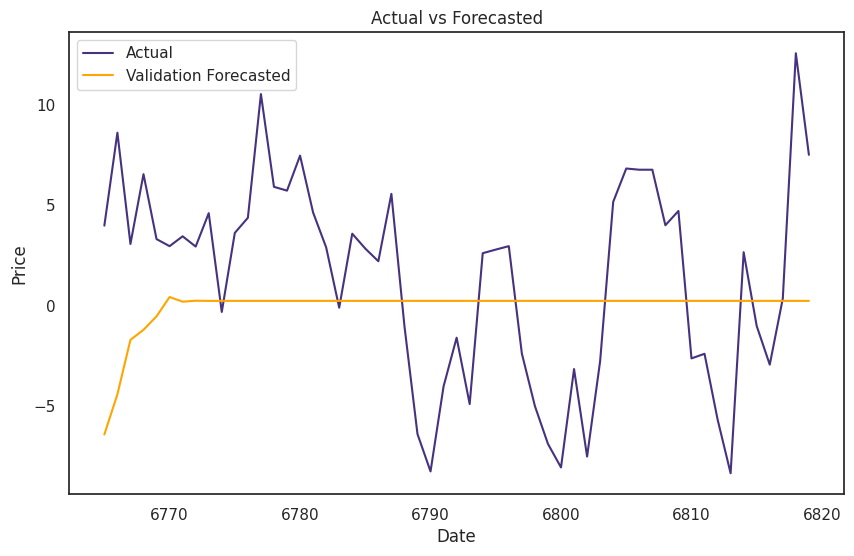

trainset: 110 -- 115
val_set: 116 -- 116


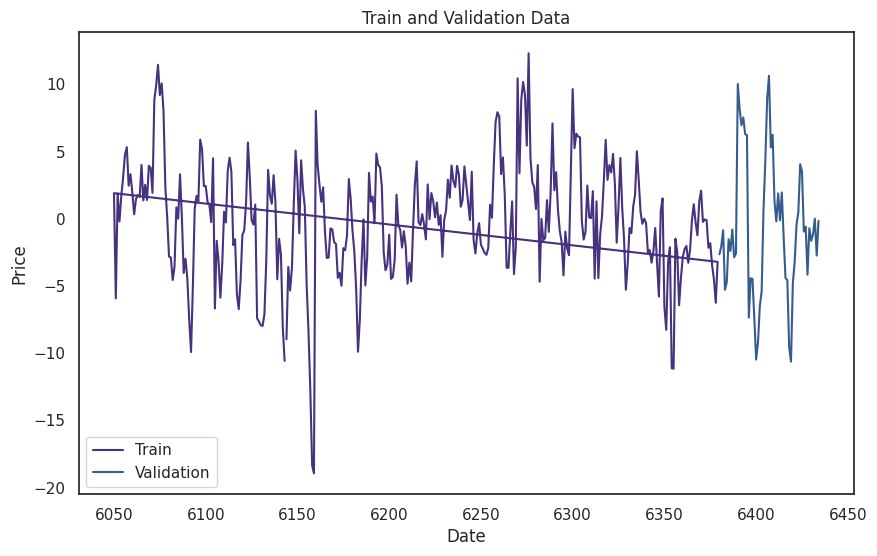

Forecasted Values: [-6.87531583 -5.38898986 -6.09136167 -3.95316691 -1.02207245 -0.73258021
 -1.68705218 -1.60445285 -1.32546318 -1.40108742 -1.4733732  -1.43708563
 -1.42135992 -1.43536097 -1.43768339 -1.43295509 -1.43309078 -1.43452206
 -1.43422277 -1.43383598 -1.43399771 -1.43408769 -1.43402171 -1.43400588
 -1.43402904 -1.43402975 -1.43402249 -1.43402358 -1.43402562 -1.43402492
 -1.43402441 -1.43402472 -1.43402482 -1.43402471 -1.4340247  -1.43402473
 -1.43402473 -1.43402472 -1.43402472 -1.43402472 -1.43402472 -1.43402472
 -1.43402472 -1.43402472 -1.43402472 -1.43402472 -1.43402472 -1.43402472
 -1.43402472 -1.43402472 -1.43402472 -1.43402472 -1.43402472 -1.43402472
 -1.43402472]
MAE: 4.114817459008887
RMSE: 5.272364962600854


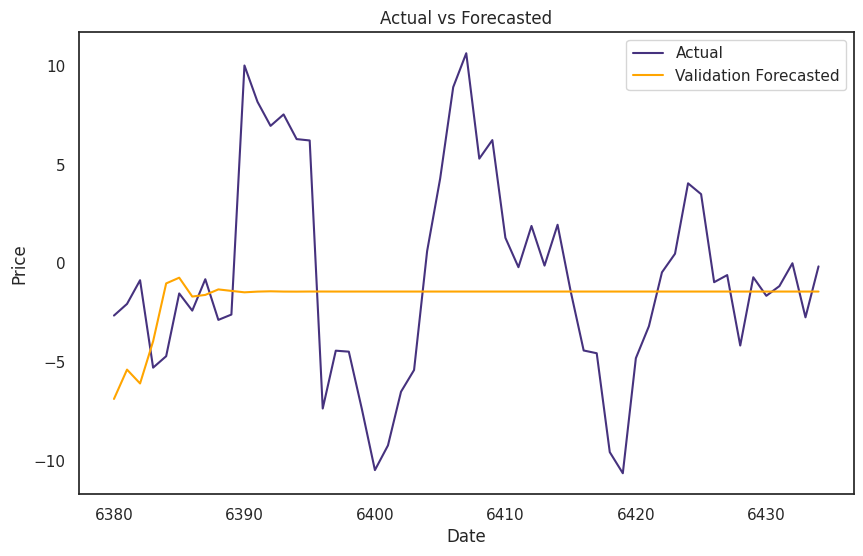

trainset: 103 -- 108
val_set: 109 -- 109


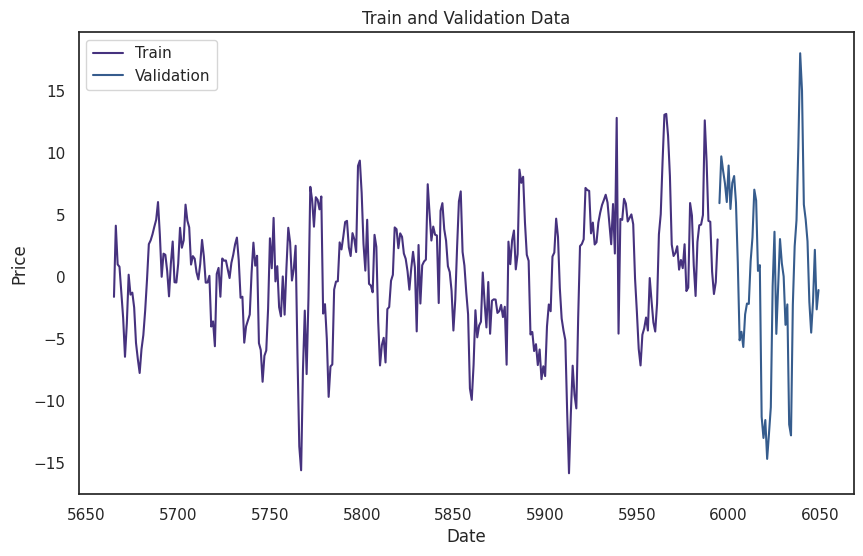

Forecasted Values: [3.89326744 3.09453163 3.04504515 3.3078062  1.97593932 0.444178
 0.38730653 0.76477433 0.87739739 0.80999584 0.76364636 0.76886523
 0.78208983 0.78418895 0.78134781 0.7800722  0.78046836 0.78089792
 0.78090807 0.78080071 0.78077022 0.78078979 0.78080268 0.78080102
 0.78079729 0.78079674 0.78079756 0.78079791 0.78079779 0.78079767
 0.78079767 0.7807977  0.78079771 0.7807977  0.7807977  0.7807977
 0.7807977  0.7807977  0.7807977  0.7807977  0.7807977  0.7807977
 0.7807977  0.7807977  0.7807977  0.7807977  0.7807977  0.7807977
 0.7807977  0.7807977  0.7807977  0.7807977  0.7807977  0.7807977
 0.7807977 ]
MAE: 5.745100618056944
RMSE: 7.055327308174622


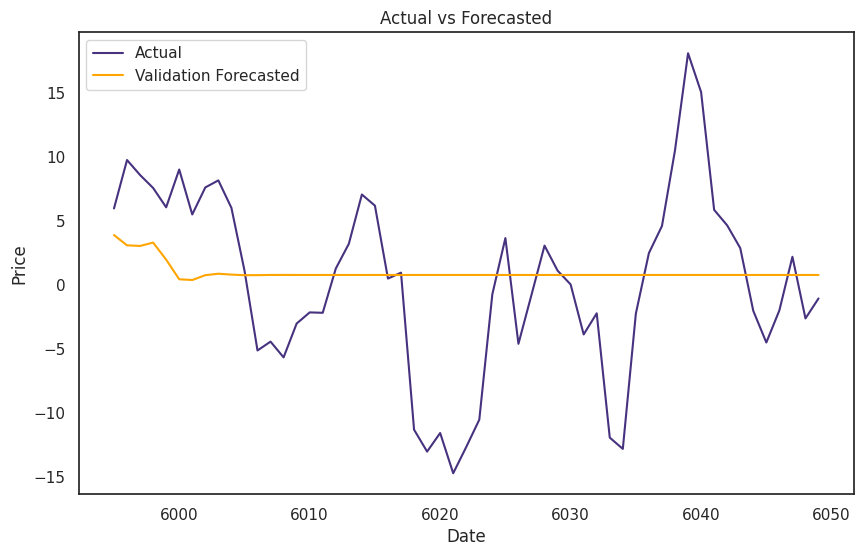

trainset: 96 -- 101
val_set: 102 -- 102


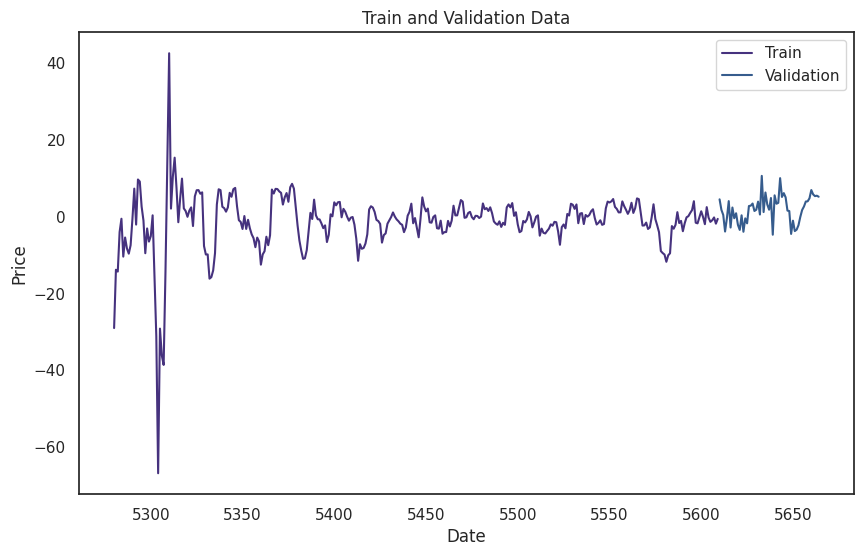

Forecasted Values: [-0.00911798 -0.60806587 -1.19211018 -1.03549473 -0.50246671 -1.79443987
 -1.42027673 -1.61151993 -1.53462263 -1.56851465 -1.55411551 -1.56032206
 -1.55766208 -1.55880467 -1.55831431 -1.55852483 -1.55843446 -1.55847325
 -1.5584566  -1.55846375 -1.55846068 -1.558462   -1.55846143 -1.55846168
 -1.55846157 -1.55846162 -1.5584616  -1.55846161 -1.5584616  -1.5584616
 -1.5584616  -1.5584616  -1.5584616  -1.5584616  -1.5584616  -1.5584616
 -1.5584616  -1.5584616  -1.5584616  -1.5584616  -1.5584616  -1.5584616
 -1.5584616  -1.5584616  -1.5584616  -1.5584616  -1.5584616  -1.5584616
 -1.5584616  -1.5584616  -1.5584616  -1.5584616  -1.5584616  -1.5584616
 -1.5584616 ]
MAE: 4.188089181354766
RMSE: 4.9634351041311024


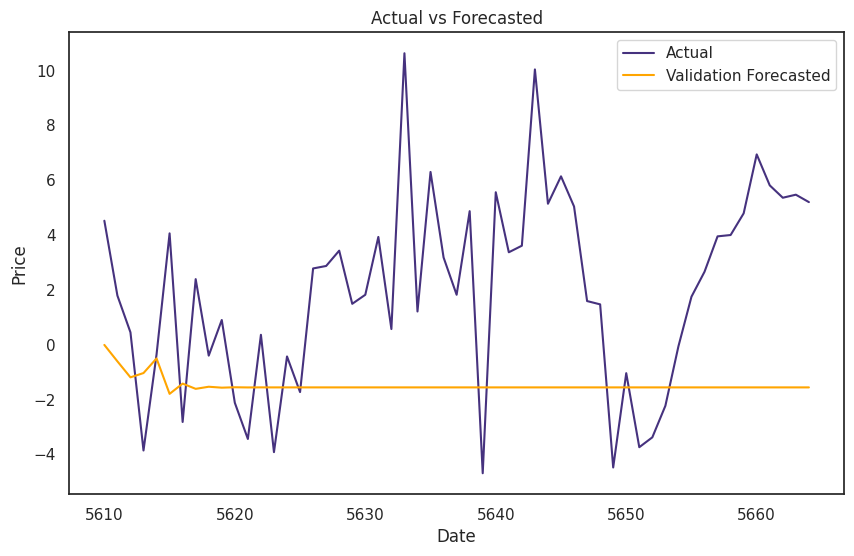

trainset: 89 -- 94
val_set: 95 -- 95


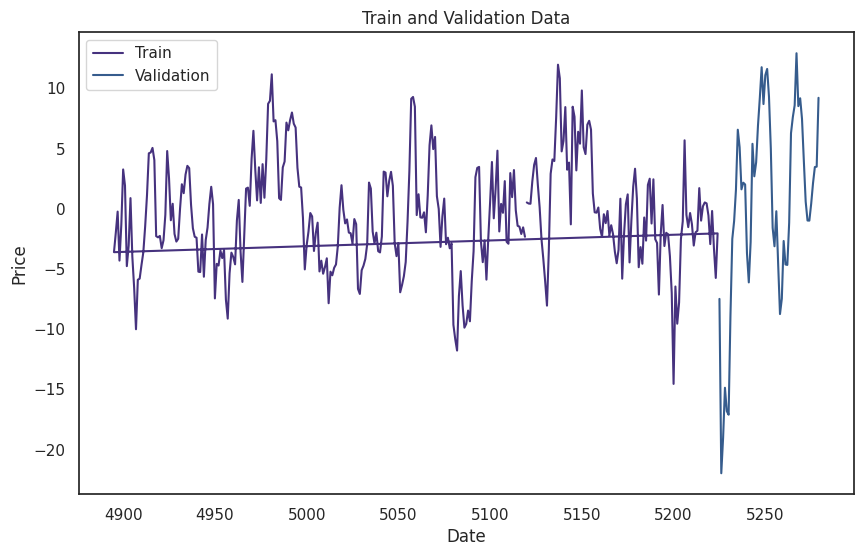

Forecasted Values: [-0.82128652  0.42720689  0.18415172 -0.34732049 -0.61242382 -0.65959431
 -0.64963998 -0.64952283 -0.64974749 -0.64972976 -0.64972652 -0.6497272
 -0.64972721 -0.64972719 -0.64972719 -0.64972719 -0.64972719 -0.64972719
 -0.64972719 -0.64972719 -0.64972719 -0.64972719 -0.64972719 -0.64972719
 -0.64972719 -0.64972719 -0.64972719 -0.64972719 -0.64972719 -0.64972719
 -0.64972719 -0.64972719 -0.64972719 -0.64972719 -0.64972719 -0.64972719
 -0.64972719 -0.64972719 -0.64972719 -0.64972719 -0.64972719 -0.64972719
 -0.64972719 -0.64972719 -0.64972719 -0.64972719 -0.64972719 -0.64972719
 -0.64972719 -0.64972719 -0.64972719 -0.64972719 -0.64972719 -0.64972719
 -0.64972719]
MAE: 6.480914691534533
RMSE: 8.236178722552953


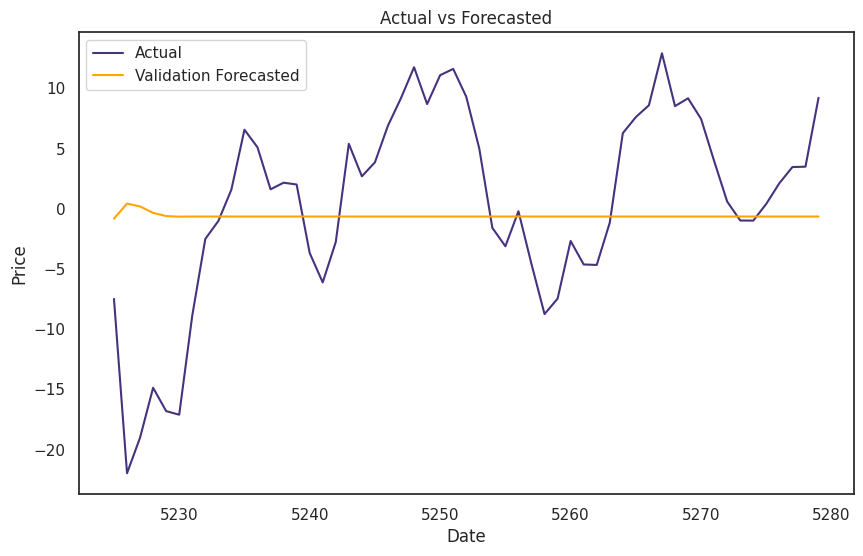

trainset: 82 -- 87
val_set: 88 -- 88


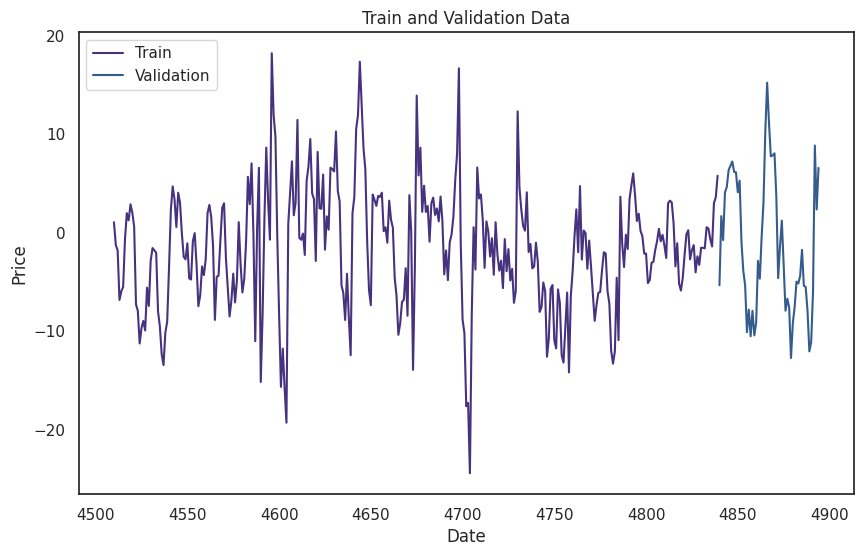

Forecasted Values: [ 3.86446294  3.16924676  2.94304253  0.0954367  -0.76675467 -2.11675072
 -1.62077714 -1.39410746 -1.56354103 -1.58344517 -1.53768602 -1.54244526
 -1.55266796 -1.54934637 -1.54753846 -1.54873426 -1.5489258  -1.54859209
 -1.54861542 -1.54869237 -1.54867043 -1.54865617 -1.54866456 -1.54866629
 -1.54866387 -1.54866395 -1.54866453 -1.54866439 -1.54866428 -1.54866433
 -1.54866435 -1.54866433 -1.54866433 -1.54866434 -1.54866433 -1.54866433
 -1.54866433 -1.54866433 -1.54866433 -1.54866433 -1.54866433 -1.54866433
 -1.54866433 -1.54866433 -1.54866433 -1.54866433 -1.54866433 -1.54866433
 -1.54866433 -1.54866433 -1.54866433 -1.54866433 -1.54866433 -1.54866433
 -1.54866433]
MAE: 6.101935532162649
RMSE: 7.033652568337632


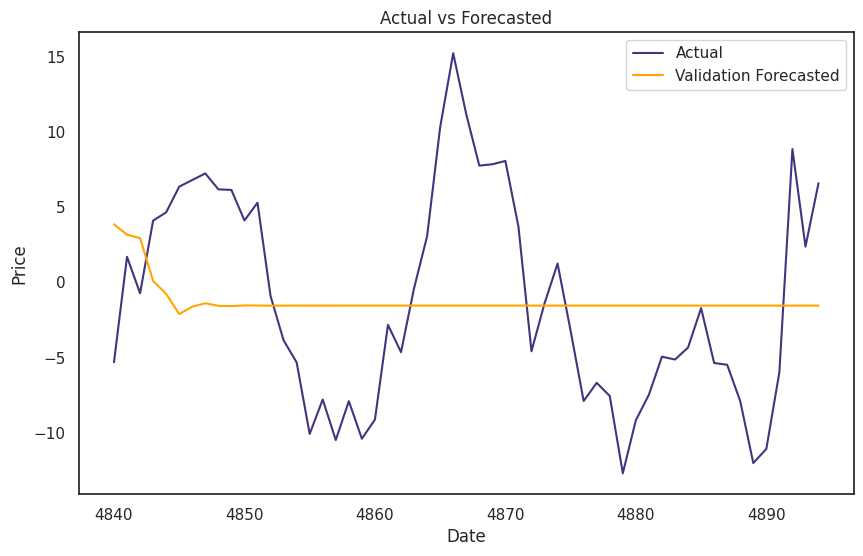

trainset: 75 -- 80
val_set: 81 -- 81


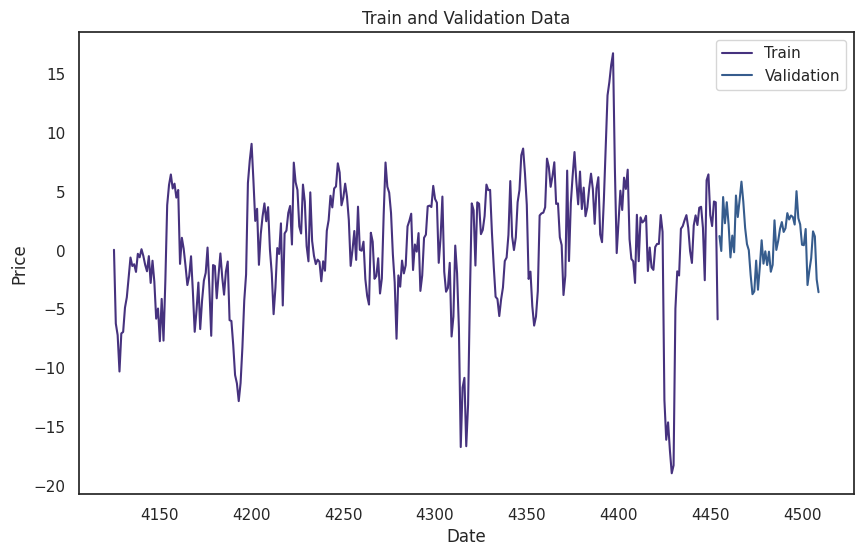

Forecasted Values: [-5.75545952 -2.74110138 -1.18568587 -1.86466095 -1.22820162  1.15359442
  0.94202856  0.54562977  0.59882856  0.66402129  0.65213828  0.64155229
  0.64403433  0.64572935  0.64523328  0.64496615  0.64506219  0.64510352
  0.64508537  0.64507912  0.64508248  0.6450834   0.64508279  0.64508266
  0.64508277  0.64508279  0.64508277  0.64508276  0.64508277  0.64508277
  0.64508277  0.64508277  0.64508277  0.64508277  0.64508277  0.64508277
  0.64508277  0.64508277  0.64508277  0.64508277  0.64508277  0.64508277
  0.64508277  0.64508277  0.64508277  0.64508277  0.64508277  0.64508277
  0.64508277  0.64508277  0.64508277  0.64508277  0.64508277  0.64508277
  0.64508277]
MAE: 2.120530628141053
RMSE: 2.7283278101780217


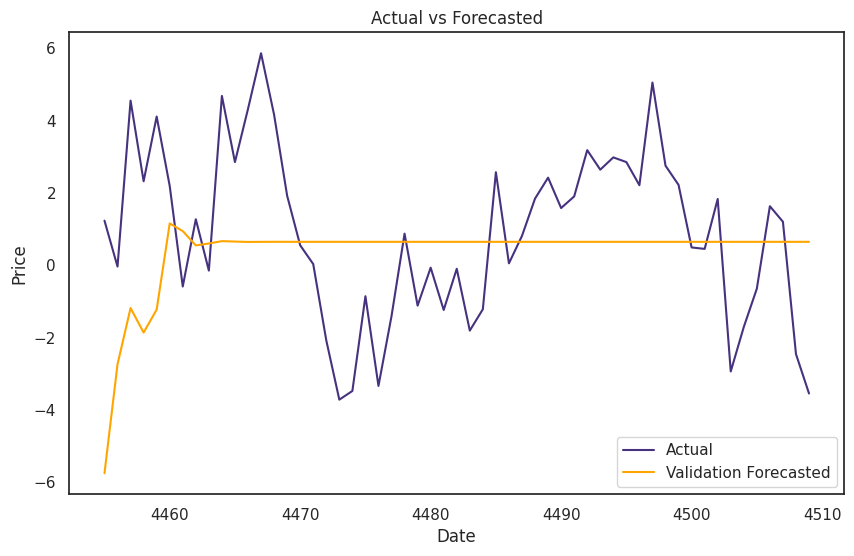

trainset: 68 -- 73
val_set: 74 -- 74


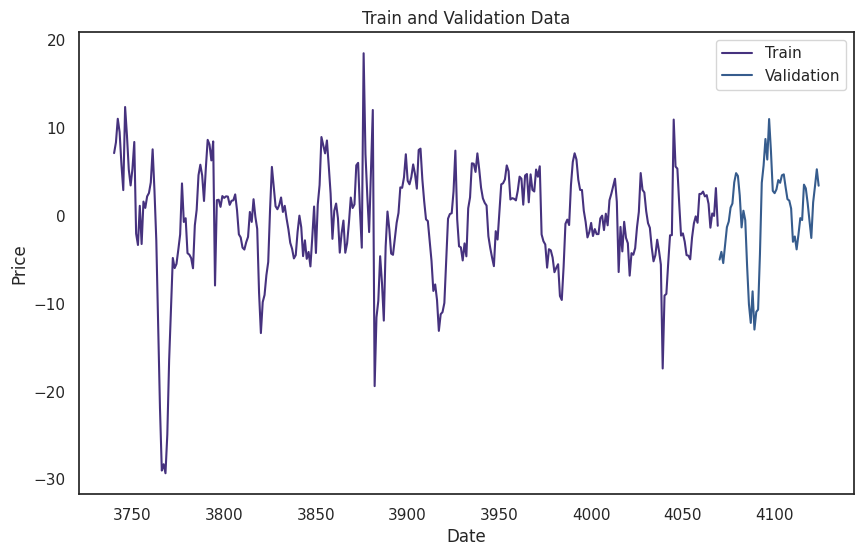

Forecasted Values: [ 0.1178872   0.73067142  0.00997836 -0.3529155  -2.16157104 -0.50726181
 -0.49285072 -0.54406341 -0.54323137 -0.54167779 -0.54174205 -0.54178821
 -0.54178508 -0.54178374 -0.54178387 -0.54178391 -0.5417839  -0.5417839
 -0.5417839  -0.5417839  -0.5417839  -0.5417839  -0.5417839  -0.5417839
 -0.5417839  -0.5417839  -0.5417839  -0.5417839  -0.5417839  -0.5417839
 -0.5417839  -0.5417839  -0.5417839  -0.5417839  -0.5417839  -0.5417839
 -0.5417839  -0.5417839  -0.5417839  -0.5417839  -0.5417839  -0.5417839
 -0.5417839  -0.5417839  -0.5417839  -0.5417839  -0.5417839  -0.5417839
 -0.5417839  -0.5417839  -0.5417839  -0.5417839  -0.5417839  -0.5417839
 -0.5417839 ]
MAE: 4.245949544323303
RMSE: 5.3086430315138005


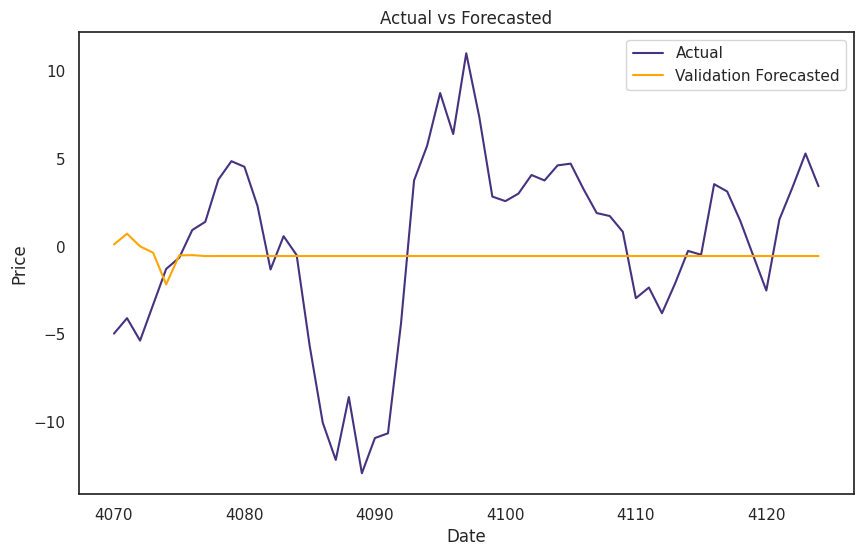

trainset: 61 -- 66
val_set: 67 -- 67


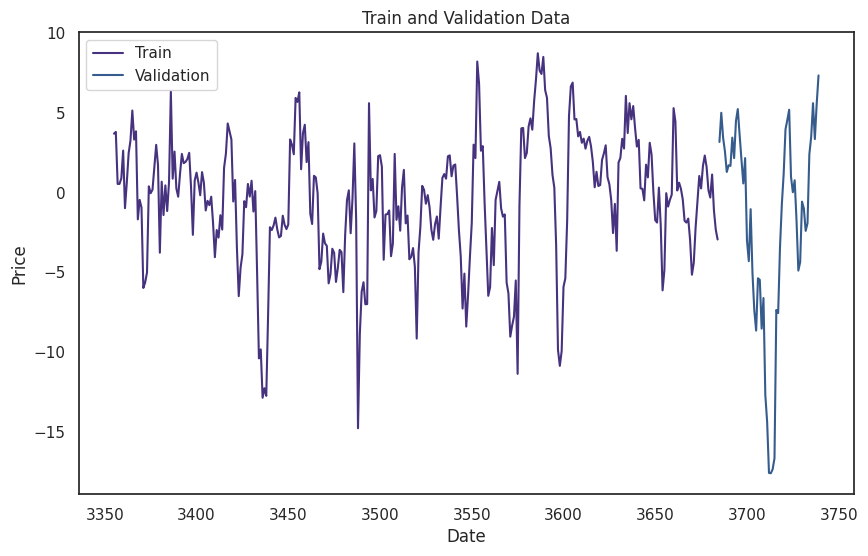

Forecasted Values: [-2.32514976 -2.44213563 -2.73544065 -1.51087968 -0.90045916 -0.48293122
 -0.46622016 -0.44096422 -0.44121763 -0.43962491 -0.43972266 -0.43961801
 -0.43962951 -0.43962237 -0.43962346 -0.43962295 -0.43962305 -0.43962301
 -0.43962302 -0.43962302 -0.43962302 -0.43962302 -0.43962302 -0.43962302
 -0.43962302 -0.43962302 -0.43962302 -0.43962302 -0.43962302 -0.43962302
 -0.43962302 -0.43962302 -0.43962302 -0.43962302 -0.43962302 -0.43962302
 -0.43962302 -0.43962302 -0.43962302 -0.43962302 -0.43962302 -0.43962302
 -0.43962302 -0.43962302 -0.43962302 -0.43962302 -0.43962302 -0.43962302
 -0.43962302 -0.43962302 -0.43962302 -0.43962302 -0.43962302 -0.43962302
 -0.43962302]
MAE: 5.019522926270555
RMSE: 6.6864919834263645


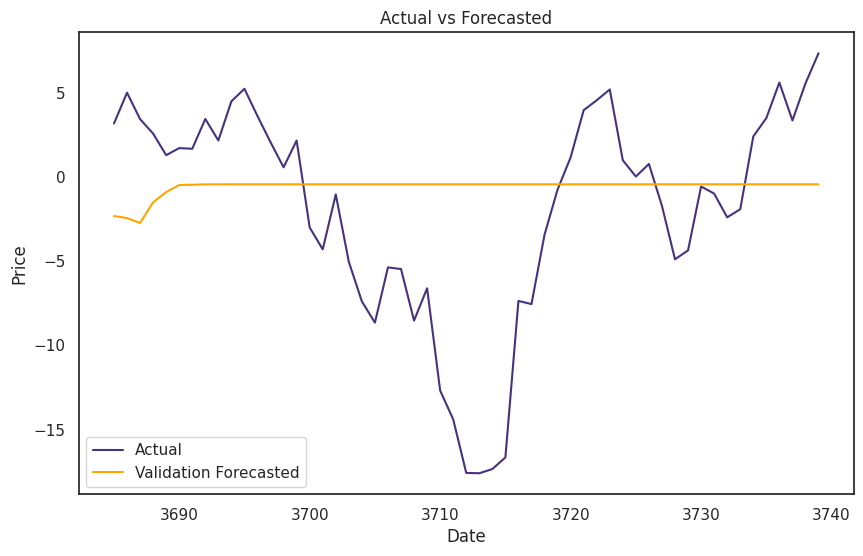

trainset: 54 -- 59
val_set: 60 -- 60


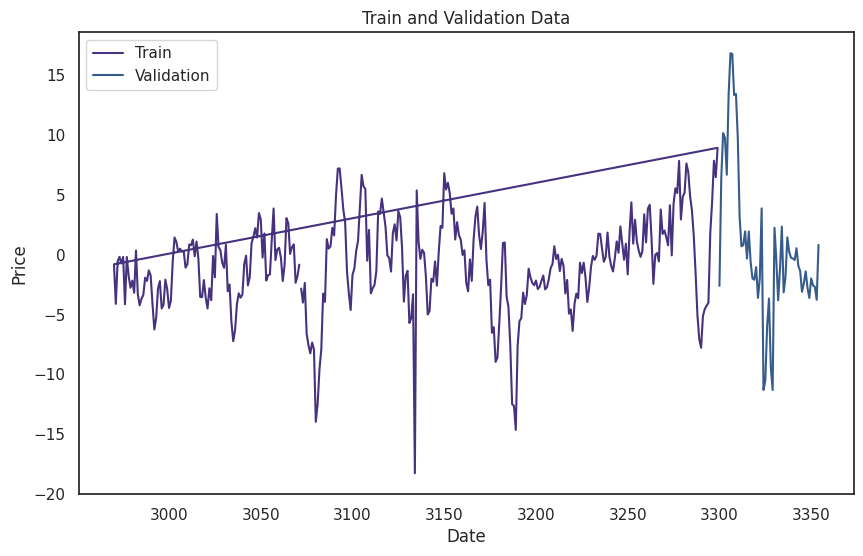

Forecasted Values: [-0.75147224 -0.44965162 -0.54934043 -0.27585506 -0.5010446  -0.80124536
 -0.81971324 -0.8310867  -0.83214162 -0.83258484 -0.83263793 -0.83265562
 -0.83265814 -0.83265885 -0.83265897 -0.832659   -0.832659   -0.83265901
 -0.83265901 -0.83265901 -0.83265901 -0.83265901 -0.83265901 -0.83265901
 -0.83265901 -0.83265901 -0.83265901 -0.83265901 -0.83265901 -0.83265901
 -0.83265901 -0.83265901 -0.83265901 -0.83265901 -0.83265901 -0.83265901
 -0.83265901 -0.83265901 -0.83265901 -0.83265901 -0.83265901 -0.83265901
 -0.83265901 -0.83265901 -0.83265901 -0.83265901 -0.83265901 -0.83265901
 -0.83265901 -0.83265901 -0.83265901 -0.83265901 -0.83265901 -0.83265901
 -0.83265901]
MAE: 4.31061685635701
RMSE: 6.3660663500894605


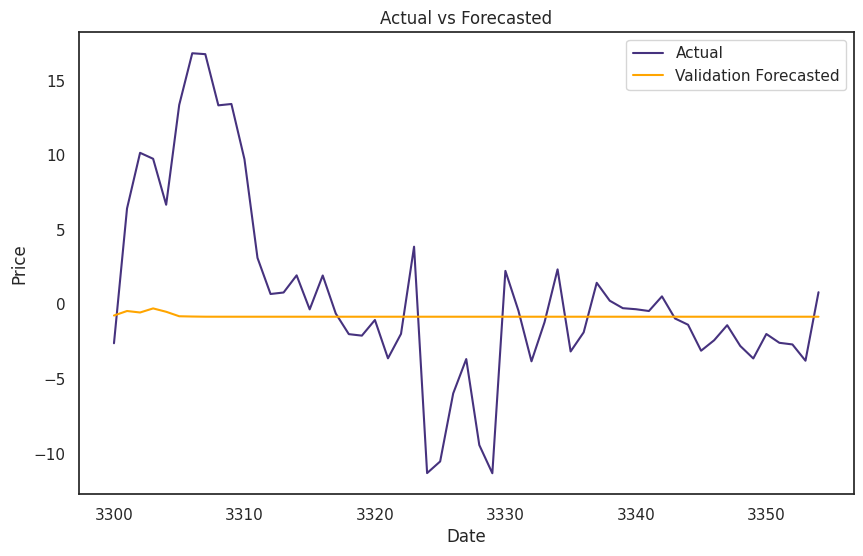

trainset: 47 -- 52
val_set: 53 -- 53


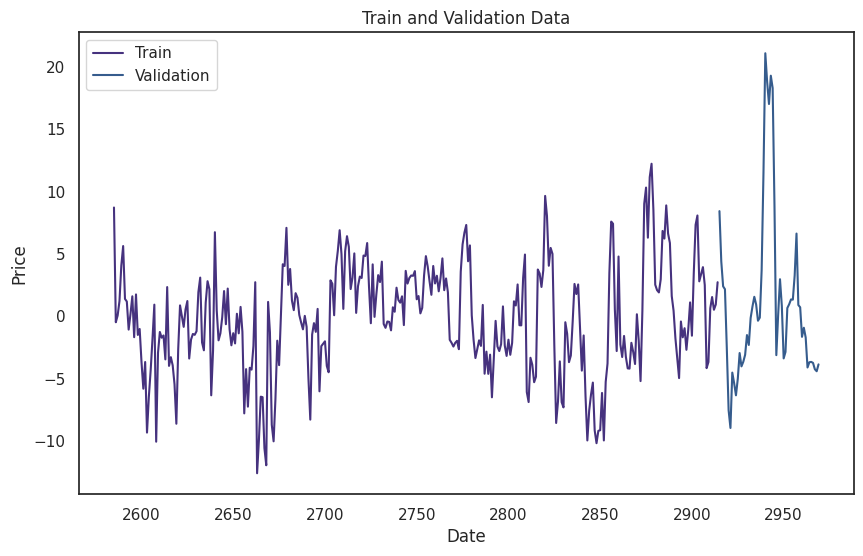

Forecasted Values: [ 2.27205413  0.859855    0.1997127   0.45511405 -0.26780806 -0.18153983
 -0.1197069  -0.14162787 -0.14398456 -0.14110705 -0.14142894 -0.14167939
 -0.14159362 -0.14158347 -0.14159491 -0.14159372 -0.14159271 -0.14159304
 -0.14159308 -0.14159304 -0.14159304 -0.14159305 -0.14159305 -0.14159305
 -0.14159305 -0.14159305 -0.14159305 -0.14159305 -0.14159305 -0.14159305
 -0.14159305 -0.14159305 -0.14159305 -0.14159305 -0.14159305 -0.14159305
 -0.14159305 -0.14159305 -0.14159305 -0.14159305 -0.14159305 -0.14159305
 -0.14159305 -0.14159305 -0.14159305 -0.14159305 -0.14159305 -0.14159305
 -0.14159305 -0.14159305 -0.14159305 -0.14159305 -0.14159305 -0.14159305
 -0.14159305]
MAE: 4.711607690833327
RMSE: 6.905715395447223


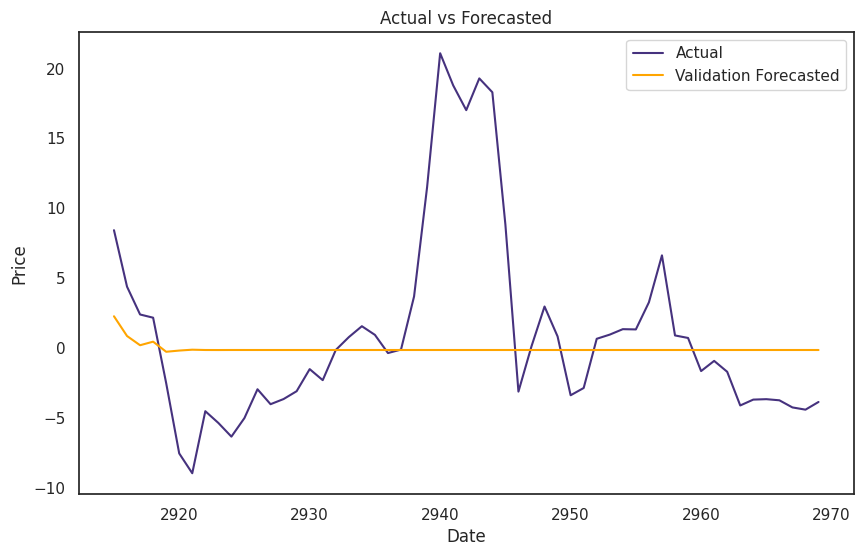

trainset: 40 -- 45
val_set: 46 -- 46


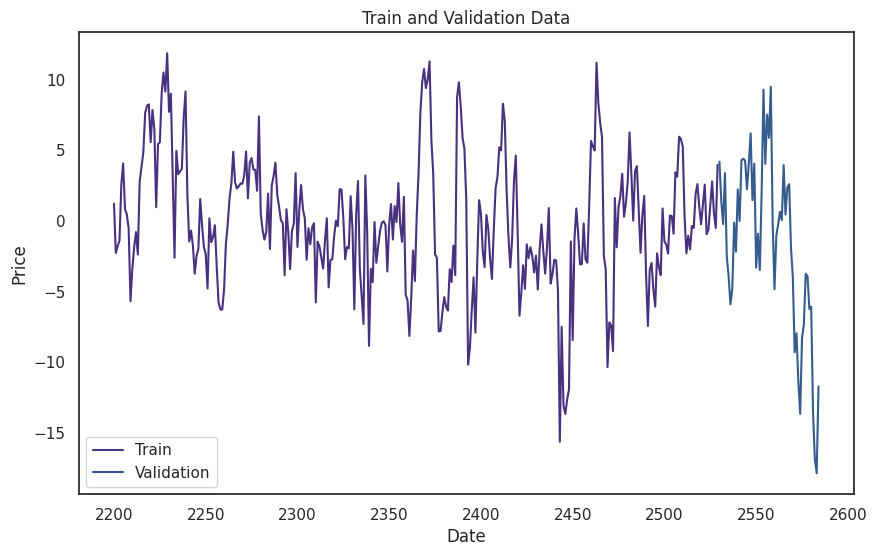

Forecasted Values: [ 2.92061319  1.6197093   0.83258044  0.88118772  0.87565398 -0.67729369
 -0.44677052 -0.27106475 -0.32820764 -0.34349181 -0.33350995 -0.33292187
 -0.33435751 -0.33422454 -0.33405025 -0.334094   -0.33411108 -0.33410264
 -0.33410158 -0.33410288 -0.33410283 -0.33410266 -0.33410269 -0.33410271
 -0.3341027  -0.3341027  -0.3341027  -0.3341027  -0.3341027  -0.3341027
 -0.3341027  -0.3341027  -0.3341027  -0.3341027  -0.3341027  -0.3341027
 -0.3341027  -0.3341027  -0.3341027  -0.3341027  -0.3341027  -0.3341027
 -0.3341027  -0.3341027  -0.3341027  -0.3341027  -0.3341027  -0.3341027
 -0.3341027  -0.3341027  -0.3341027  -0.3341027  -0.3341027  -0.3341027
 -0.3341027 ]
MAE: 4.897735302631833
RMSE: 6.2988675253033195


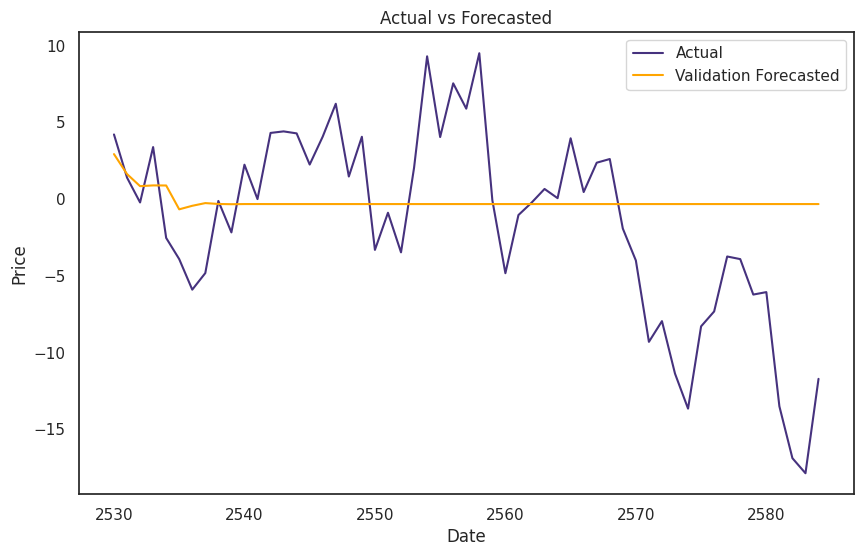

trainset: 32 -- 38
val_set: 39 -- 39


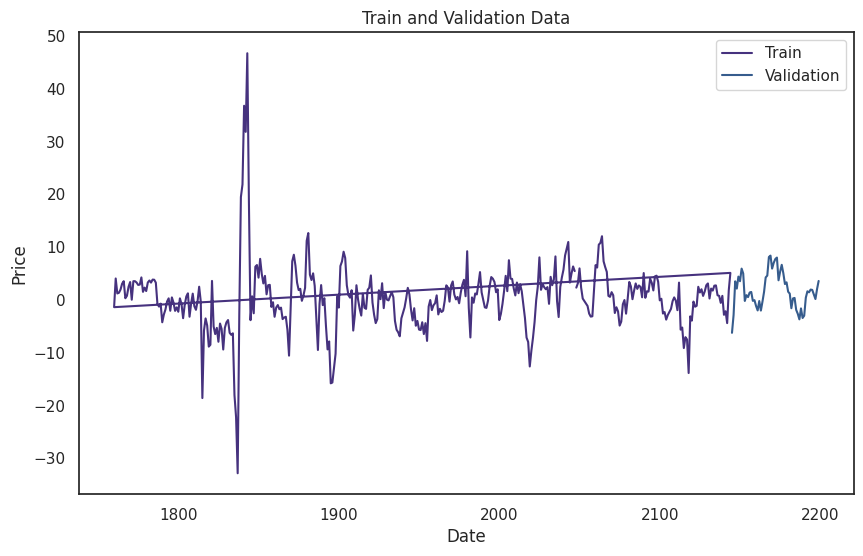

Forecasted Values: [ 5.99158989  5.26728794  5.91416722  3.19574622  1.51479017 -0.06219012
  0.26887279  0.45523951  0.39855955  0.37773928  0.38668256  0.38882938
  0.38749636  0.38730319  0.38749318  0.38750575  0.3874797   0.38747982
  0.38748327  0.38748301  0.38748257  0.38748264  0.38748269  0.38748268
  0.38748267  0.38748268  0.38748268  0.38748268  0.38748268  0.38748268
  0.38748268  0.38748268  0.38748268  0.38748268  0.38748268  0.38748268
  0.38748268  0.38748268  0.38748268  0.38748268  0.38748268  0.38748268
  0.38748268  0.38748268  0.38748268  0.38748268  0.38748268  0.38748268
  0.38748268  0.38748268  0.38748268  0.38748268  0.38748268  0.38748268
  0.38748268]
MAE: 2.906760784562536
RMSE: 3.9548256914741855


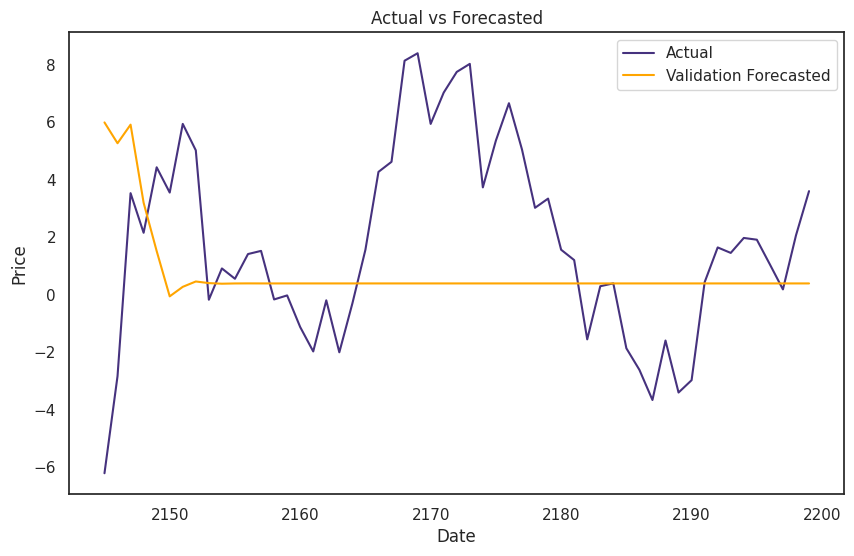

trainset: 24 -- 30
val_set: 31 -- 31


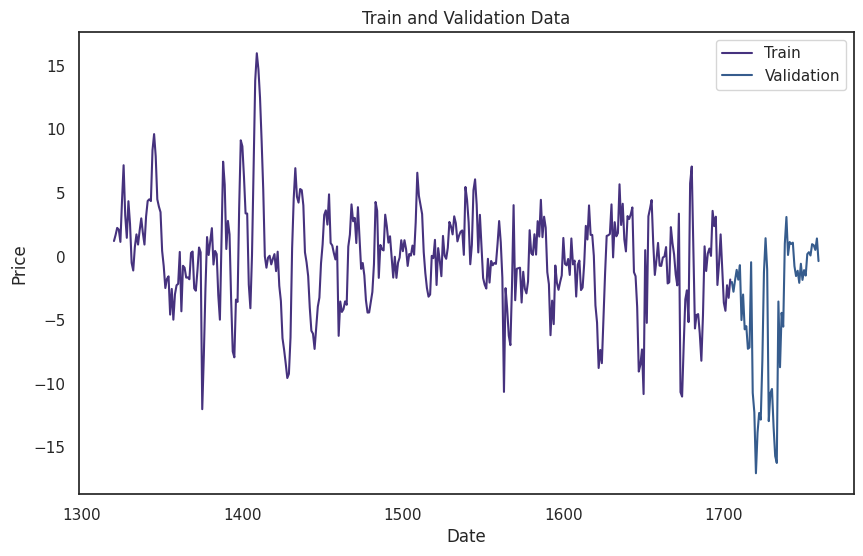

Forecasted Values: [-1.42115465 -0.32962133  0.22632278  0.71285542  0.82071672 -0.44448921
 -0.47187431 -0.30389319 -0.29851981 -0.32080472 -0.32174903 -0.31879502
 -0.31863899 -0.31903024 -0.31905503 -0.31900325 -0.31899942 -0.31900627
 -0.31900685 -0.31900594 -0.31900586 -0.31900598 -0.31900599 -0.31900597
 -0.31900597 -0.31900597 -0.31900597 -0.31900597 -0.31900597 -0.31900597
 -0.31900597 -0.31900597 -0.31900597 -0.31900597 -0.31900597 -0.31900597
 -0.31900597 -0.31900597 -0.31900597 -0.31900597 -0.31900597 -0.31900597
 -0.31900597 -0.31900597 -0.31900597 -0.31900597 -0.31900597 -0.31900597
 -0.31900597 -0.31900597 -0.31900597 -0.31900597 -0.31900597 -0.31900597
 -0.31900597]
MAE: 4.582034528151695
RMSE: 6.706418518528313


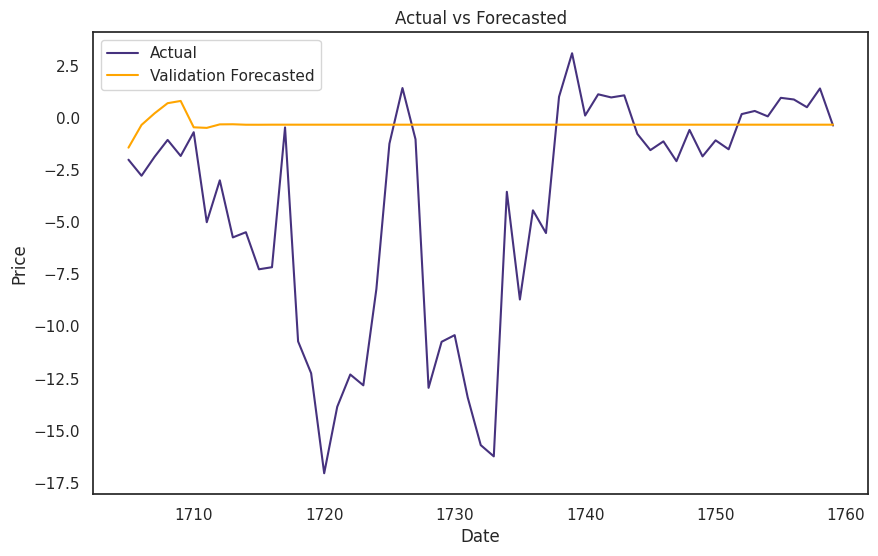

trainset: 16 -- 22
val_set: 23 -- 23


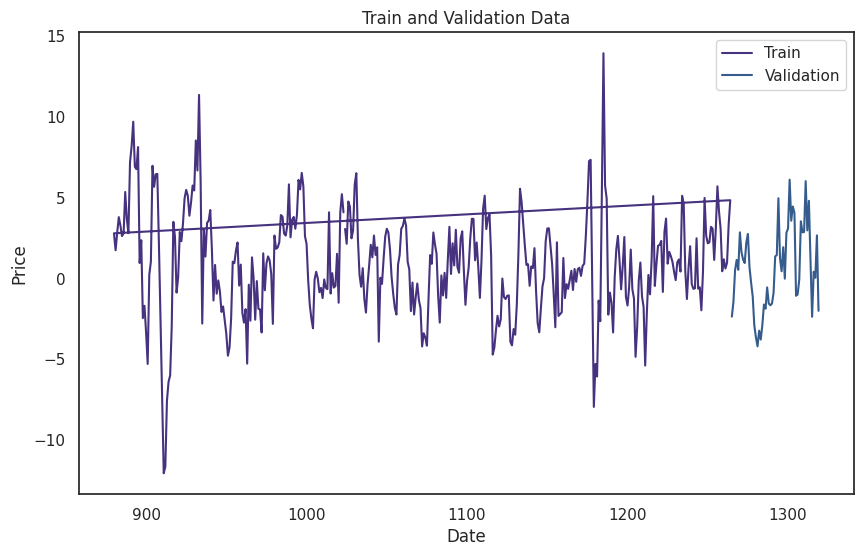

Forecasted Values: [3.80036202 2.67580604 2.88161036 1.27722801 0.49114476 0.90942556
 0.97778447 0.90781781 0.90575199 0.91637369 0.91545382 0.91398376
 0.91429001 0.91447281 0.91440625 0.91438681 0.91439893 0.91440042
 0.91439844 0.91439845 0.91439874 0.91439871 0.91439867 0.91439868
 0.91439868 0.91439868 0.91439868 0.91439868 0.91439868 0.91439868
 0.91439868 0.91439868 0.91439868 0.91439868 0.91439868 0.91439868
 0.91439868 0.91439868 0.91439868 0.91439868 0.91439868 0.91439868
 0.91439868 0.91439868 0.91439868 0.91439868 0.91439868 0.91439868
 0.91439868 0.91439868 0.91439868 0.91439868 0.91439868 0.91439868
 0.91439868]
MAE: 2.1708280040603833
RMSE: 2.7142083179488585


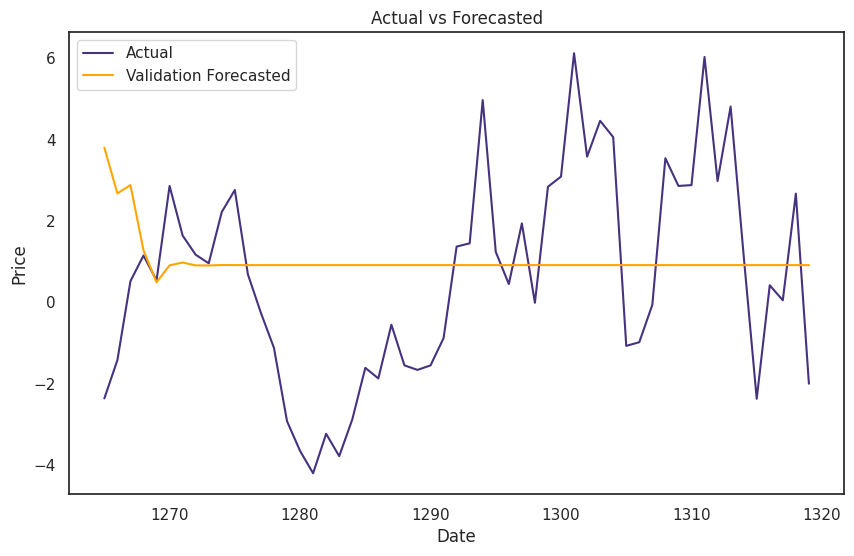

trainset: 8 -- 14
val_set: 15 -- 15


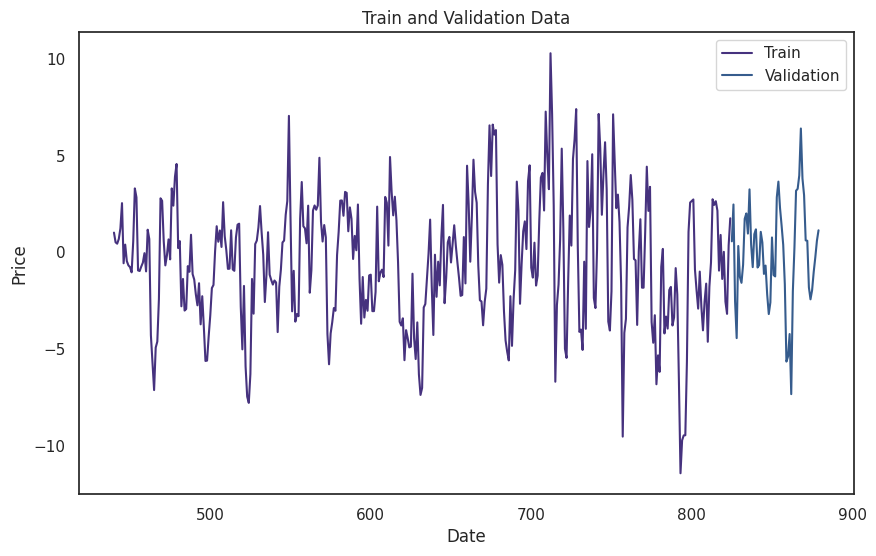

Forecasted Values: [ 1.75435973  0.57838308  1.11990291  1.27399037 -0.22663521 -0.97226287
 -0.42797295 -0.39595738 -0.53123089 -0.50343884 -0.47913675 -0.49195205
 -0.4942791  -0.49068403 -0.49107839 -0.49181398 -0.49153029 -0.49143269
 -0.49152428 -0.49152317 -0.4915021  -0.49150785 -0.49151127 -0.49150903
 -0.49150882 -0.4915094  -0.4915093  -0.49150919 -0.49150924 -0.49150925
 -0.49150924 -0.49150924 -0.49150924 -0.49150924 -0.49150924 -0.49150924
 -0.49150924 -0.49150924 -0.49150924 -0.49150924 -0.49150924 -0.49150924
 -0.49150924 -0.49150924 -0.49150924 -0.49150924 -0.49150924 -0.49150924
 -0.49150924 -0.49150924 -0.49150924 -0.49150924 -0.49150924 -0.49150924
 -0.49150924]
MAE: 2.085650973902877
RMSE: 2.700638242395772


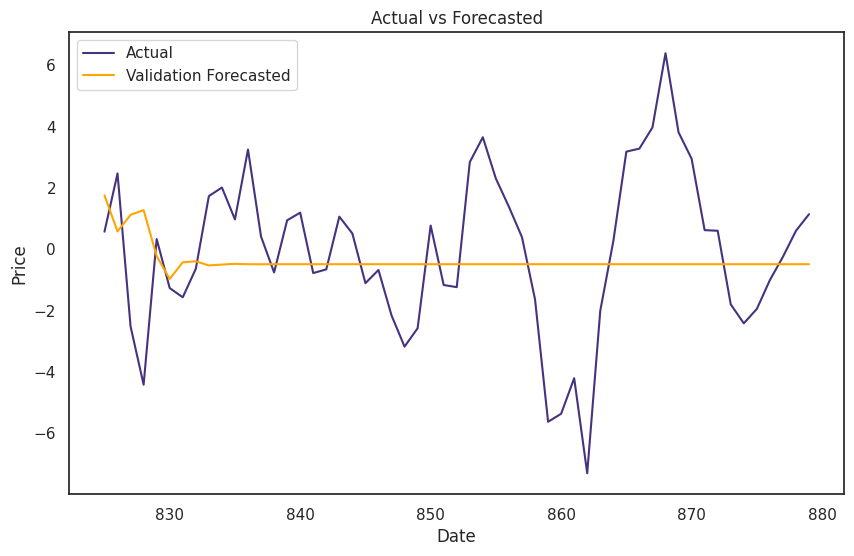

trainset: 0 -- 6
val_set: 7 -- 7


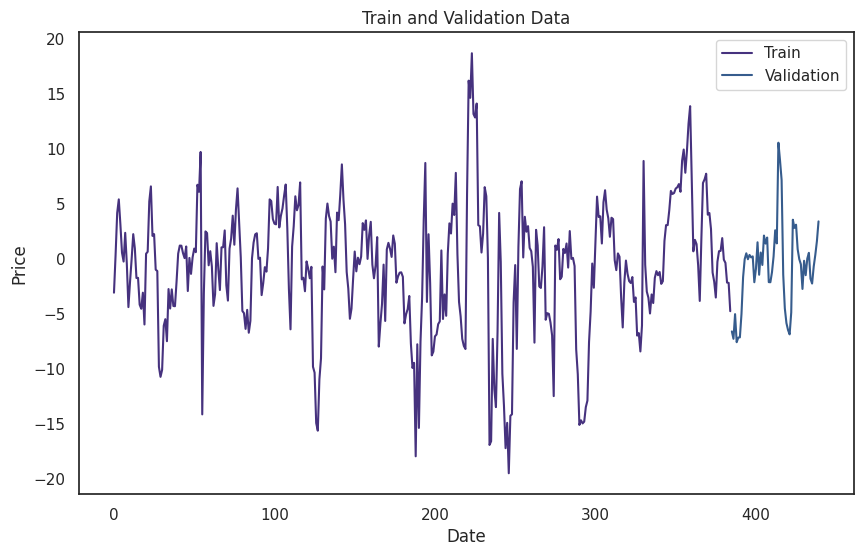

Forecasted Values: [-4.35315933 -3.27065204 -2.6761859  -2.06260744 -2.08275732 -0.80805544
 -0.92022649 -0.82792021 -0.84321272 -0.83590487 -0.83753081 -0.83691614
 -0.8370749  -0.83702128 -0.83703623 -0.83703145 -0.83703284 -0.83703241
 -0.83703254 -0.8370325  -0.83703251 -0.8370325  -0.83703251 -0.83703251
 -0.83703251 -0.83703251 -0.83703251 -0.83703251 -0.83703251 -0.83703251
 -0.83703251 -0.83703251 -0.83703251 -0.83703251 -0.83703251 -0.83703251
 -0.83703251 -0.83703251 -0.83703251 -0.83703251 -0.83703251 -0.83703251
 -0.83703251 -0.83703251 -0.83703251 -0.83703251 -0.83703251 -0.83703251
 -0.83703251 -0.83703251 -0.83703251 -0.83703251 -0.83703251 -0.83703251
 -0.83703251]
MAE: 2.9014711040682553
RMSE: 3.5689822961826807


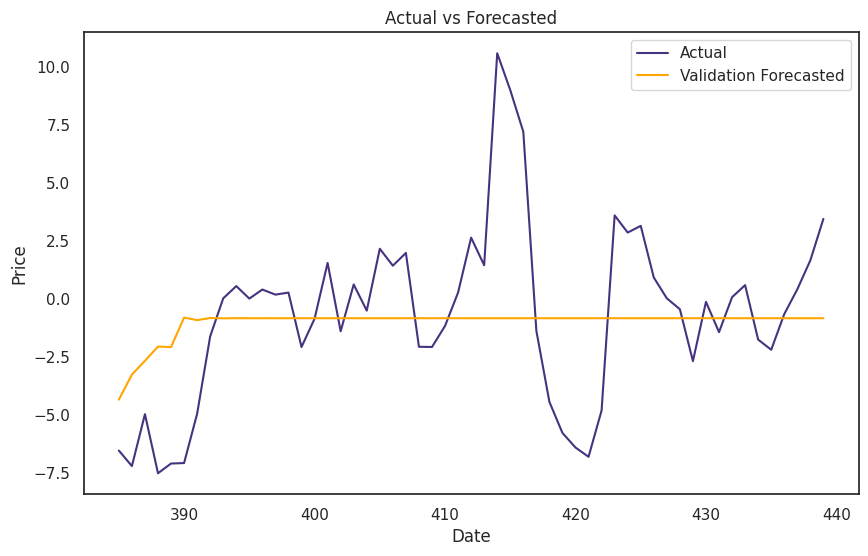

CV Val MAE: 4.522786727523375
Training Time: 1.9820563793182373
MAE on Test Set: 5.986228118398481


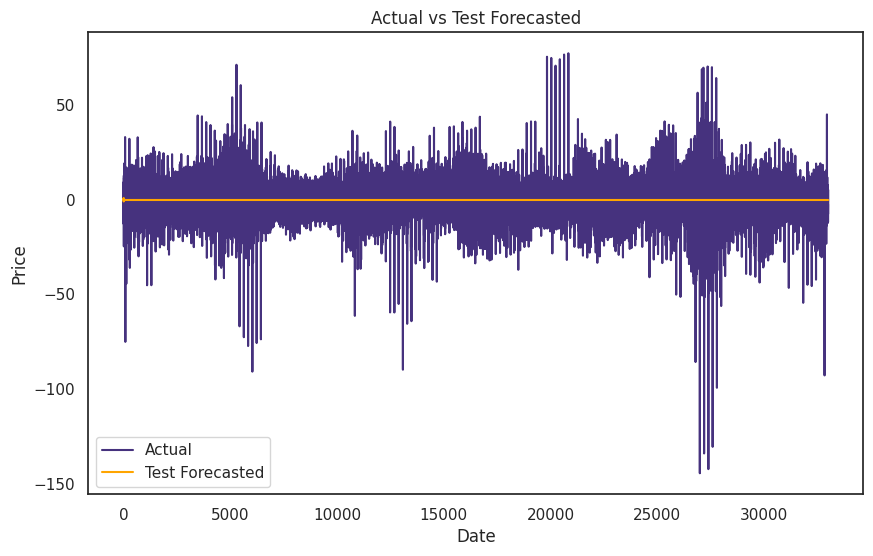

Testing Time: 1.6482629776000977
ARIMA RMSE: 8.033075148971701


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
import time

def train_evaluate_testARIMA(trainA, test, revealed_target):
    start_train_time = time.time()

    trainA = trainA[trainA['stock_id'] == 0]
    date_ids_trainA = trainA[['date_id', 'target']].reset_index(drop=True)

    cross_validation_results = {'Fold': [], 'MAE_val': []}
    cv = TimeSeriesCV(date_ids_trainA, holdout_size=7)
    fold = 1
    for train_ind, val_ind in cv:
        target_trn_cv, target_validation_cv = date_ids_trainA.iloc[train_ind], date_ids_trainA.iloc[val_ind]

        print("trainset: {} -- {}".format(target_trn_cv.date_id.min(), target_trn_cv.date_id.max()))
        print("val_set: {} -- {}".format(target_validation_cv.date_id.min(), target_validation_cv.date_id.max()))

        plt.figure(figsize=(10, 6))
        plt.plot(target_trn_cv.index, target_trn_cv['target'], label='Train')
        plt.plot(target_validation_cv.index, target_validation_cv['target'], label='Validation')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.title('Train and Validation Data')
        plt.legend()
        plt.show()

        target_trn_cv = target_trn_cv.drop(['date_id'], axis=1)
        target_validation_cv = target_validation_cv.drop(['date_id'], axis=1)
        start_train_time = time.time()
        # Fit ARIMA model
        model = ARIMA(target_trn_cv, order=(2, 1, 6))
        fitted = model.fit()

        # Make predictions on validation set
        fc = fitted.forecast(len(target_validation_cv))
        score = L1Loss(fc.values, target_validation_cv.values)
        rmse_val = np.sqrt(mean_squared_error(target_validation_cv.values, fc.values))

        print("Forecasted Values:", fc.values)
        print("MAE:", score)
        print("RMSE:", rmse_val)

        plt.figure(figsize=(10, 6))
        plt.plot(target_validation_cv.index, target_validation_cv['target'], label='Actual')
        plt.plot(target_validation_cv.index, fc, label='Validation Forecasted', color='orange')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.title('Actual vs Forecasted')
        plt.legend()
        plt.show()

        cross_validation_results['Fold'].append(fold)
        cross_validation_results['MAE_val'].append(score)
        fold += 1

    print(f'CV Val MAE:', np.asarray(cross_validation_results['MAE_val']).mean())
    end_train_time = time.time()
    training_time = end_train_time - start_train_time
    print("Training Time:", training_time)

    # Train the model on the entire training set
    target_train = date_ids_trainA.drop(['date_id'], axis=1)
    final_model = ARIMA(target_train, order=(2, 1, 6))
    final_fitted = final_model.fit()

    start_test_time = time.time()


    # Make predictions on the test dataset using the revealed target
    test = test[test['stock_id'] == 0]
    date_ids_test = revealed_target[['date_id', 'revealed_target']].reset_index(drop=True)
    target_test = date_ids_test.drop(['date_id'], axis=1)
    fc_test = final_fitted.forecast(steps=len(target_test))
#     # Convert predicted values to DataFrame
#     df_arima_predictions = pd.DataFrame({'predicted_values_arima': fc_test})

#     # Save DataFrame to CSV
#     df_arima_predictions.to_csv('/kaggle/working/predicted_values_arima.csv', index=False)

    # Load the predicted values and actual target values from the CSV files
    pred_arima = pd.read_csv('/kaggle/input/datareqdstkpred/pred_arima/predicted_values_arima.csv')
    actual_target = pd.read_csv('/kaggle/input/datareqdstkpred/actual_target/actual_target.csv')

    # Determine the minimum length of the two datasets
    min_length = min(len(pred_arima), len(actual_target))

    # Truncate the datasets to match the minimum length
    pred_arima = pred_arima.iloc[:min_length]
    actual_target = actual_target.iloc[:min_length]

    # Calculate the RMSE between the truncated datasets
    rmse_arima = mean_squared_error(actual_target, pred_arima, squared=False)



    # calculate and print metrics for test set
    actual_values_test = date_ids_test['revealed_target']
    mae_test = L1Loss(fc_test, actual_values_test)
    print("MAE on Test Set:", mae_test)


    # Plot the forecasted values on the test set
    plt.figure(figsize=(10, 6))
    plt.plot(target_test.index, target_test['revealed_target'], label='Actual')
    plt.plot(target_test.index, fc_test, label='Test Forecasted', color='orange')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.title('Actual vs Test Forecasted')
    plt.legend()
    plt.show()

    end_test_time = time.time()
    testing_time = end_test_time - start_test_time
    print("Testing Time:", testing_time)
    print("ARIMA RMSE:", rmse_arima)
    return final_model

# train the model
trained_model = train_evaluate_testARIMA(train_data, test_data, revealed_tar)


In [ ]:
pred_arima = pd.read_csv('/kaggle/input/datareqdstkpred/pred_arima/predicted_values_arima.csv')

In [ ]:
print(pred_arima)

       predicted_values_arima
0                    0.417359
1                   -0.347036
2                   -0.008471
3                    0.534124
4                   -0.475062
...                       ...
33157                0.012795
33158                0.012795
33159                0.012795
33160                0.012795
33161                0.012795

[33162 rows x 1 columns]


In [ ]:
print(revealed_tar['revealed_target'])

0        -2.310276
1       -12.850165
2        -0.439882
3         7.259846
4         4.780292
           ...    
33103     1.599789
33104    -8.440018
33105     5.149841
33106    -0.249743
33107    -7.609725
Name: revealed_target, Length: 33000, dtype: float64


In [ ]:
import pandas as pd
from sklearn.metrics import mean_squared_error

# Load the predicted values and actual target values from the CSV files
pred_arima = pd.read_csv('/kaggle/input/requireddataset2/pred_arima/predicted_values_arima.csv')
actual_target = pd.read_csv('/kaggle/input/requireddataset2/actual_target/actual_target.csv')

# Determine the minimum length of the two datasets
min_length = min(len(pred_arima), len(actual_target))

# Truncate the datasets to match the minimum length
pred_arima = pred_arima.iloc[:min_length]
actual_target = actual_target.iloc[:min_length]

# Calculate the RMSE between the truncated datasets
rmse_arima = mean_squared_error(actual_target, pred_arima, squared=False)
print("ARIMA RMSE:", rmse_arima)


ARIMA RMSE: 8.033075148971701


# GARCH MODEL

* Input Data Handling: The function takes training data (trainG), testing data (test_data), and revealed target data (revealed_tar) as input.

* Training and Cross-Validation: It iterates through cross-validation folds using time-series cross-validation (TimeSeriesCV), fitting a GARCH model for each fold. The model's performance is evaluated using Mean Absolute Error (MAE) on the validation set.

* Cross-Validation Results: It calculates and prints the mean MAE across all cross-validation folds.

* Visualization: The function plots the last batch of training data and the validation data, aiding in visual inspection of the model's fit.

* Training Time: It measures and prints the training time for fitting the GARCH model.

* Testing: It tests the trained model on the test dataset, forecasting volatility values. MAE and RMSE are calculated between predicted and actual values.

* Testing Time: It measures and prints the testing time for making predictions on the test dataset.

* Output: The function returns the fitted GARCH model (model_fit).

Iteration:      1,   Func. Count:     11,   Neg. LLF: 8544.25158422453
Iteration:      2,   Func. Count:     22,   Neg. LLF: 358255.26936192927
Iteration:      3,   Func. Count:     33,   Neg. LLF: 182106.193461355
Iteration:      4,   Func. Count:     44,   Neg. LLF: 5790.096937077558
Iteration:      5,   Func. Count:     55,   Neg. LLF: 5390.493283264793
Iteration:      6,   Func. Count:     66,   Neg. LLF: 4499.915748488322
Iteration:      7,   Func. Count:     76,   Neg. LLF: 4863.465849560509
Iteration:      8,   Func. Count:     87,   Neg. LLF: 4774.527955101037
Iteration:      9,   Func. Count:     99,   Neg. LLF: 4507.8988385869425
Iteration:     10,   Func. Count:    110,   Neg. LLF: 4500.392133991605
Iteration:     11,   Func. Count:    121,   Neg. LLF: 4490.862831019245
Iteration:     12,   Func. Count:    132,   Neg. LLF: 4496.54664749437
Iteration:     13,   Func. Count:    143,   Neg. LLF: 4488.742282160938
Iteration:     14,   Func. Count:    154,   Neg. LLF: 4489.051174

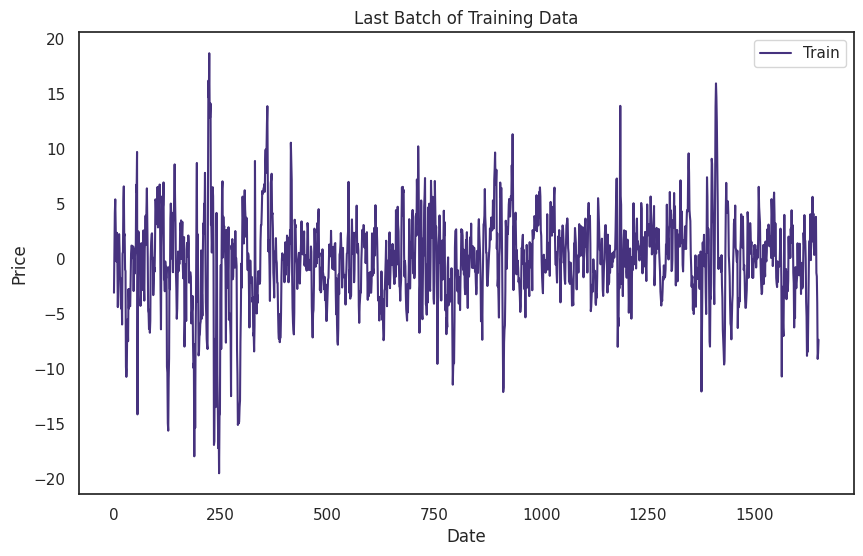

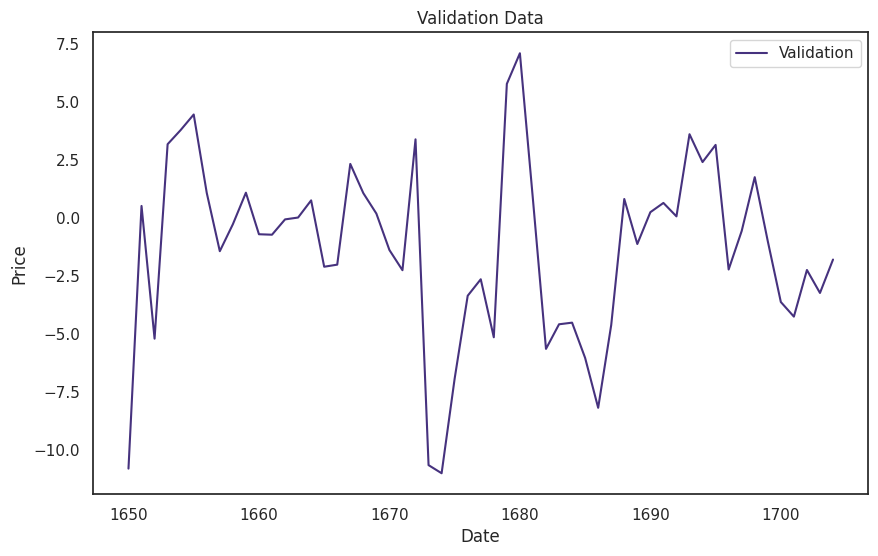

GARCH_train tine: 2.2046499252319336
GARCH_test tine: 20.819151639938354
MAE on Test Set: 5.391541739227797
RMSE on Test Set: 8.032823487972328


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from arch import arch_model
import time
def train_and_evaluate_GARCH(trainG, test_data, revealed_tar):
    start_TRtime = time.time()
    trainG = trainG[trainG['stock_id'] == 0]
    date_Gtrain = trainG[['date_id','target']].reset_index(drop=True)

    cross_val_results = {'Fold': [],  'MAE_val': []}
    cv = TimeSeriesCV(date_Gtrain, holdout_size=30)
    fold = 1
    for train_ind, val_ind in cv:
        tar_train_cv, tar_val_cv = date_Gtrain.iloc[train_ind], date_Gtrain.iloc[val_ind]

        tar_train_cv = tar_train_cv.drop(['date_id'], axis=1)
        tar_val_cv = tar_val_cv.drop(['date_id'], axis=1)

        model = arch_model(tar_train_cv, mean='Zero', vol='GARCH', p=2, q=6)
        model_fit = model.fit()
        yhat = model_fit.forecast(horizon=len(tar_val_cv))

        # Calculate MAE, skipping NaN values
        mae = np.nanmean(np.abs(yhat.mean.values - tar_val_cv.values))
        print("MAE:", mae)

        cross_val_results['Fold'].append(fold)
        cross_val_results['MAE_val'].append(mae)
        fold += 1

    mean_mae = np.nanmean(cross_val_results['MAE_val'])
    print(f'CV Val MAE:', mean_mae)

    # Plot only the last batch of training data
    plt.figure(figsize=(10, 6))
    plt.plot(tar_train_cv.index, tar_train_cv['target'], label='Train')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.title('Last Batch of Training Data')
    plt.legend()
    plt.show()

    # Plot validation data
    plt.figure(figsize=(10, 6))
    plt.plot(tar_val_cv.index, tar_val_cv['target'], label='Validation')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.title('Validation Data')
    plt.legend()
    plt.show()
    end_TRtime = time.time()
    time_garch = end_TRtime - start_TRtime
    print(f'GARCH_train tine:', time_garch)

    start_testgarch = time.time()
    # Test the trained model on the test set
    target_test = revealed_tar[['revealed_target']].reset_index(drop=True)
    fc_test = model_fit.forecast(horizon=len(target_test))
    fc_test.mean.to_csv('garch_fore.csv', index=False)

        # Save forecasted values to CSV
#     fc_test_mean = fc_test.mean.values
#     forecast_df = pd.DataFrame({'forecast': fc_test_mean})
#     forecast_df.to_csv('garch_fore.csv', index=False)

    # Calculate MAE for test set, skipping NaN values
    mae_test = np.nanmean(np.abs(fc_test.mean.values - target_test.values))
    rmse_test = np.sqrt(np.nanmean((fc_test.mean.values - target_test.values)**2))
    end_testgrach = time.time()
    testtime_garch = end_testgrach -start_testgarch
    print(f'GARCH_test tine:', testtime_garch)
    print("MAE on Test Set:", mae_test)
    print("RMSE on Test Set:", rmse_test)


    return model_fit

# 'train_data' and 'test_data' are training and testing datasets respectively
trained_model = train_and_evaluate_GARCH(train_data, test_data, revealed_tar)


The test set results are insignificant in the case of GARCH as the forecasted values are all zeros.

In [ ]:
# import pandas as pd
# garch_predicted = pd.read_csv("/kaggle/input/requireddataset2/garch_fore.csv")
# garch_predicted

,h.00001,h.00002,h.00003,h.00004,h.00005,h.00006,h.00007,h.00008,h.00009,h.00010,h.00011,h.00012,h.00013,h.00014,h.00015,h.00016,h.00017,h.00018,h.00019,h.00020,h.00021,h.00022,h.00023,h.00024,h.00025,h.00026,h.00027,h.00028,h.00029,h.00030,h.00031,h.00032,h.00033,h.00034,h.00035,h.00036,h.00037,h.00038,h.00039,h.00040,h.00041,h.00042,h.00043,h.00044,h.00045,h.00046,h.00047,h.00048,h.00049,h.00050,h.00051,h.00052,h.00053,h.00054,h.00055,h.00056,h.00057,h.00058,h.00059,h.00060,h.00061,h.00062,h.00063,h.00064,h.00065,h.00066,h.00067,h.00068,h.00069,h.00070,h.00071,h.00072,h.00073,h.00074,h.00075,h.00076,h.00077,h.00078,h.00079,h.00080,h.00081,h.00082,h.00083,h.00084,h.00085,h.00086,h.00087,h.00088,h.00089,h.00090,h.00091,h.00092,h.00093,h.00094,h.00095,h.00096,h.00097,h.00098,h.00099,h.00100,...,h.33009,h.33010,h.33011,h.33012,h.33013,h.33014,h.33015,h.33016,h.33017,h.33018,h.33019,h.33020,h.33021,h.33022,h.33023,h.33024,h.33025,h.33026,h.33027,h.33028,h.33029,h.33030,h.33031,h.33032,h.33033,h.33034,h.33035,h.33036,h.33037,h.33038,h.33039,h.33040,h.33041,h.33042,h.33043,h.33044,h.33045,h.33046,h.33047,h.33048,h.33049,h.33050,h.33051,h.33052,h.33053,h.33054,h.33055,h.33056,h.33057,h.33058,h.33059,h.33060,h.33061,h.33062,h.33063,h.33064,h.33065,h.33066,h.33067,h.33068,h.33069,h.33070,h.33071,h.33072,h.33073,h.33074,h.33075,h.33076,h.33077,h.33078,h.33079,h.33080,h.33081,h.33082,h.33083,h.33084,h.33085,h.33086,h.33087,h.33088,h.33089,h.33090,h.33091,h.33092,h.33093,h.33094,h.33095,h.33096,h.33097,h.33098,h.33099,h.33100,h.33101,h.33102,h.33103,h.33104,h.33105,h.33106,h.33107,h.33108
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


# Hybrid Models

In practice, combining hybrid models entails training multiple models, increasing time complexity. The training time for a hybrid model can be approximated by summing the training times of the individual models and adding the averaging time or weighted average time. Although combining multiple models increases training time, it often results in a significant improvement in accuracy. Balancing the need for accuracy with scaling capabilities determines the feasible hybrid model. In this experiment, we use predicted data and various combinations to assess the potential impact of hybrid models, simplifying the process for demonstration purposes.

# CATBOOST AND ARIMA

In [ ]:
check_cat = pd.read_csv('/kaggle/input/datareqdstkpred/catarimalstmpred/catboost_predicted_values.csv')
check_lstm = pd.read_csv('/kaggle/input/datareqdstkpred/catarimalstmpred/predicted_values_lstm.csv')
check_arima = pd.read_csv('/kaggle/input/datareqdstkpred/catarimalstmpred/arima_forecast.csv')
check_target = pd.read_csv('/kaggle/input/datareqdstkpred/actual_target/actual_target.csv')

In [ ]:
print(check_cat)

       predicted_values_catboost
0                      -1.296818
1                       1.690717
2                       3.618150
3                      -0.855626
4                      -1.250965
...                          ...
32887                  -1.719230
32888                  -1.712945
32889                   0.874254
32890                   1.729221
32891                  -2.338359

[32892 rows x 1 columns]


In [ ]:
print(check_lstm)


       predicted_values_lstm
0                   -0.37080
1                   -1.24400
2                   -1.99600
3                   -1.59800
4                   -0.28780
...                      ...
21995                1.56000
21996               -1.28500
21997               -0.17850
21998                0.11487
21999               -0.04740

[22000 rows x 1 columns]


In [ ]:
print(check_arima)


       predicted_mean
0            0.230527
1           -0.970921
2           -0.091342
3            0.796347
4           -1.034538
...               ...
32995       -0.261401
32996       -0.261401
32997       -0.261401
32998       -0.261401
32999       -0.261401

[33000 rows x 1 columns]


In [ ]:
print(check_target)

       revealed_target
0            -2.310276
1           -12.850165
2            -0.439882
3             7.259846
4             4.780292
...                ...
32995         1.599789
32996        -8.440018
32997         5.149841
32998        -0.249743
32999        -7.609725

[33000 rows x 1 columns]


# ARIMA AND CATBOOST

### AVERAGE METHOD

* We determine the length of the shortest subset of predictions (min_length) to ensure consistency.
* We truncate the true labels (true_labels_subset) to match the length of the predictions using slicing.
* We then proceed to evaluate the hybrid model with consistent lengths of predictions and true labels.

In [ ]:
import numpy as np
import pandas as pd

def take_subset_predictions(catboost_pred, arima_pred):
    # Find the minimum length of predicted values
    min_length = min(len(catboost_pred), len(arima_pred))

    # Take a subset of predictions from each model to match the minimum length
    catboost_pred_subset = catboost_pred[:min_length]
    arima_pred_subset = arima_pred[:min_length]

    return catboost_pred_subset, arima_pred_subset


catboost_pred = pd.read_csv('/kaggle/input/datareqdstkpred/catarimalstmpred/catboost_predicted_values.csv', delimiter=',')
arima_pred = pd.read_csv('/kaggle/input/datareqdstkpred/catarimalstmpred/arima_forecast.csv', delimiter=',')

catboost_pred_subset, arima_pred_subset = take_subset_predictions(catboost_pred, arima_pred)

Since the predicted values has different length we are taking a subset of predictions from each model to match the minimum length

Combined MAE: 5.423293860122396
Combined RMSE: 8.057310836811372


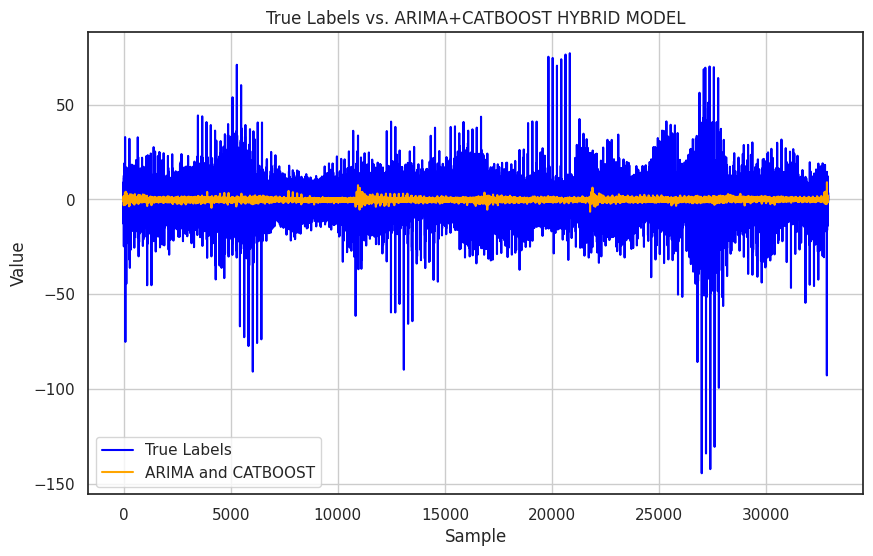

In [ ]:
import matplotlib.pyplot as plt

def evaluate_hybrid_model(catboost_pred, arima_pred, true_labels):
    # Take subsets of predictions from both models
    catboost_pred_subset, arima_pred_subset = take_subset_predictions(catboost_pred, arima_pred)

    # Determine the length of the shortest subset of predictions
    min_length = min(len(catboost_pred_subset), len(arima_pred_subset))

    # Truncate the true labels to match the length of the predictions
    true_labels_subset = true_labels[:min_length]

    # Combine predicted values using simple averaging
    combined_pred = (catboost_pred_subset + arima_pred_subset) / 2

    # Calculate MAE and RMSE for the combined predictions
    mae_combined = mean_absolute_error(true_labels_subset, combined_pred)
    rmse_combined = mean_squared_error(true_labels_subset, combined_pred, squared=False)

    print("Combined MAE:", mae_combined)
    print("Combined RMSE:", rmse_combined)


    # Plot predictions vs. true labels
    plt.figure(figsize=(10, 6))
    plt.plot(true_labels_subset, label='True Labels', color='blue')
    plt.plot(combined_pred, label='ARIMA and CATBOOST', color='orange')
    plt.xlabel('Sample')
    plt.ylabel('Value')
    plt.title('True Labels vs. ARIMA+CATBOOST HYBRID MODEL')
    plt.legend()
    plt.grid(True)
    plt.show()

catboost_pred = np.loadtxt('/kaggle/input/datareqdstkpred/catarimalstmpred/catboost_predicted_values.csv', delimiter=',',skiprows=1)
arima_pred = np.loadtxt('/kaggle/input/datareqdstkpred/catarimalstmpred/arima_forecast.csv', delimiter=',', skiprows=1)
true_labels = np.loadtxt('/kaggle/input/datareqdstkpred/actual_target/actual_target.csv', delimiter=',', skiprows=1)

evaluate_hybrid_model(catboost_pred, arima_pred, true_labels)


### ASSIGNING WEIGHTS METHOD

To have subsets of predictions with the same length for both models

In this code:

* We calculate the weights based on the MAE of each model. The weight for each model is proportional to the inverse of its MAE.
* We use these weights to perform weighted averaging of the predictions.
* We calculate the MAE and RMSE for the weighted combined predictions.
* We plot the true labels against the predictions of the weighted hybrid model.

Weighted Combined MAE: 5.425473664162272
Weighted Combined RMSE: 8.059245336249576


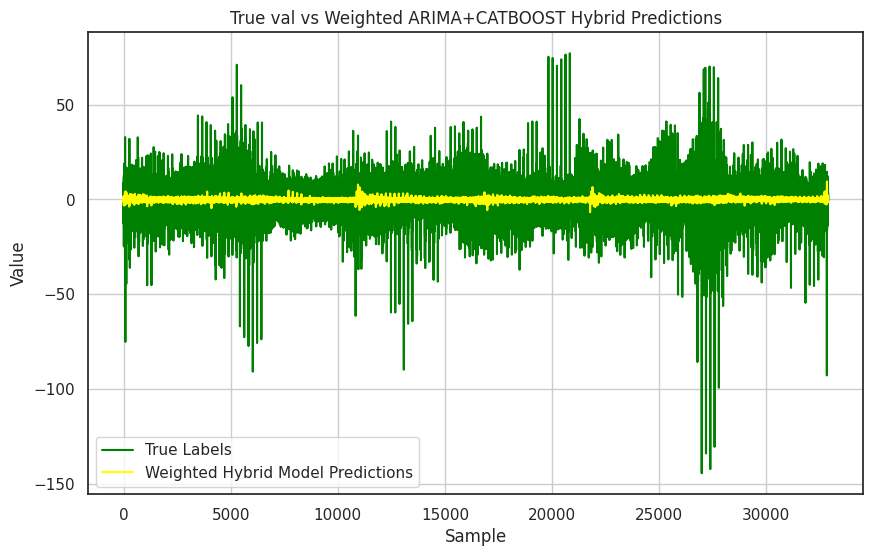

In [ ]:
import numpy as np

catboost_mae = 5.492

arima_mae = 5.982
def evaluate_hybrid_model_weighted(catboost_pred, arima_pred, true_labels, catboost_mae, arima_mae):
    # Take subsets of predictions from both models
    catboost_pred_subset, arima_pred_subset = take_subset_predictions(catboost_pred, arima_pred)

    # Determine the length of the shortest subset of predictions
    min_length = min(len(catboost_pred_subset), len(arima_pred_subset))

    # Truncate the true labels to match the length of the predictions
    true_labels_subset = true_labels[:min_length]

    # Calculate weights based on MAE of each model
    catboost_weight = arima_mae / (catboost_mae + arima_mae)
    arima_weight = 1 - catboost_weight

    # Combine predicted values using weighted averaging
    combined_pred_weighted = (catboost_weight * catboost_pred_subset) + (arima_weight * arima_pred_subset)

    # Calculate MAE and RMSE for the weighted combined predictions
    mae_combined_weighted = mean_absolute_error(true_labels_subset, combined_pred_weighted)
    rmse_combined_weighted = mean_squared_error(true_labels_subset, combined_pred_weighted, squared=False)

    print("Weighted Combined MAE:", mae_combined_weighted)
    print("Weighted Combined RMSE:", rmse_combined_weighted)

    # Plot predictions vs. true labels for the weighted method
    plt.figure(figsize=(10, 6))
    plt.plot(true_labels_subset, label='True Labels', color='green')
    plt.plot(combined_pred_weighted, label='Weighted Hybrid Model Predictions', color='yellow')
    plt.xlabel('Sample')
    plt.ylabel('Value')
    plt.title('True val vs Weighted ARIMA+CATBOOST Hybrid Predictions')
    plt.legend()
    plt.grid(True)
    plt.show()

    catboost_mae = 5.492

    arima_mae = 5.982

catboost_pred = np.loadtxt('/kaggle/input/requireddataset2/catarimalstmpred/catboost_predicted_values.csv', delimiter=',',skiprows=1)
arima_pred = np.loadtxt('/kaggle/input/requireddataset2/catarimalstmpred/arima_forecast.csv', delimiter=',', skiprows=1)
true_labels = np.loadtxt('/kaggle/input/requireddataset2/actual_target/actual_target.csv', delimiter=',', skiprows=1)


evaluate_hybrid_model_weighted(catboost_pred, arima_pred, true_labels, catboost_mae, arima_mae)


# LSTM AND ARIMA

### AVERAGE METHOD

Combined MAE: 5.247337694019503
Combined RMSE: 7.623441078249879


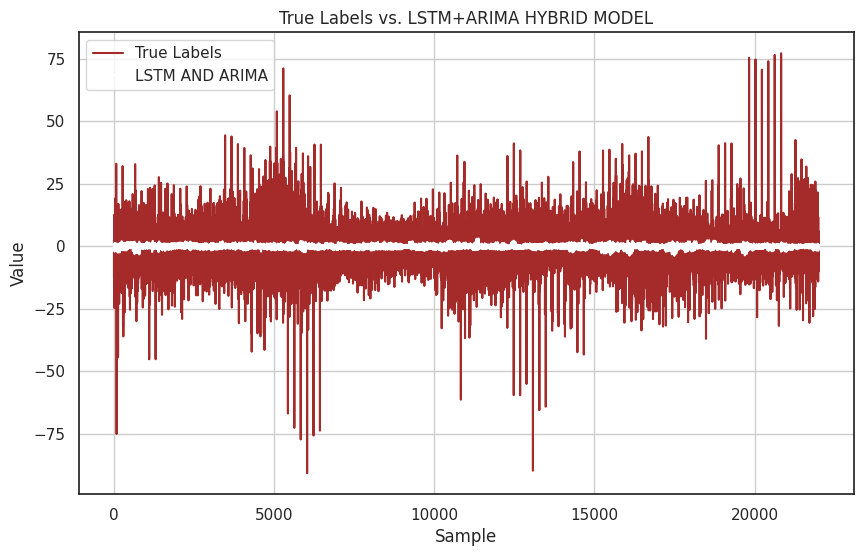

In [ ]:
import matplotlib.pyplot as plt

def eval_hybrid_model(lstm_pred, arima_pred, true_labels):
    # Take subsets of predictions from both models
    lstm_pred_subset, arima_pred_subset = take_subset_predictions(lstm_pred, arima_pred)

    # Determine the length of the shortest subset of predictions
    min_length = min(len(lstm_pred_subset), len(arima_pred_subset))

    # Truncate the true labels to match the length of the predictions
    true_labels_subset = true_labels[:min_length]

    # Combine predicted values using simple averaging
    combined_pred = (lstm_pred_subset + arima_pred_subset) / 2

    # Calculate MAE and RMSE for the combined predictions
    mae_combined = mean_absolute_error(true_labels_subset, combined_pred)
    rmse_combined = mean_squared_error(true_labels_subset, combined_pred, squared=False)

    print("Combined MAE:", mae_combined)
    print("Combined RMSE:", rmse_combined)


    # Plot predictions vs. true labels
    plt.figure(figsize=(10, 6))
    plt.plot(true_labels_subset, label='True Labels', color='brown')
    plt.plot(combined_pred, label='LSTM AND ARIMA', color='white')
    plt.xlabel('Sample')
    plt.ylabel('Value')
    plt.title('True Labels vs. LSTM+ARIMA HYBRID MODEL')
    plt.legend()
    plt.grid(True)
    plt.show()

lstm_pred = np.loadtxt('/kaggle/input/requireddataset2/catarimalstmpred/predicted_values_lstm.csv', delimiter=',',skiprows=1)
arima_pred = np.loadtxt('/kaggle/input/requireddataset2/catarimalstmpred/arima_forecast.csv', delimiter=',', skiprows=1)
true_labels = np.loadtxt('/kaggle/input/requireddataset2/actual_target/actual_target.csv', delimiter=',', skiprows=1)

eval_hybrid_model(lstm_pred, arima_pred, true_labels)


# LSTM AND CATBOOST

### AVERAGE

Combined MAE: 5.247337694019503
Combined RMSE: 7.623441078249879


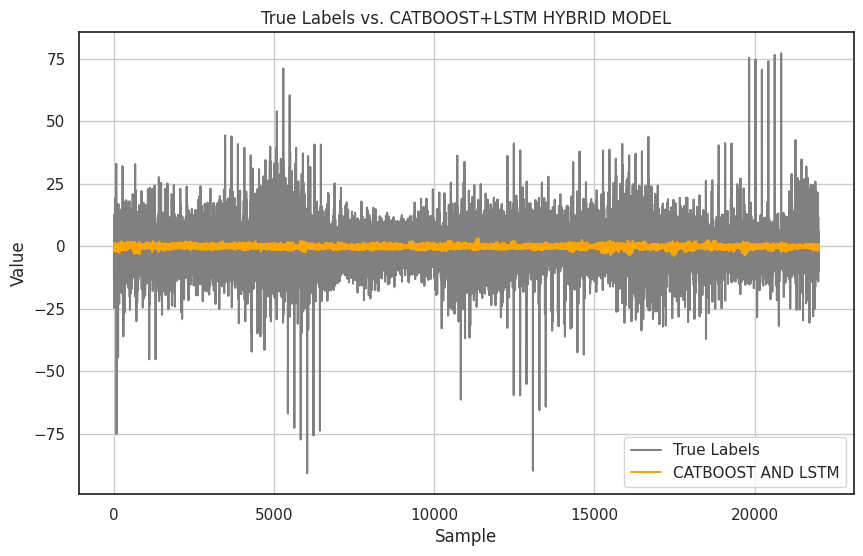

In [ ]:
import matplotlib.pyplot as plt

def eval_hybrid_model(lstm_pred, catboost_pred, true_labels):
    # Take subsets of predictions from both models
    lstm_pred_subset, arima_pred_subset = take_subset_predictions(lstm_pred, arima_pred)

    # Determine the length of the shortest subset of predictions
    min_length = min(len(lstm_pred_subset), len(arima_pred_subset))

    # Truncate the true labels to match the length of the predictions
    true_labels_subset = true_labels[:min_length]

    # Combine predicted values using simple averaging
    combined_pred = (lstm_pred_subset + arima_pred_subset) / 2

    # Calculate MAE and RMSE for the combined predictions
    mae_combined = mean_absolute_error(true_labels_subset, combined_pred)
    rmse_combined = mean_squared_error(true_labels_subset, combined_pred, squared=False)

    print("Combined MAE:", mae_combined)
    print("Combined RMSE:", rmse_combined)


    # Plot predictions vs. true labels
    plt.figure(figsize=(10, 6))
    plt.plot(true_labels_subset, label='True Labels', color='grey')
    plt.plot(combined_pred, label='CATBOOST AND LSTM', color='orange')
    plt.xlabel('Sample')
    plt.ylabel('Value')
    plt.title('True Labels vs. CATBOOST+LSTM HYBRID MODEL')
    plt.legend()
    plt.grid(True)
    plt.show()

lstm_pred = np.loadtxt('/kaggle/input/requireddataset2/catarimalstmpred/predicted_values_lstm.csv', delimiter=',',skiprows=1)
catboost_pred = np.loadtxt('/kaggle/input/requireddataset2/catarimalstmpred/catboost_predicted_values.csv', delimiter=',', skiprows=1)
true_labels = np.loadtxt('/kaggle/input/requireddataset2/actual_target/actual_target.csv', delimiter=',', skiprows=1)

eval_hybrid_model(lstm_pred, arima_pred, true_labels)


### ASSIGNING WEIGHTS

In this code:

* We calculate the weights based on the MAE of each model. The weight for each model is proportional to the inverse of its MAE.
* We use these weights to perform weighted averaging of the predictions.
* We calculate the MAE and RMSE for the weighted combined predictions.
* We plot the true labels against the predictions of the weighted hybrid model.

Combined MAE: 5.279604983553139
Combined RMSE: 7.649403053225271


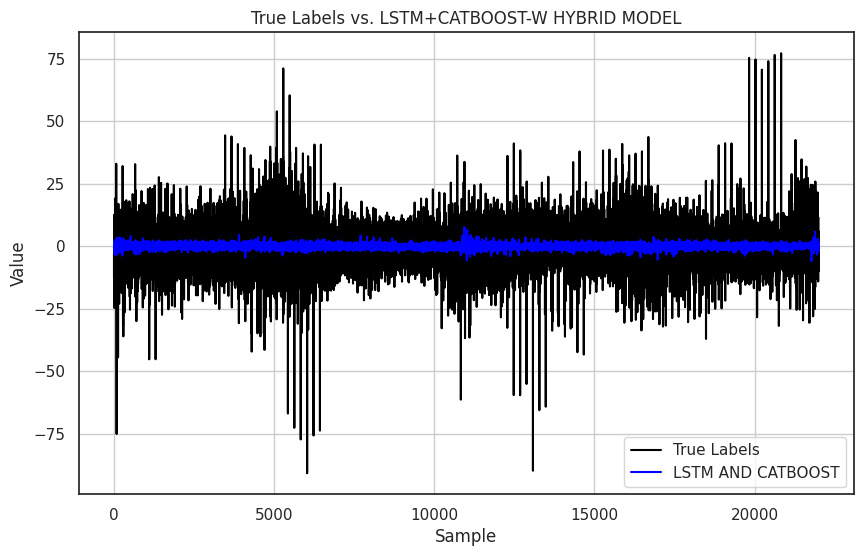

In [ ]:
import matplotlib.pyplot as plt

def eval_hybrid_model(lstm_pred, arima_pred, true_labels):
    # Take subsets of predictions from both models
    lstm_pred_subset, catboost_pred_subset = take_subset_predictions(lstm_pred, catboost_pred)

    # Determine the length of the shortest subset of predictions
    min_length = min(len(lstm_pred_subset), len(catboost_pred_subset))

    # Truncate the true labels to match the length of the predictions
    true_labels_subset = true_labels[:min_length]

    # Combine predicted values using simple averaging
    combined_pred = (lstm_pred_subset + catboost_pred_subset) / 2

    # Calculate MAE and RMSE for the combined predictions
    mae_combined = mean_absolute_error(true_labels_subset, combined_pred)
    rmse_combined = mean_squared_error(true_labels_subset, combined_pred, squared=False)

    print("Combined MAE:", mae_combined)
    print("Combined RMSE:", rmse_combined)


    # Plot predictions vs. true labels
    plt.figure(figsize=(10, 6))
    plt.plot(true_labels_subset, label='True Labels', color='black')
    plt.plot(combined_pred, label='LSTM AND CATBOOST', color='blue')
    plt.xlabel('Sample')
    plt.ylabel('Value')
    plt.title('True Labels vs. LSTM+CATBOOST-W HYBRID MODEL')
    plt.legend()
    plt.grid(True)
    plt.show()

lstm_pred = np.loadtxt('/kaggle/input/requireddataset2/catarimalstmpred/predicted_values_lstm.csv', delimiter=',',skiprows=1)
catboost_pred = np.loadtxt('/kaggle/input/requireddataset2/catarimalstmpred/catboost_predicted_values.csv', delimiter=',', skiprows=1)
true_labels = np.loadtxt('/kaggle/input/requireddataset2/actual_target/actual_target.csv', delimiter=',', skiprows=1)

eval_hybrid_model(lstm_pred, arima_pred, true_labels)


### Refrences


*   https://www.kaggle.com/code/yolovo/arima-and-garch-model-for-ts-cv


*   Koo, E. and Kim, G., 2022. A Hybrid Prediction Model Integrating GARCH Models With a Distribution Manipulation Strategy Based on LSTM Networks for Stock Market Volatility. IEEE Access, 10.


* Ho, M. K., Darman, H. and Musa, S., 2021b. Stock Price Prediction Using ARIMA, Neural Network and LSTM Models. Journal of Physics: Conference Series, 1988 (1), 012041.